  # Inference on TPSA Classification models 

# Setup

In [1]:
%load_ext autoreload  
%autoreload 2
from IPython.display import display, HTML, Image
from IPython.core.interactiveshell import InteractiveShell
display(HTML("<style>.container { width:98% !important; }</style>"))
InteractiveShell.ast_node_interactivity = "all"

In [2]:
import os
import sys
import random
from typing import List, Tuple
from types import SimpleNamespace
from functools import partial
import pprint
import logging
from datetime import datetime
for p in ['./src','../pt-snnl','../..']:
    if p not in sys.path:
        print(f"insert {p}")
        sys.path.insert(0, p)
print(sys.path)

import tqdm
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import pandas as pd

import scipy
import scipy.stats as sps
import sklearn.metrics as skm
from scipy.spatial.distance import pdist, squareform, euclidean

import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt  # for making figures
from torchinfo import summary

SUMMARY_COL_NAMES = ["input_size", "output_size", "num_params", "params_percent", "mult_adds", "trainable"]
torch.set_printoptions(precision=None, threshold=None, edgeitems=None, linewidth=180, profile=None, sci_mode=None)
torch.manual_seed(42);   # seed rng for reproducibility
pp = pprint.PrettyPrinter(indent=4)
pd.options.display.width = 132
np.set_printoptions(edgeitems=3, infstr='inf', linewidth=150, nanstr='nan')

os.environ["WANDB_NOTEBOOK_NAME"] = "AE-MAIN-SNNL.ipynb"
# os.environ["CUDA_LAUNCH_BLOCKING"] = "1"
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1,2"

torch.set_num_threads(4)  ## <--- limit to ~ 2 CPUs
torch.get_num_threads()

insert ./src
insert ../pt-snnl
insert ../..
['../..', '../pt-snnl', './src', '/home/kevin/WSL-shared/cellpainting/cj-datasets', '/home/kevin/miniforge3/envs/cp311/lib/python311.zip', '/home/kevin/miniforge3/envs/cp311/lib/python3.11', '/home/kevin/miniforge3/envs/cp311/lib/python3.11/lib-dynload', '', '/home/kevin/miniforge3/envs/cp311/lib/python3.11/site-packages', '/home/kevin/miniforge3/envs/cp311/lib/python3.11/site-packages/huggingface_hub-0.20.3-py3.8.egg']


4

In [3]:
# from KevinsRoutines.utils.utils_general import list_namespace, save_to_pickle, load_from_pickle, get_device
import KevinsRoutines.utils as myutils

from utils.utils_cellpainting import save_checkpoint, load_checkpoint
from utils.dataloader import CellpaintingDataset, InfiniteDataLoader, custom_collate_fn, dynamic_collate_fn
from utils.utils_notebooks import plot_cls_metrics, compute_classification_metrics, run_model_on_test_data,\
                                train, validation, accuracy_fn, fit, build_model, display_cellpainting_batch, \
                                run_classification_inference, define_inference_datasets

/home/kevin/miniforge3/envs/cp311/lib/python3.11/site-packages/dask/dataframe/_pyarrow_compat.py:17: FutureWarning: Minimal version of pyarrow will soon be increased to 14.0.1. You are using 11.0.0. Please consider upgrading.
  warnings.warn(


In [4]:
# Set visible GPU device 
# ----------------------------------------------
# os.environ["CUDA_VISIBLE_DEVICES"] = '0'
myutils.set_device(2);
DEVICE = myutils.get_device(verbose = True);
myutils.set_global_seed(9999)
print(DEVICE)

 Switched to: "cuda:2"   Device Name: NVIDIA TITAN Xp               


'cuda:2'

Dev Id   Device Name                    Total Memory                     InUse                            Free Memory 
   0     Quadro GV100                   34,069,872,640 B/ (31.73 GB)  	 325,058,560 B / (0.30 GB)  	 33,744,814,080 B / (31.43 GB)  
   1     Quadro GV100                   34,069,872,640 B/ (31.73 GB)  	 325,058,560 B / (0.30 GB)  	 33,744,814,080 B / (31.43 GB)  
   2     NVIDIA TITAN Xp                12,774,539,264 B/ (11.90 GB)  	 157,417,472 B / (0.15 GB)  	 12,617,121,792 B / (11.75 GB)   *** CURRENT DEVICE *** 

 Current CUDA Device is:  "cuda:2"  Device Name: NVIDIA TITAN Xp
 Seed value set to 9999 in random, np.random, and torch
cuda:2


In [5]:
timestamp = datetime.now().strftime('%Y_%m_%d_%H:%M:%S')
logger = logging.getLogger(__name__)
logLevel = os.environ.get('LOG_LEVEL', 'INFO').upper()
FORMAT = '%(asctime)s - %(name)s - %(levelname)s: - %(message)s'
logging.basicConfig(level="INFO", format= FORMAT)
logger.info(f" Excution started : {timestamp} ")
logger.info(f" Pytorch version  : {torch.__version__}")
logger.info(f" Scipy version    : {scipy.__version__}  \t\t Numpy version : {np.__version__}")
logger.info(f" Pandas version   : {pd.__version__}  ")

2024-10-17 22:02:50,164 - __main__ - INFO: -  Excution started : 2024_10_17_22:02:50 
2024-10-17 22:02:50,165 - __main__ - INFO: -  Pytorch version  : 2.2.0
2024-10-17 22:02:50,165 - __main__ - INFO: -  Scipy version    : 1.11.4  		 Numpy version : 1.26.2
2024-10-17 22:02:50,166 - __main__ - INFO: -  Pandas version   : 2.2.0  


# Args and Parms

In [6]:
AE_HIDDEN     = 512
COMPOUNDS_PER_BATCH = 600

METADATA_COLUMNS = 11 

INPUT_PATH = f"/home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/"
CKPT_PATH = "./saved_models/embedding_models"

In [7]:
## total rows = 346,542
## Rows on 3sample_profiles_1482_HashOrder_training.csv: 312,000
## Split to:
##     Train      : 277,200
##     Validation :  21,600
##     Test       :  12,600
##     left over  :     600
cellpainting_args = {'compounds_per_batch': COMPOUNDS_PER_BATCH,
                     'train_start'        : 21_600, ## arbritary jump
                     'train_end'          : 34_200,
                     'val_start'          : 9_000,
                     'val_end'            : 21_600,
                     'test_start'         : 0,
                     'test_end'           : 12_600,
                    }

- **4 layer model :**

    Input --> Hidden1 --> (BN/NL) ---> Hidden2 ---> (BN/NL) ---> Hidden3 --->  (BN/NL) ---> 1
   
    -  **20240909_1800** : Read from 20240906_2201  - Run on 4 FC layers model, model configuration UNKNOWN
    -  **20240909_1801** : Read from 20240906_2201  - Run on 4 FC layers model, Relu non linearities (NO Batch Norm)
    -  **20240909_2100** : Read from 20240906_2201  - Run on 4 FC layers model, with BATCH NORM and tanh non linearities
    -  <br><br/>
    -  **20240929_2000** : Run on 4 FC layer with BATCH NORM and tanh non linearities - Read from 20240917_2017 (Baseline, 600 CPB, Latent 250)
    -  **20240929_2015** : Run on 4 FC layer with BATCH NORM and tanh non linearities - Read from 20240917_2004 (SNNL, 600 CPB, Latent 250, SNN Factor 3)
    -  **20240929_2030** : Run on 4 FC layer with BATCH NORM and tanh non linearities - Read from 20240924_0146 (SNNL, 600 CPB, Latent 250, SNN Factor 30)
    -  <br><br/>
 
 - **Single Hidden Layer - 256**

   Input --> Hidden1 --> (Tanh) --->  1
    -  **20240916_1830** : Read from 20240906_2201 - Run on 1 FC layers model (includes final layer), Input --> 256 --> Tanh --> 1 , (SNNL - CPB 600, LAT 150, SNN Factor 3)
    -  **20240926_1900** : Read from 20240917_2017 - Run on 1 FC layers model (includes final layer), Input --> 256 --> Tanh --> 1 , (BASELINE - CPB 600, LAT 250, SNN Factor 0)
    -  **20240926_1930** : Read from 20240917_2004 - Run on 1 FC layers model (includes final layer), Input --> 256 --> Tanh --> 1 , (SNNL - CPB 600, LAT 250, SNN Factor 3)
    -  **20240926_2000** : Read from 20240924_0146 - Run on 1 FC layers model (includes final layer), Input --> 256 --> Tanh --> 1 , (SNNL - CPB 600, LAT 250, SNN Factor 30)
<br>

 - **Single Hidden Layer - 512**

    -  **20240921_0700** : Read from 20240906_2201 - Run on 1 FC layers model (includes final layer), Input --> 512 --> Tanh --> 1 , (SNNL - CPB 600, LAT 150, SNN Factor 3)    

### commented / moved 

In [24]:
# n_input    = AE_LATENT_DIM  # the embedding dimensionality 
# N_HIDDEN_1 = 256  # Classifier Layer
# n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
# n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
# n_hidden_3 = 128

# AE_CKPTTYPE = "BEST"
# AE_CKPTTYPE = "LAST"

# SNNL AUTOENCODERS
# AE_RUNMODE = "snnl"
# AE_DATETIME = "20240718_1956"
# AE_DATETIME = "20240906_2201"     # Autoencoder training - SNNL, CPB = 600, Latent 150, WD = 0.001, SNN Factor 3

# AE_DATETIME = "20240917_2004"     # Autoencoder training - SNNL, CPB = 600, Latent 250, WD = 0.001, SNN Factor 3
# AE_DATETIME = "20240924_0146"     # Autoencoder training - SNNL, CPB = 600, Latent 250, WD = 0.001, SNN Factor 30

## BASELINE AUTOENCODERS 
# AE_RUNMODE = 'base'
# AE_DATETIME = "20240917_2017"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)

In [25]:
# embedding_file_cols = ['Metadata_Source', 'Metadata_Batch', 'Metadata_Plate', 'Metadata_Well', 'Metadata_JCP2022', 'Metadata_Hash', 'Metadata_Bin', 'Metadata_TPSA', 'Metadata_lnTPSA', 'Metadata_log10TPSA', 'Metadata_Permiation']
# embedding_file_cols += [f'Feature_{x:03d}' for x in range(AE_LATENT_DIM)]
# input_num_cols = len(embedding_file_cols) + AE_LATENT_DIM
# print(len(embedding_file_cols))

In [10]:
# CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
# print(CKPT_FILE_BASE)

# CKPT_FULL_BASE = os.path.join(CKPT_PATH, CKPT_FILE_BASE)
# print(CKPT_FULL_BASE)

In [11]:
 # myutils.get_device(verbose = True)
# def run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
#     checkpoint = CKPT_FILE.format(ep=epoch)
#     model, _, _, _ = load_checkpoint(model, None, None, dict(), checkpoint, ckpt_path = CKPT_PATH, verbose = False)
#     _ = model.eval();
#     mdl_outputs = run_model_on_test_data(model, data_loader[data_type],DEVICE, title = data_type,  verbose = False)
#     if report:
#         mo = compute_classification_metrics(mdl_outputs, epochs = epoch, title = data_type, verbose = True)
#     if plot:
#         plot_cls_metrics(mdl_outputs.y_true, mdl_outputs.y_prob, mdl_outputs.y_pred, title = data_type, epochs = epoch )
#         plt.show()

In [12]:
# data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE)
# dataset = dict()
# data_loader = dict()

# for datatype in ['train', 'val', 'test']:
#     dataset[datatype] = CellpaintingDataset(type = datatype, **cellpainting_args)
#     data_loader[datatype] = InfiniteDataLoader(dataset = dataset[datatype], batch_size=1, shuffle = False, num_workers = 0, 
#                                                collate_fn = partial(dynamic_collate_fn, tpsa_threshold = dataset[datatype].tpsa_threshold) )
# data_loader.keys()

In [13]:
# for dataset in ['train', 'val', 'test']:
# for dataset in ['test']:
#     for idx, batch in enumerate(data_loader[dataset]):
#         for b in batch :
#             print(b.shape)
#         display_cellpainting_batch(idx, batch)
#         if idx == 0:
#             break

In [14]:
# # -----------------------------------------
# #  Count pos/neg labels in each dataset
# # -----------------------------------------
# for datatype in ['train', 'val', 'test']:
#     MINIBATCH_SIZE = data_loader[datatype].dataset.sample_size * data_loader[datatype].dataset.compounds_per_batch
#     print(f" {datatype.capitalize()} Minibatch size : {MINIBATCH_SIZE}") 
# print()

# for datatype in ['train', 'val', 'test']:
#     minibatches = len(data_loader[datatype]) // MINIBATCH_SIZE
#     ttl_rows, ttl_rows_2 = 0, 0
#     ttl_pos_labels, ttl_pos_labels_2 = 0, 0
#     with tqdm.tqdm(enumerate(data_loader[datatype]), initial=0, total = minibatches, position=0, file=sys.stdout,
#                    leave= False, desc=f" Count labels ") as t_warmup:
#         for batch_count, (_, batch_labels, _, _, _, _, batch_labels_2) in t_warmup:
#             ttl_rows += batch_labels.shape[0]
#             ttl_rows_2 += batch_labels_2.shape[0]
#             ttl_pos_labels += batch_labels.sum()
#             ttl_pos_labels_2 += batch_labels_2.sum()
#     ttl_neg_labels = ttl_rows - ttl_pos_labels
#     ttl_neg_labels_2 = ttl_rows_2 - ttl_pos_labels_2
#     ttl = f"\n Dataset: {datatype} -  len of {datatype} data loader: {len(data_loader[datatype])}   number of batches: {minibatches}"
#     print(ttl)
#     print('-'*len(ttl))
#     print(f" total rows     : {ttl_rows:7d}")
#     print(f" total pos rows : {ttl_pos_labels:7.0f} - {ttl_pos_labels*100.0/ttl_rows:5.2f}%         alternative pos rows : {ttl_pos_labels_2:7.0f} - {ttl_pos_labels_2*100.0/ttl_rows:5.2f}%      ")
#     print(f" total neg rows : {ttl_neg_labels:7.0f} - {ttl_neg_labels*100.0/ttl_rows:5.2f}%         alternative neg rows : {ttl_neg_labels_2:7.0f} - {ttl_neg_labels_2*100.0/ttl_rows:5.2f}%")
#     print()

    Train Minibatch size : 1800
     Val Minibatch size : 1800
     Test Minibatch size : 1800
                   
     Dataset: train -  len of train data loader: 12600   number of batches: 7
    --------------------------------------------------------------------------
     total rows     :   12600
     total pos rows :    6579 - 52.21%         alternative pos rows :    1479 - 11.74%      
     total neg rows :    6021 - 47.79%         alternative neg rows :   11121 - 88.26%
         
     Dataset: val -  len of val data loader: 12600   number of batches: 7
    ----------------------------------------------------------------------
     total rows     :   12600
     total pos rows :    6744 - 53.52%         alternative pos rows :    1422 - 11.29%      
     total neg rows :    5856 - 46.48%         alternative neg rows :   11178 - 88.71%
                                                                                                                                                                
     Dataset: test -  len of test data loader: 12600   number of batches: 7
    ------------------------------------------------------------------------
     total rows     :   12600
     total pos rows :    6357 - 50.45%         alternative pos rows :    1431 - 11.36%      
     total neg rows :    6243 - 49.55%         alternative neg rows :   11169 - 88.64%

# Single Layer 256

## Baseline (cpb 600, Latent 150) ---->  (Single 256 layer NN)

In [8]:
AE_RUNMODE = 'base'
AE_DATETIME = "20240923_1943"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "BEST"
# RUN_DATETIME = '20241002_1915'
# RUN_DATETIME = '20241002_1916'
# RUN_DATETIME = '20241002_1917'
RUN_DATETIME = '20241002_1918'

AE_LATENT_DIM = 150
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-16 17:36:57,890 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-16 17:36:57,891 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
2024-10-16 17:36:57,892 - utils.dataloader - INFO: -  type    :  train
2024-10-16 17:36:57,893 - utils.dataloader - INFO: -  start   :  21600
2024-10-16 17:36:57,893 - utils.dataloader - INFO: -  end     :  34200
2024-10-16 17:36:57,894 - utils.dataloader - INFO: -  numrows :  12600
2024-10-16 17:36:57,896 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-16 17:36:57,897 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-16 17:36:57,897 - utils.dataloader - INFO: -  sample_size :  3
2024-10-16 17:36:57,898 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-16 17:36:57,899 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1918_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1918_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1915_ep_100
 Test  Acc : 88.58 % 	 roc_auc: 0.5764 	 Precision: 0.3889 	 Recall: 0.0098 	 F1: 0.0191

 Test Label counts:  True: [11169  1431] 	 Pred: [12564    36] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.39      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.64      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



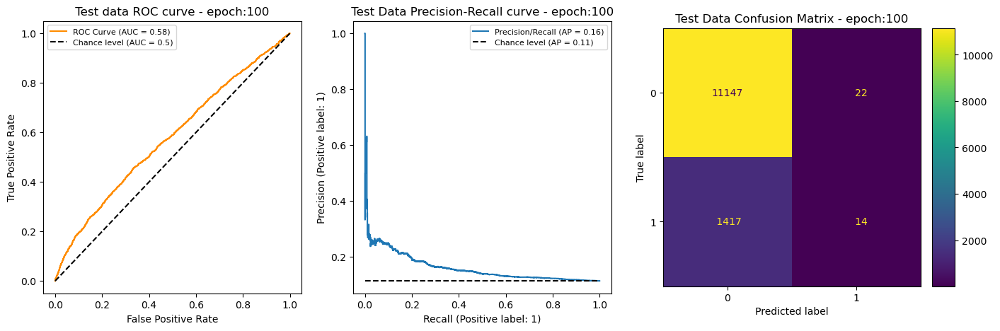

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1915_ep_200
 Test  Acc : 88.37 % 	 roc_auc: 0.5709 	 Precision: 0.2667 	 Recall: 0.0140 	 F1: 0.0266

 Test Label counts:  True: [11169  1431] 	 Pred: [12525    75] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.27      0.01      0.03      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



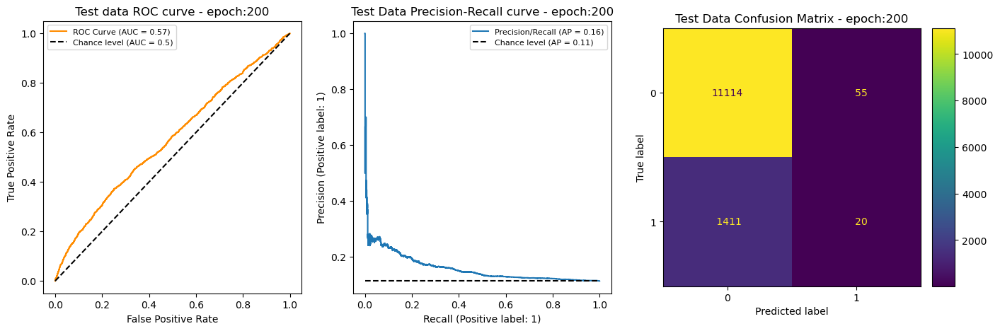

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1915_ep_300
 Test  Acc : 88.30 % 	 roc_auc: 0.5675 	 Precision: 0.2410 	 Recall: 0.0140 	 F1: 0.0264

 Test Label counts:  True: [11169  1431] 	 Pred: [12517    83] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.24      0.01      0.03      1431

    accuracy                           0.88     12600
   macro avg       0.56      0.50      0.48     12600
weighted avg       0.81      0.88      0.83     12600



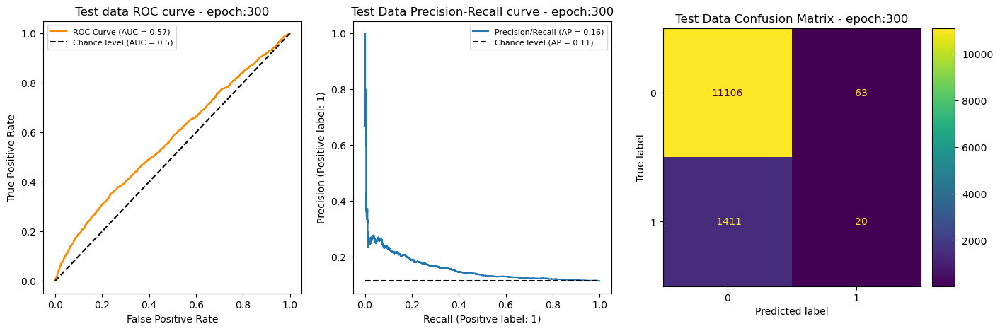

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1915_ep_400
 Test  Acc : 88.32 % 	 roc_auc: 0.5670 	 Precision: 0.2644 	 Recall: 0.0161 	 F1: 0.0303

 Test Label counts:  True: [11169  1431] 	 Pred: [12513    87] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.26      0.02      0.03      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.51      0.48     12600
weighted avg       0.82      0.88      0.83     12600



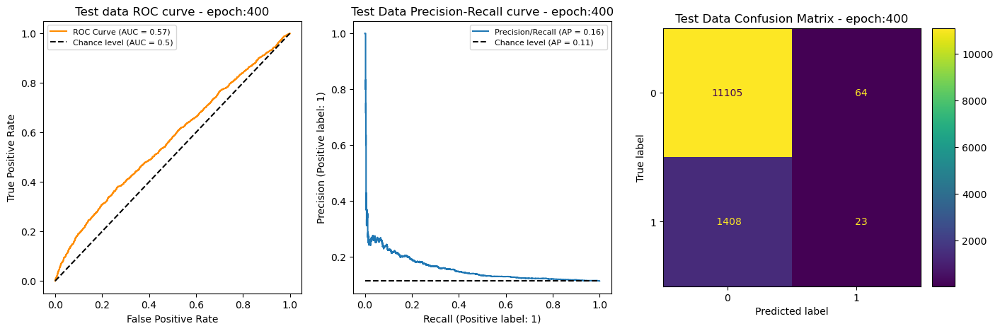

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1915_ep_500
 Test  Acc : 88.31 % 	 roc_auc: 0.5668 	 Precision: 0.2667 	 Recall: 0.0168 	 F1: 0.0316

 Test Label counts:  True: [11169  1431] 	 Pred: [12510    90] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.27      0.02      0.03      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.51      0.48     12600
weighted avg       0.82      0.88      0.83     12600



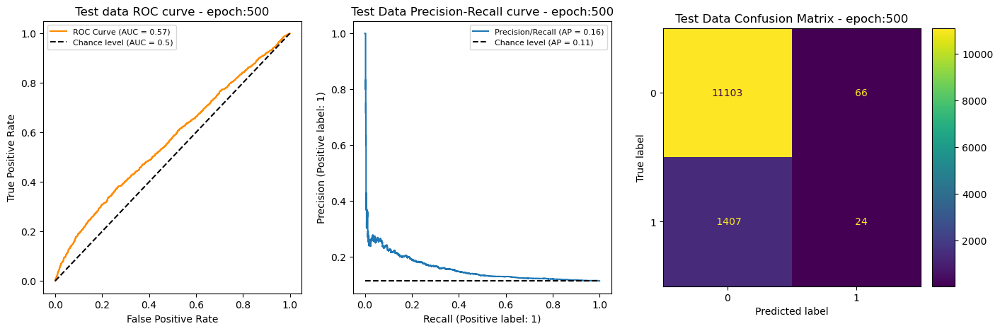

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1915_ep_600
 Test  Acc : 88.29 % 	 roc_auc: 0.5668 	 Precision: 0.2581 	 Recall: 0.0168 	 F1: 0.0315

 Test Label counts:  True: [11169  1431] 	 Pred: [12507    93] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.26      0.02      0.03      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.48     12600
weighted avg       0.82      0.88      0.83     12600



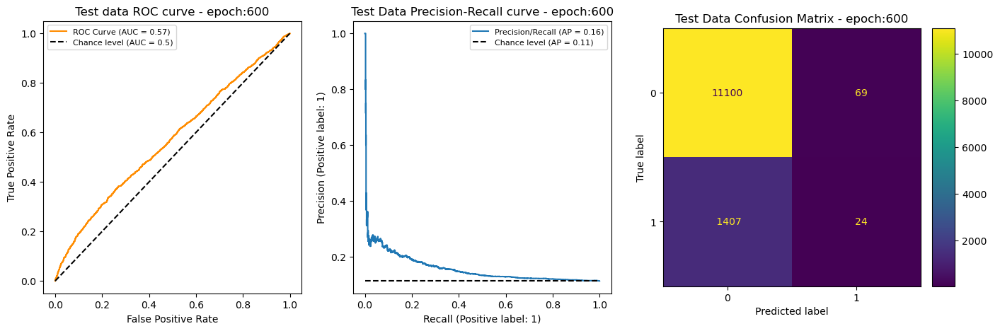

In [20]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

In [9]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 88.42 %    ROC Auc: 0.5763    PR Auc:0.1155    F1: 0.0228    Prec: 0.2742  Recall: 0.0119    
200 Val   Acc : 88.58 %    ROC Auc: 0.5661    PR Auc:0.1164    F1: 0.0284    Prec: 0.3559  Recall: 0.0148    
200 Train Acc : 88.53 %    ROC Auc: 0.7291    PR Auc:0.1389    F1: 0.0635    Prec: 0.7656  Recall: 0.0331    

300 Test  Acc : 88.41 %    ROC Auc: 0.5742    PR Auc:0.1160    F1: 0.0267    Prec: 0.2899  Recall: 0.0140    
300 Val   Acc : 88.58 %    ROC Auc: 0.5655    PR Auc:0.1167    F1: 0.0297    Prec: 0.3607  Recall: 0.0155    
300 Train Acc : 88.56 %    ROC Auc: 0.7321    PR Auc:0.1409    F1: 0.0697    Prec: 0.7606  Recall: 0.0365    



## SNNL (cpb 600, Latent 150, SNN Factor 3) ---->(Single 256 Layer NN)

 - Test dataset: part of training data used during autoencoder training (seen by autoencoder embedding trianing process)
 - Model: **20240916_1830** : SINGLE LAYER Input --> 256 --> Tanh --> 1

In [10]:
AE_RUNMODE = 'snnl'
AE_DATETIME = "20240906_2201"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"

# RUN_DATETIME = '20240916_1830'
# RUN_DATETIME = '20240916_1831'
# RUN_DATETIME = '20240916_1832'
RUN_DATETIME = '20240916_1833'

AE_LATENT_DIM = 150
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-16 17:39:16,255 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-16 17:39:16,256 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
2024-10-16 17:39:16,256 - utils.dataloader - INFO: -  type    :  train
2024-10-16 17:39:16,257 - utils.dataloader - INFO: -  start   :  21600
2024-10-16 17:39:16,258 - utils.dataloader - INFO: -  end     :  34200
2024-10-16 17:39:16,258 - utils.dataloader - INFO: -  numrows :  12600
2024-10-16 17:39:16,259 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-16 17:39:16,260 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-16 17:39:16,260 - utils.dataloader - INFO: -  sample_size :  3
2024-10-16 17:39:16,261 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-16 17:39:16,262 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240916_1833_ep_{ep}
./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240916_1833_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

 Test  Acc : 88.54 % 	 roc_auc: 0.6155 	 Precision: 0.3143 	 Recall: 0.0077 	 F1: 0.0150

 Test Label counts:  True: [11169  1431] 	 Pred: [12565    35] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.31      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.60      0.50      0.48     12600
weighted avg       0.82      0.89      0.83     12600



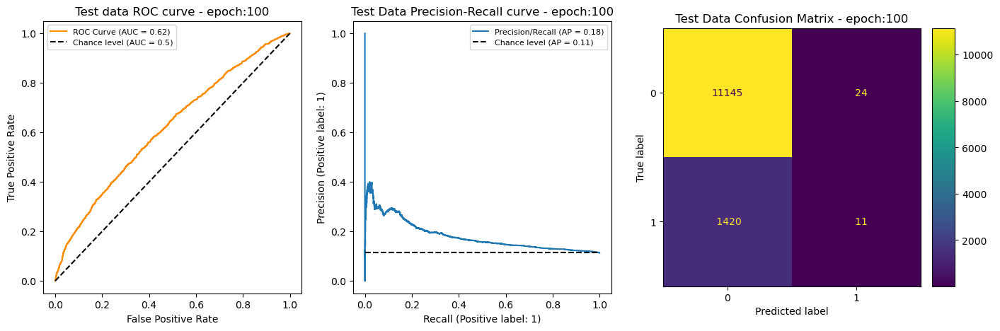

 Test  Acc : 88.55 % 	 roc_auc: 0.6177 	 Precision: 0.3125 	 Recall: 0.0070 	 F1: 0.0137

 Test Label counts:  True: [11169  1431] 	 Pred: [12568    32] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.31      0.01      0.01      1431

    accuracy                           0.89     12600
   macro avg       0.60      0.50      0.48     12600
weighted avg       0.82      0.89      0.83     12600



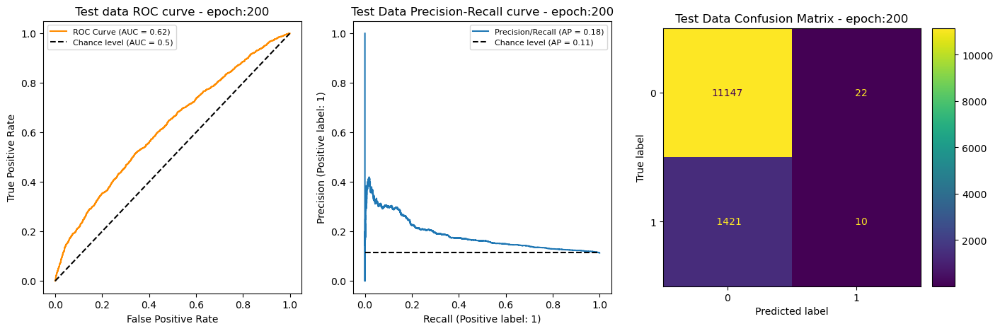

 Test  Acc : 88.55 % 	 roc_auc: 0.6175 	 Precision: 0.3421 	 Recall: 0.0091 	 F1: 0.0177

 Test Label counts:  True: [11169  1431] 	 Pred: [12562    38] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.34      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.61      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



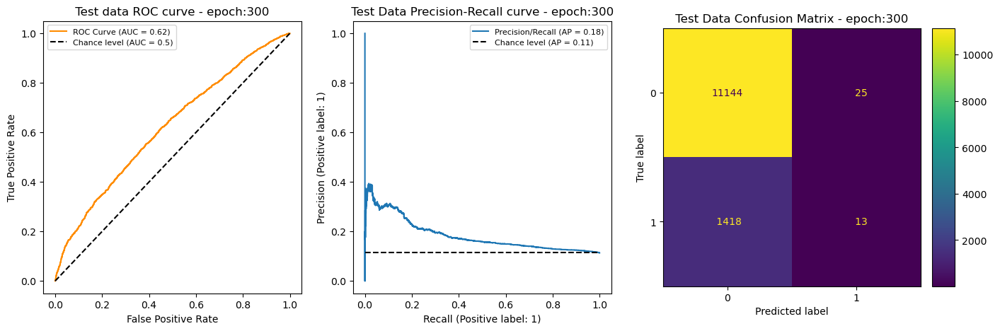

 Test  Acc : 88.56 % 	 roc_auc: 0.6174 	 Precision: 0.3590 	 Recall: 0.0098 	 F1: 0.0190

 Test Label counts:  True: [11169  1431] 	 Pred: [12561    39] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.36      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



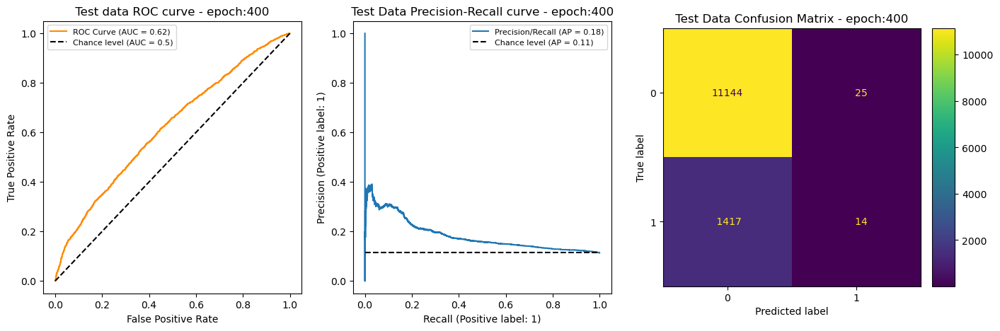

 Test  Acc : 88.56 % 	 roc_auc: 0.6174 	 Precision: 0.3590 	 Recall: 0.0098 	 F1: 0.0190

 Test Label counts:  True: [11169  1431] 	 Pred: [12561    39] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.36      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



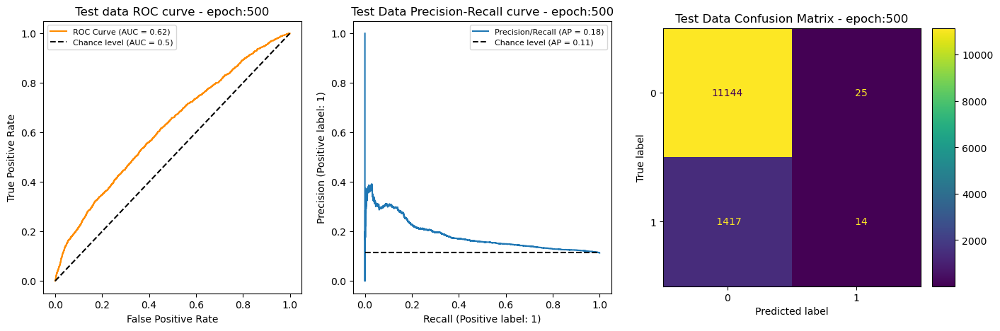

 Test  Acc : 88.56 % 	 roc_auc: 0.6174 	 Precision: 0.3590 	 Recall: 0.0098 	 F1: 0.0190

 Test Label counts:  True: [11169  1431] 	 Pred: [12561    39] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.36      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



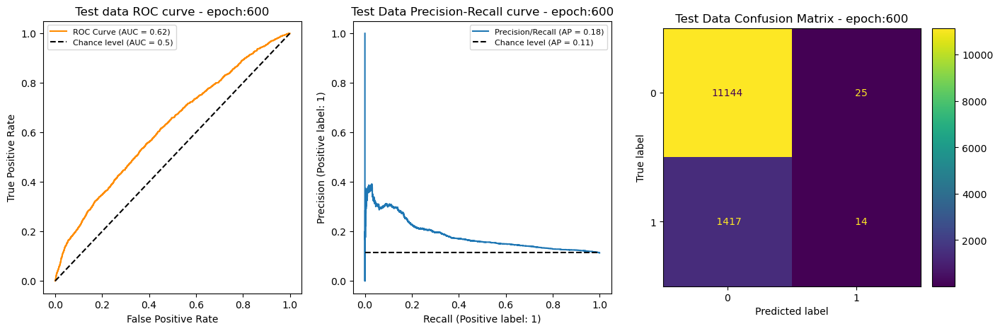

In [33]:
data_type = 'test'
for ep in [100,200,300,400,500,600]:
    model, optimizer, scheudler, loaded_epoch = load_checkpoint(model, optimizer, scheduler, metrics, CKPT_FILE.format(ep=ep), ckpt_path = CKPT_PATH)
    _ = model.eval();
    mdl_outputs = run_model_on_test_data(model, data_loader[data_type], DEVICE, title = data_type, verbose = False)
    mo = compute_classification_metrics(mdl_outputs, epochs = loaded_epoch, title = data_type, verbose = True)
    plot_cls_metrics(mdl_outputs.y_true, mdl_outputs.y_prob, mdl_outputs.y_pred, epochs = loaded_epoch, title = data_type )
    plt.show()

### t1

In [11]:
for epoch in [ 200, 300 ]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 88.60 %    ROC Auc: 0.6180    PR Auc:0.1169    F1: 0.0205    Prec: 0.4286  Recall: 0.0105    
200 Val   Acc : 88.68 %    ROC Auc: 0.6264    PR Auc:0.1163    F1: 0.0206    Prec: 0.4412  Recall: 0.0105    
200 Train Acc : 88.39 %    ROC Auc: 0.6740    PR Auc:0.1275    F1: 0.0305    Prec: 0.7667  Recall: 0.0156    

300 Test  Acc : 88.60 %    ROC Auc: 0.6180    PR Auc:0.1169    F1: 0.0205    Prec: 0.4286  Recall: 0.0105    
300 Val   Acc : 88.66 %    ROC Auc: 0.6267    PR Auc:0.1165    F1: 0.0232    Prec: 0.4146  Recall: 0.0120    
300 Train Acc : 88.39 %    ROC Auc: 0.6800    PR Auc:0.1280    F1: 0.0343    Prec: 0.7222  Recall: 0.0176    



## Baseline (cpb 600, Latent 250) ---->  (Single 256 layer NN)

 - Training dataset: **20240917_2017** (BASELINE CPB: 600, Latent: 150) 
 
 - Model checkpoint: **20240926_1900_1915** : Run on single layer model 256

In [15]:
AE_LATENT_DIM = 250
AE_RUNMODE = 'base'
AE_DATETIME = "20240917_2017"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
# RUN_DATETIME = '20240926_1900'
# RUN_DATETIME = '20240926_1901'
# RUN_DATETIME = '20240926_1902'
RUN_DATETIME = '20240926_1903'
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-17 22:12:22,040 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-17 22:12:22,041 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
2024-10-17 22:12:22,042 - utils.dataloader - INFO: -  type    :  train
2024-10-17 22:12:22,042 - utils.dataloader - INFO: -  start   :  21600
2024-10-17 22:12:22,043 - utils.dataloader - INFO: -  end     :  34200
2024-10-17 22:12:22,043 - utils.dataloader - INFO: -  numrows :  12600
2024-10-17 22:12:22,044 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-17 22:12:22,045 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-17 22:12:22,045 - utils.dataloader - INFO: -  sample_size :  3
2024-10-17 22:12:22,046 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-17 22:12:22,046 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240926_1903_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240926_1903_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240926_1900_ep_100
 Test  Acc : 88.49 % 	 roc_auc: 0.5894 	 Precision: 0.3137 	 Recall: 0.0112 	 F1: 0.0216

 Test Label counts:  True: [11169  1431] 	 Pred: [12549    51] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.31      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.60      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



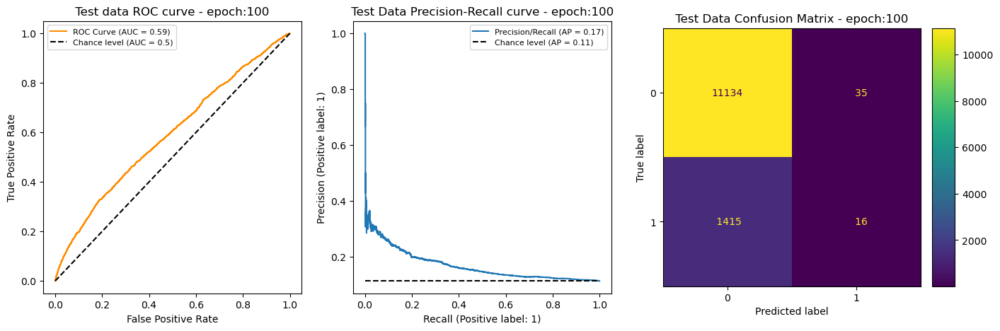

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240926_1900_ep_200
 Test  Acc : 88.48 % 	 roc_auc: 0.5871 	 Precision: 0.3158 	 Recall: 0.0126 	 F1: 0.0242

 Test Label counts:  True: [11169  1431] 	 Pred: [12543    57] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.32      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.60      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



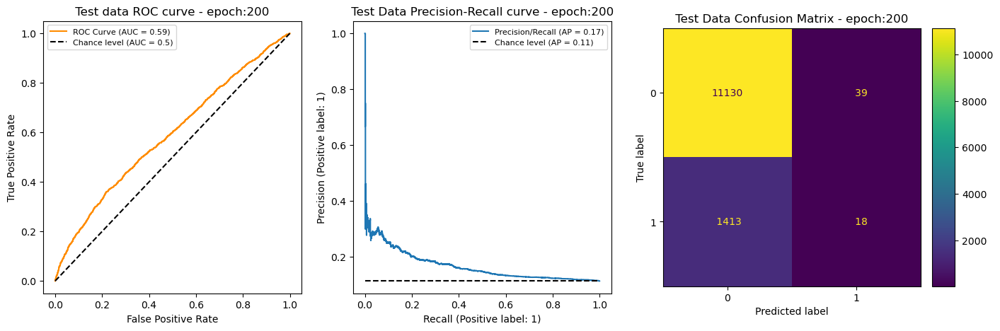

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240926_1900_ep_300
 Test  Acc : 88.48 % 	 roc_auc: 0.5869 	 Precision: 0.3158 	 Recall: 0.0126 	 F1: 0.0242

 Test Label counts:  True: [11169  1431] 	 Pred: [12543    57] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.32      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.60      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



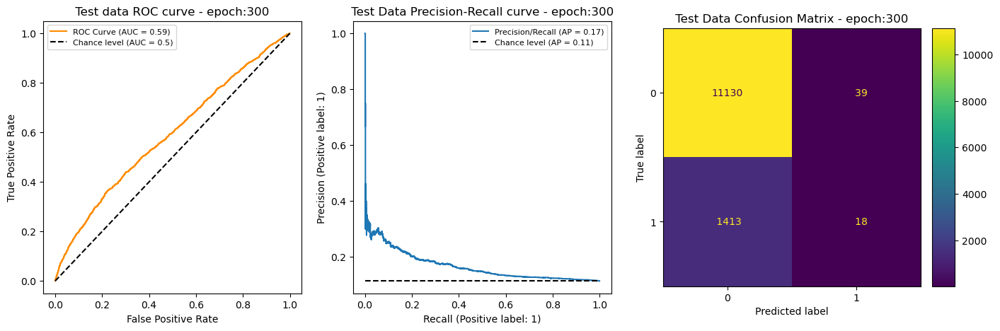

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240926_1900_ep_400
 Test  Acc : 88.47 % 	 roc_auc: 0.5869 	 Precision: 0.3103 	 Recall: 0.0126 	 F1: 0.0242

 Test Label counts:  True: [11169  1431] 	 Pred: [12542    58] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.31      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.60      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



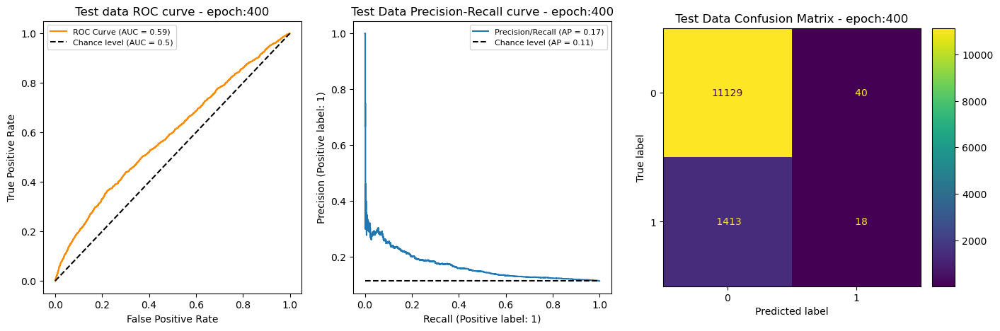

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240926_1900_ep_500
 Test  Acc : 88.47 % 	 roc_auc: 0.5869 	 Precision: 0.3103 	 Recall: 0.0126 	 F1: 0.0242

 Test Label counts:  True: [11169  1431] 	 Pred: [12542    58] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.31      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.60      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



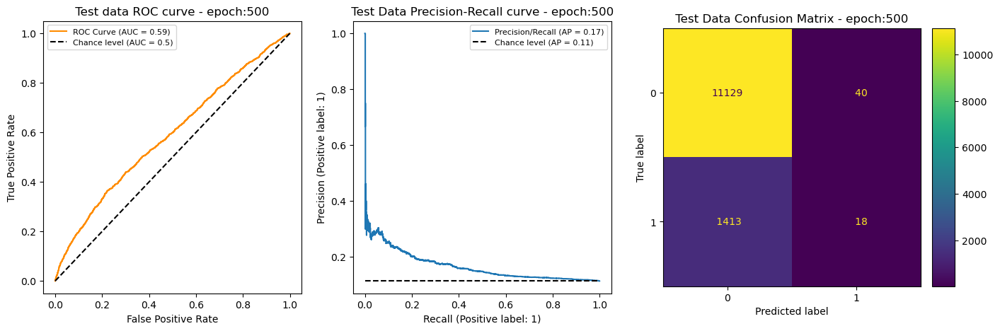

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240926_1900_ep_600
 Test  Acc : 88.47 % 	 roc_auc: 0.5869 	 Precision: 0.3103 	 Recall: 0.0126 	 F1: 0.0242

 Test Label counts:  True: [11169  1431] 	 Pred: [12542    58] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.31      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.60      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



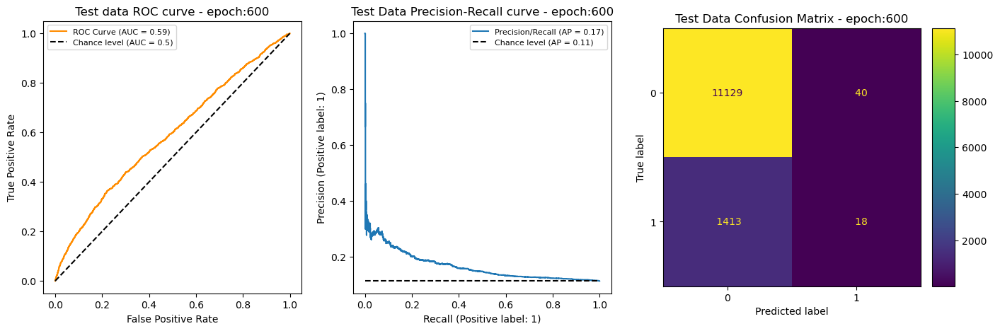

In [41]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

In [16]:
plot = False
for epoch in [100,200,300,400]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

100 Test  Acc : 88.60 %    ROC Auc: 0.5831    PR Auc:0.1177    F1: 0.0245    Prec: 0.4390  Recall: 0.0126    
100 Val   Acc : 88.66 %    ROC Auc: 0.5846    PR Auc:0.1149    F1: 0.0152    Prec: 0.3793  Recall: 0.0077    
100 Train Acc : 88.44 %    ROC Auc: 0.7116    PR Auc:0.1311    F1: 0.0358    Prec: 0.8710  Recall: 0.0183    

200 Test  Acc : 88.52 %    ROC Auc: 0.5830    PR Auc:0.1171    F1: 0.0269    Prec: 0.3636  Recall: 0.0140    
200 Val   Acc : 88.52 %    ROC Auc: 0.5810    PR Auc:0.1150    F1: 0.0230    Prec: 0.2931  Recall: 0.0120    
200 Train Acc : 88.54 %    ROC Auc: 0.7251    PR Auc:0.1387    F1: 0.0587    Prec: 0.8182  Recall: 0.0304    

300 Test  Acc : 88.51 %    ROC Auc: 0.5821    PR Auc:0.1167    F1: 0.0256    Prec: 0.3455  Recall: 0.0133    
300 Val   Acc : 88.50 %    ROC Auc: 0.5792    PR Auc:0.1148    F1: 0.0229    Prec: 0.2787  Recall: 0.0120    
300 Train Acc : 88.55 %    ROC Auc: 0.7282    PR Auc:0.1394    F1: 0.0612    Prec: 0.8103  Recall: 0.0318    

400 Tes

## SNNL (cpb 600, Latent 250, SNN Factor 3) ---->(Single 256 Layer NN)

 - Test dataset: part of training data used during autoencoder training (seen by autoencoder embedding trianing process)
 - Model: **20240926_1930** : SINGLE LAYER Input --> 256 --> Tanh --> 1

In [24]:
AE_LATENT_DIM = 250
AE_RUNMODE = 'snnl'
AE_DATETIME = "20240917_2004"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
# RUN_DATETIME = '20240926_1930'
# RUN_DATETIME = '20240926_1931'
# RUN_DATETIME = '20240926_1932'
RUN_DATETIME = '20240926_1933'
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-17 22:23:30,009 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-17 22:23:30,010 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train.csv
2024-10-17 22:23:30,011 - utils.dataloader - INFO: -  type    :  train
2024-10-17 22:23:30,011 - utils.dataloader - INFO: -  start   :  21600
2024-10-17 22:23:30,012 - utils.dataloader - INFO: -  end     :  34200
2024-10-17 22:23:30,012 - utils.dataloader - INFO: -  numrows :  12600
2024-10-17 22:23:30,013 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-17 22:23:30,014 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-17 22:23:30,014 - utils.dataloader - INFO: -  sample_size :  3
2024-10-17 22:23:30,015 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-17 22:23:30,015 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240926_1933_ep_{ep}
./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240926_1933_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

100 Test  Acc : 88.33 %    ROC Auc: 0.6354    PR Auc:0.1157    F1: 0.0278    Prec: 0.2593  Recall: 0.0147    


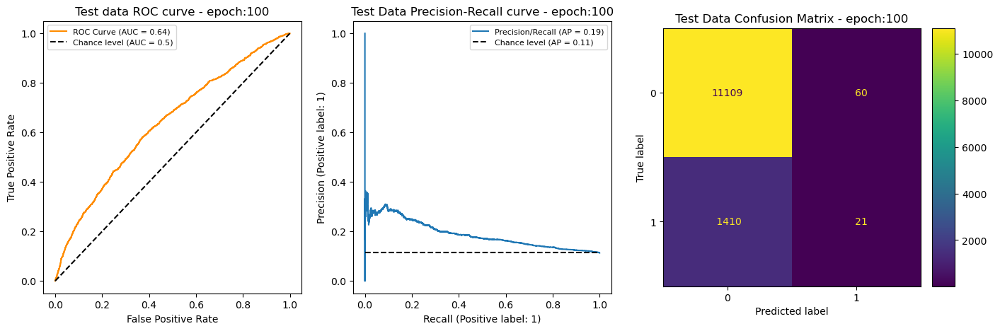

200 Test  Acc : 88.42 %    ROC Auc: 0.6321    PR Auc:0.1151    F1: 0.0201    Prec: 0.2586  Recall: 0.0105    


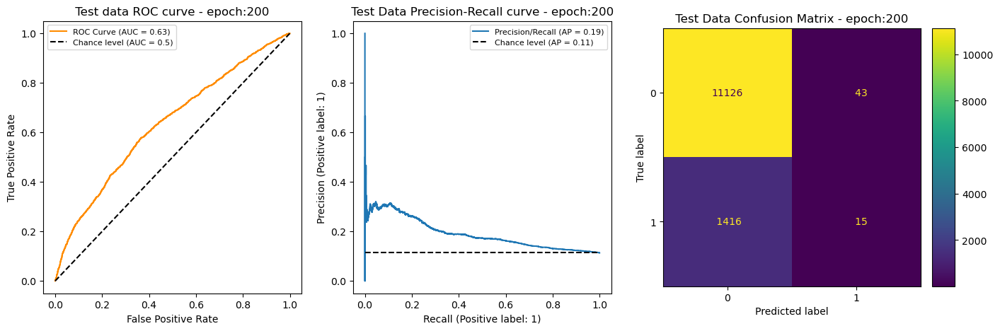

300 Test  Acc : 88.43 %    ROC Auc: 0.6314    PR Auc:0.1155    F1: 0.0228    Prec: 0.2787  Recall: 0.0119    


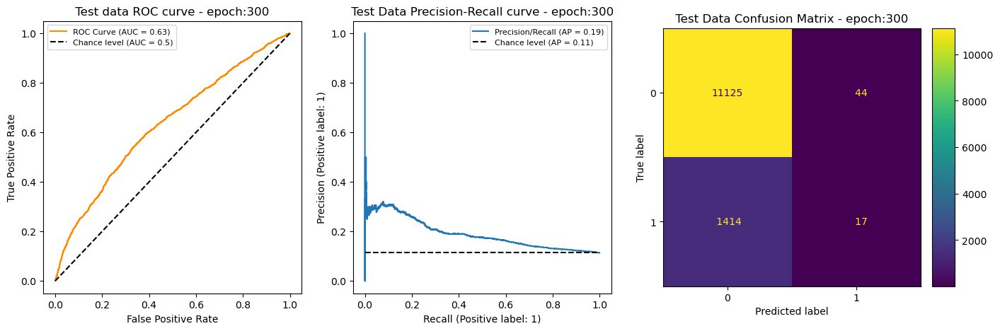

400 Test  Acc : 88.40 %    ROC Auc: 0.6310    PR Auc:0.1156    F1: 0.0240    Prec: 0.2727  Recall: 0.0126    


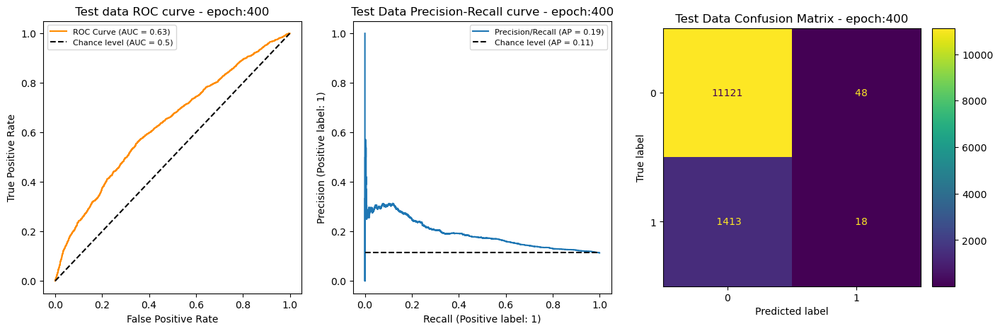

FileNotFound Exception - ./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240926_1931_ep_500.pt


UnboundLocalError: cannot access local variable 'checkpoint' where it is not associated with a value

In [20]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t1

In [25]:
plot = False
for epoch in [100,200,300,400]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

100 Test  Acc : 88.45 %    ROC Auc: 0.6340    PR Auc:0.1166    F1: 0.0281    Prec: 0.3182  Recall: 0.0147    
100 Val   Acc : 88.65 %    ROC Auc: 0.6311    PR Auc:0.1209    F1: 0.0454    Prec: 0.4474  Recall: 0.0239    
100 Train Acc : 88.44 %    ROC Auc: 0.6643    PR Auc:0.1332    F1: 0.0521    Prec: 0.7018  Recall: 0.0270    

200 Test  Acc : 88.51 %    ROC Auc: 0.6307    PR Auc:0.1167    F1: 0.0256    Prec: 0.3455  Recall: 0.0133    
200 Val   Acc : 88.63 %    ROC Auc: 0.6317    PR Auc:0.1165    F1: 0.0258    Prec: 0.3878  Recall: 0.0134    
200 Train Acc : 88.54 %    ROC Auc: 0.6749    PR Auc:0.1387    F1: 0.0587    Prec: 0.8182  Recall: 0.0304    

300 Test  Acc : 88.49 %    ROC Auc: 0.6303    PR Auc:0.1160    F1: 0.0229    Prec: 0.3208  Recall: 0.0119    
300 Val   Acc : 88.63 %    ROC Auc: 0.6316    PR Auc:0.1168    F1: 0.0272    Prec: 0.3922  Recall: 0.0141    
300 Train Acc : 88.56 %    ROC Auc: 0.6775    PR Auc:0.1397    F1: 0.0600    Prec: 0.8364  Recall: 0.0311    

400 Tes

## Baseline ---->  (Single 256 layer NN) -- Balanced Data

 - Training dataset: **20240917_2017** (BASELINE CPB: 600, Latent: 150) 
 
 - Model checkpoint: **20241003_2315** : Run on single layer model 256

In [23]:
AE_LATENT_DIM = 250
AE_RUNMODE = 'base'
AE_DATETIME = "20240917_2017"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20241003_2315'
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
TPSA_THRESHOLD = 70

MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH, tpsa_threshold = TPSA_THRESHOLD )
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-04 16:02:09,424 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-04 16:02:09,425 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
2024-10-04 16:02:09,427 - utils.dataloader - INFO: -  type    :  train
2024-10-04 16:02:09,427 - utils.dataloader - INFO: -  start   :  21600
2024-10-04 16:02:09,428 - utils.dataloader - INFO: -  end     :  34200
2024-10-04 16:02:09,429 - utils.dataloader - INFO: -  numrows :  12600
2024-10-04 16:02:09,429 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-04 16:02:09,430 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-04 16:02:09,431 - utils.dataloader - INFO: -  sample_size :  3
2024-10-04 16:02:09,431 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-04 16:02:09,432 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
Layer (type:depth-idx)                   Input Shape               Output Sha

### t0

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_100
 Val   Acc : 51.94 % 	 roc_auc: 0.5342 	 Precision: 0.5556 	 Recall: 0.5098 	 F1: 0.5317

 Val Label counts:  True: [5856 6744] 	 Pred: [6412 6188] 

 Val Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.48      0.53      0.51      5856
           1       0.56      0.51      0.53      6744

    accuracy                           0.52     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.52      0.52     12600



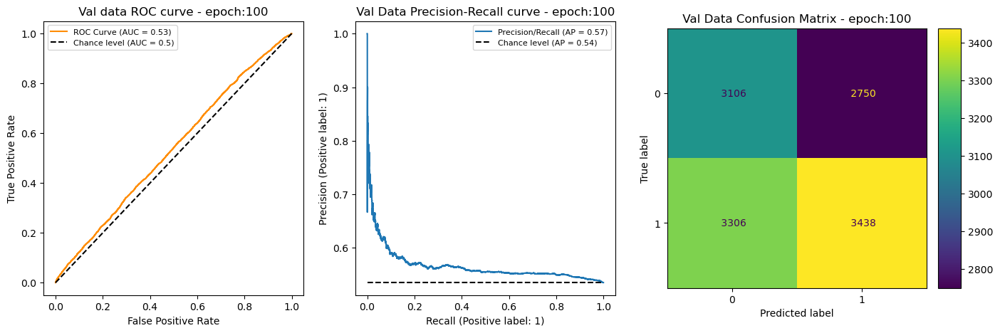

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_200
 Val   Acc : 52.80 % 	 roc_auc: 0.5344 	 Precision: 0.5582 	 Recall: 0.5670 	 F1: 0.5626

 Val Label counts:  True: [5856 6744] 	 Pred: [5749 6851] 

 Val Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.49      0.48      0.49      5856
           1       0.56      0.57      0.56      6744

    accuracy                           0.53     12600
   macro avg       0.53      0.53      0.53     12600
weighted avg       0.53      0.53      0.53     12600



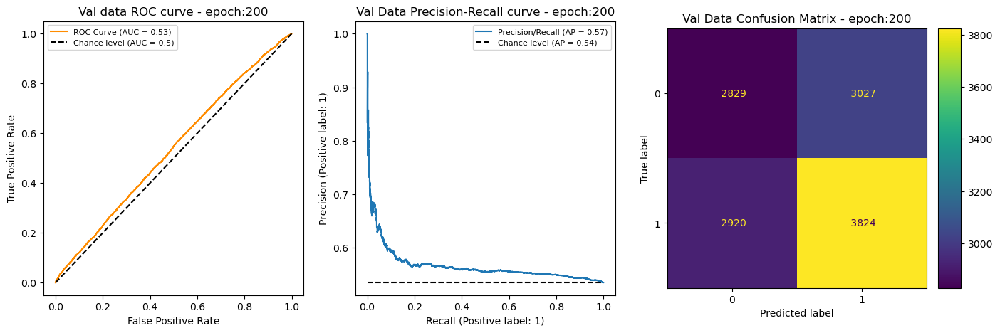

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_300
 Val   Acc : 52.61 % 	 roc_auc: 0.5333 	 Precision: 0.5556 	 Recall: 0.5724 	 F1: 0.5639

 Val Label counts:  True: [5856 6744] 	 Pred: [5653 6947] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.57      0.56      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



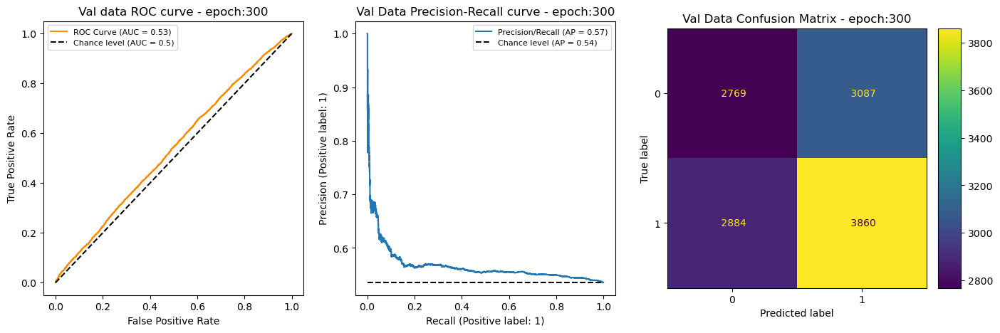

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_400
 Val   Acc : 52.71 % 	 roc_auc: 0.5329 	 Precision: 0.5537 	 Recall: 0.6011 	 F1: 0.5764

 Val Label counts:  True: [5856 6744] 	 Pred: [5278 7322] 

 Val Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



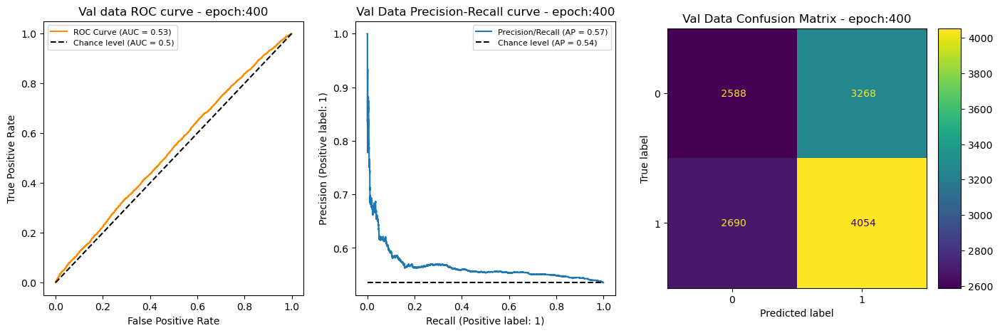

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_500
 Val   Acc : 52.67 % 	 roc_auc: 0.5327 	 Precision: 0.5532 	 Recall: 0.6011 	 F1: 0.5762

 Val Label counts:  True: [5856 6744] 	 Pred: [5272 7328] 

 Val Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



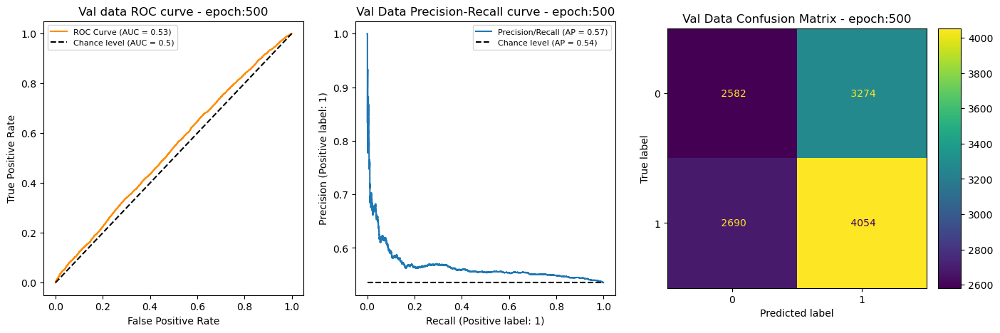

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_600
 Val   Acc : 52.67 % 	 roc_auc: 0.5327 	 Precision: 0.5532 	 Recall: 0.6013 	 F1: 0.5762

 Val Label counts:  True: [5856 6744] 	 Pred: [5270 7330] 

 Val Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



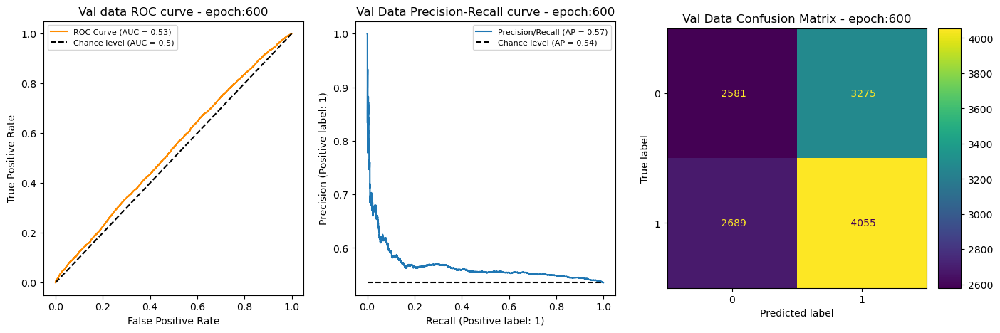

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_700
 Val   Acc : 52.70 % 	 roc_auc: 0.5327 	 Precision: 0.5534 	 Recall: 0.6020 	 F1: 0.5767

 Val Label counts:  True: [5856 6744] 	 Pred: [5264 7336] 

 Val Data Classification Report: - epoch:700 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



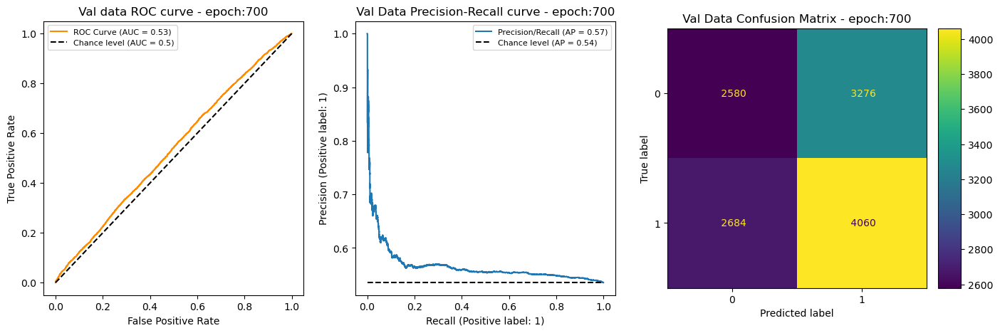

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_800
 Val   Acc : 52.70 % 	 roc_auc: 0.5327 	 Precision: 0.5534 	 Recall: 0.6020 	 F1: 0.5767

 Val Label counts:  True: [5856 6744] 	 Pred: [5264 7336] 

 Val Data Classification Report: - epoch:800 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



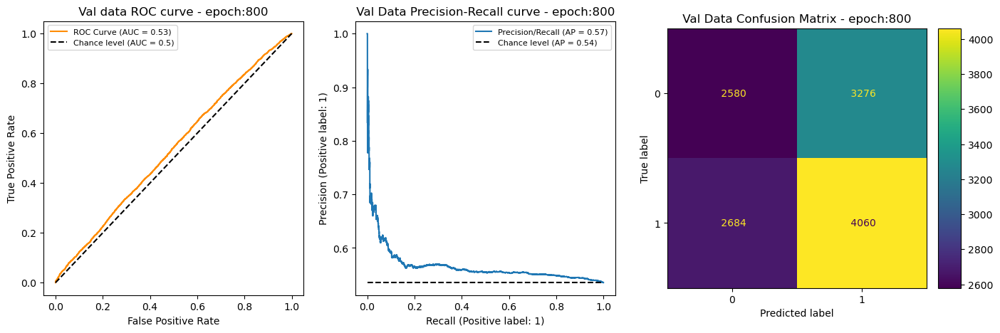

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_900
 Val   Acc : 52.71 % 	 roc_auc: 0.5327 	 Precision: 0.5535 	 Recall: 0.6020 	 F1: 0.5767

 Val Label counts:  True: [5856 6744] 	 Pred: [5265 7335] 

 Val Data Classification Report: - epoch:900 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



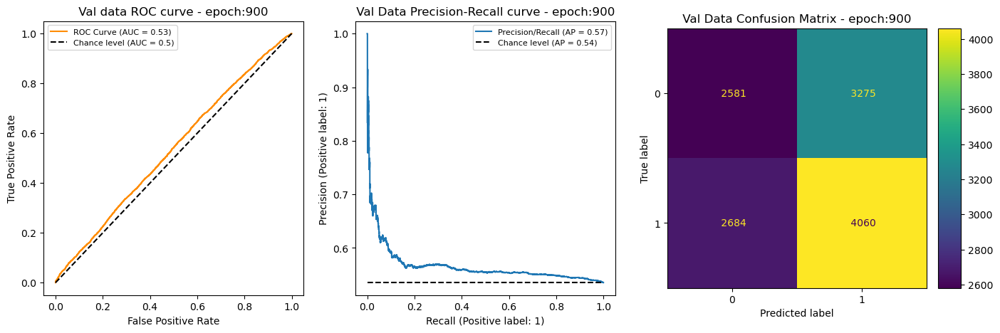

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_1000
 Val   Acc : 52.71 % 	 roc_auc: 0.5327 	 Precision: 0.5535 	 Recall: 0.6020 	 F1: 0.5767

 Val Label counts:  True: [5856 6744] 	 Pred: [5265 7335] 

 Val Data Classification Report: - epoch:1000 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



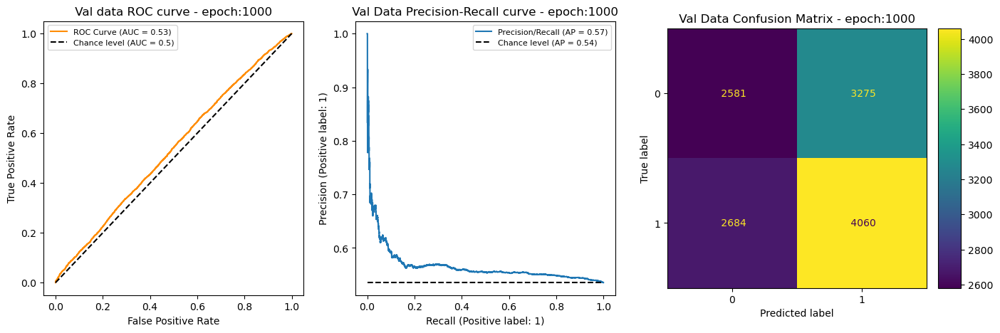

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_1100
 Val   Acc : 52.68 % 	 roc_auc: 0.5327 	 Precision: 0.5533 	 Recall: 0.6014 	 F1: 0.5764

 Val Label counts:  True: [5856 6744] 	 Pred: [5270 7330] 

 Val Data Classification Report: - epoch:1100 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



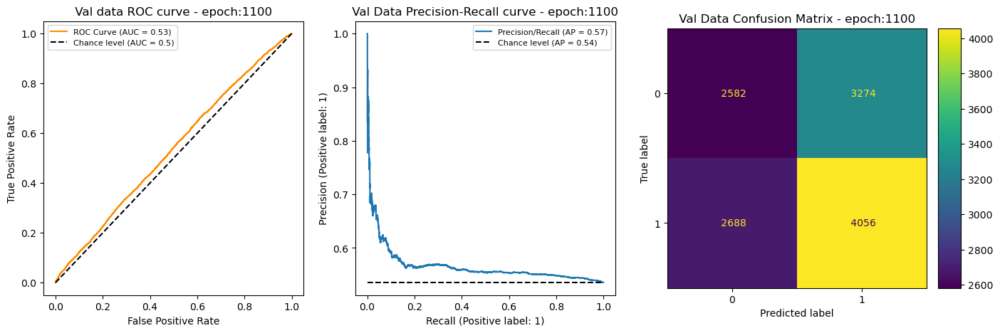

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_1200
 Val   Acc : 52.67 % 	 roc_auc: 0.5327 	 Precision: 0.5533 	 Recall: 0.6013 	 F1: 0.5763

 Val Label counts:  True: [5856 6744] 	 Pred: [5271 7329] 

 Val Data Classification Report: - epoch:1200 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



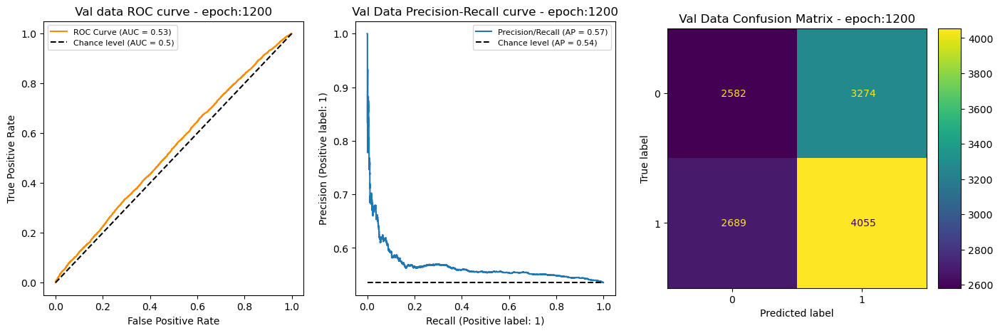

In [13]:
data_type = 'val'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,700, 800,900,1000,1100,1200]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_600
 Test  Acc : 52.39 % 	 roc_auc: 0.5331 	 Precision: 0.5248 	 Recall: 0.5970 	 F1: 0.5585

 Test Label counts:  True: [6243 6357] 	 Pred: [5368 7232] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.52      0.45      0.48      6243
           1       0.52      0.60      0.56      6357

    accuracy                           0.52     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.52      0.52     12600



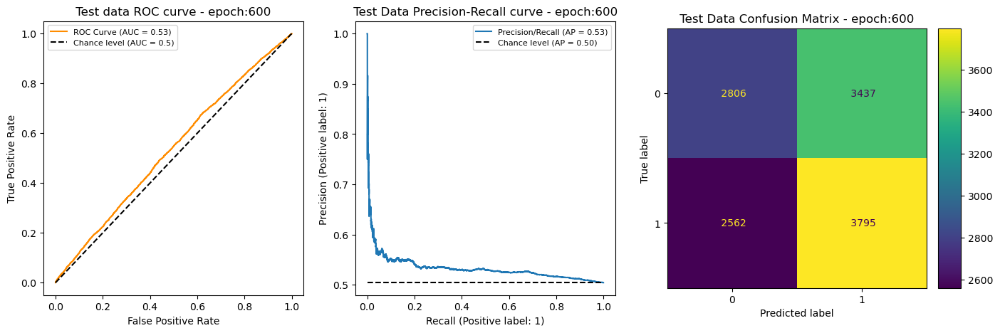

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_600
 Val   Acc : 52.67 % 	 roc_auc: 0.5327 	 Precision: 0.5532 	 Recall: 0.6013 	 F1: 0.5762

 Val Label counts:  True: [5856 6744] 	 Pred: [5270 7330] 

 Val Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.49      0.44      0.46      5856
           1       0.55      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.53      0.52     12600



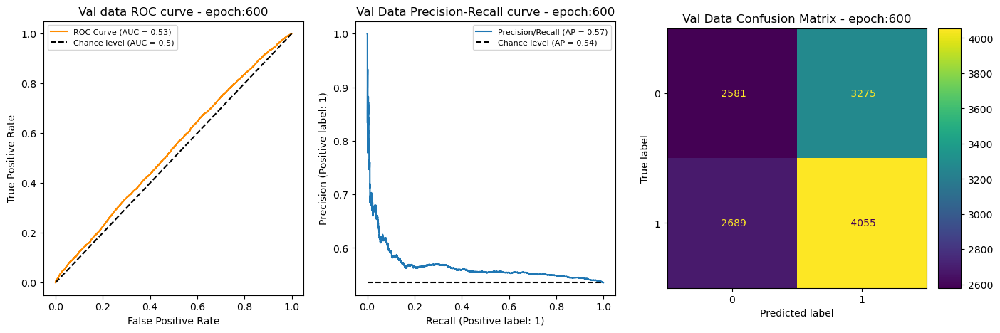

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2315_ep_600
 Train Acc : 60.48 % 	 roc_auc: 0.6503 	 Precision: 0.6106 	 Recall: 0.6711 	 F1: 0.6394

 Train Label counts:  True: [6021 6579] 	 Pred: [5369 7231] 

 Train Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.60      0.53      0.56      6021
           1       0.61      0.67      0.64      6579

    accuracy                           0.60     12600
   macro avg       0.60      0.60      0.60     12600
weighted avg       0.60      0.60      0.60     12600



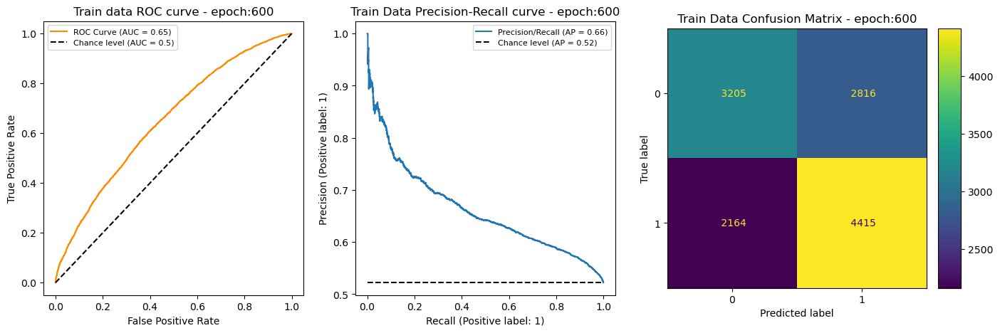

In [24]:
epoch = 600
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE)
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE)
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE)

# Single Layer 512

## Baseline (cpb 600, Latent 150) ---->  (Single 512 layer NN)

In [47]:
AE_RUNMODE = 'base'
AE_DATETIME = "20240923_1943"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "BEST"
AE_LATENT_DIM = 150
RUN_DATETIME = '20241002_1930'

input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS

MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
 
n_hidden_1 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)

2024-10-11 18:24:43,459 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-11 18:24:43,460 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
2024-10-11 18:24:43,460 - utils.dataloader - INFO: -  type    :  train
2024-10-11 18:24:43,462 - utils.dataloader - INFO: -  start   :  21600
2024-10-11 18:24:43,463 - utils.dataloader - INFO: -  end     :  34200
2024-10-11 18:24:43,464 - utils.dataloader - INFO: -  numrows :  12600
2024-10-11 18:24:43,464 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-11 18:24:43,465 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-11 18:24:43,466 - utils.dataloader - INFO: -  sample_size :  3
2024-10-11 18:24:43,467 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-11 18:24:43,468 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1930_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1930_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1930_ep_100
 Val   Acc : 88.41 % 	 roc_auc: 0.5777 	 Precision: 0.2738 	 Recall: 0.0162 	 F1: 0.0305

 Val Label counts:  True: [11178  1422] 	 Pred: [12516    84] 

 Val Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11178
           1       0.27      0.02      0.03      1422

    accuracy                           0.88     12600
   macro avg       0.58      0.51      0.48     12600
weighted avg       0.82      0.88      0.84     12600



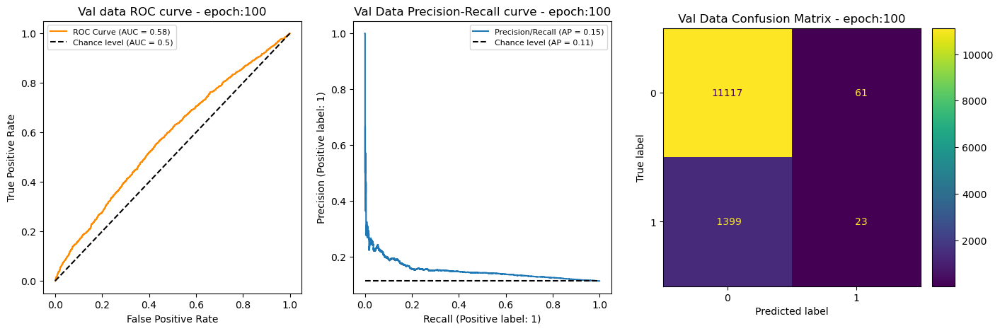

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1930_ep_200
 Val   Acc : 87.90 % 	 roc_auc: 0.5765 	 Precision: 0.2424 	 Recall: 0.0338 	 F1: 0.0593

 Val Label counts:  True: [11178  1422] 	 Pred: [12402   198] 

 Val Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11178
           1       0.24      0.03      0.06      1422

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.50     12600
weighted avg       0.82      0.88      0.84     12600



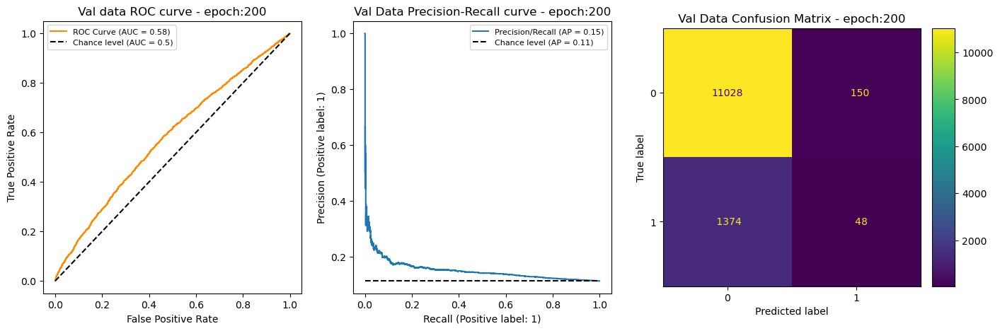

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1930_ep_300
 Val   Acc : 87.77 % 	 roc_auc: 0.5764 	 Precision: 0.2258 	 Recall: 0.0345 	 F1: 0.0598

 Val Label counts:  True: [11178  1422] 	 Pred: [12383   217] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11178
           1       0.23      0.03      0.06      1422

    accuracy                           0.88     12600
   macro avg       0.56      0.51      0.50     12600
weighted avg       0.81      0.88      0.84     12600



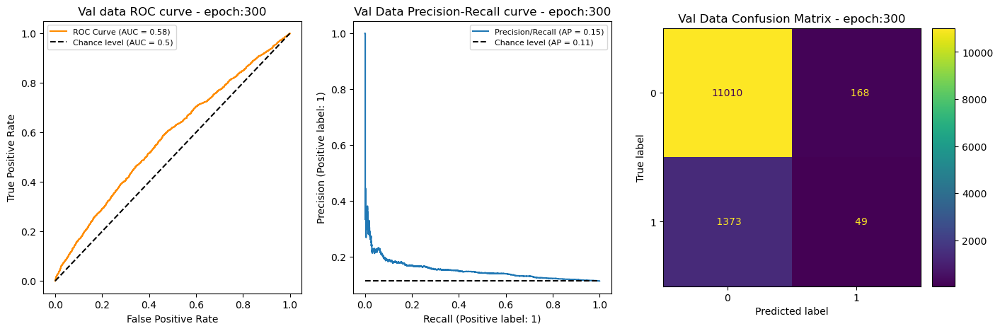

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1930_ep_400
 Val   Acc : 87.79 % 	 roc_auc: 0.5757 	 Precision: 0.2146 	 Recall: 0.0309 	 F1: 0.0541

 Val Label counts:  True: [11178  1422] 	 Pred: [12395   205] 

 Val Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.99      0.93     11178
           1       0.21      0.03      0.05      1422

    accuracy                           0.88     12600
   macro avg       0.55      0.51      0.49     12600
weighted avg       0.81      0.88      0.84     12600



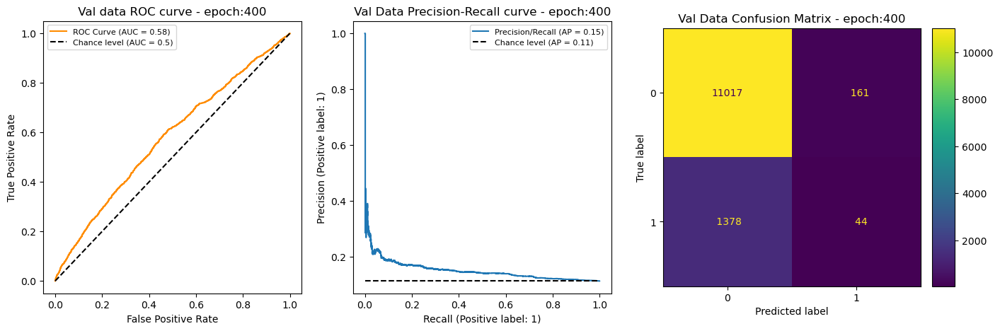

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1930_ep_500
 Val   Acc : 87.75 % 	 roc_auc: 0.5755 	 Precision: 0.2150 	 Recall: 0.0323 	 F1: 0.0562

 Val Label counts:  True: [11178  1422] 	 Pred: [12386   214] 

 Val Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11178
           1       0.21      0.03      0.06      1422

    accuracy                           0.88     12600
   macro avg       0.55      0.51      0.50     12600
weighted avg       0.81      0.88      0.84     12600



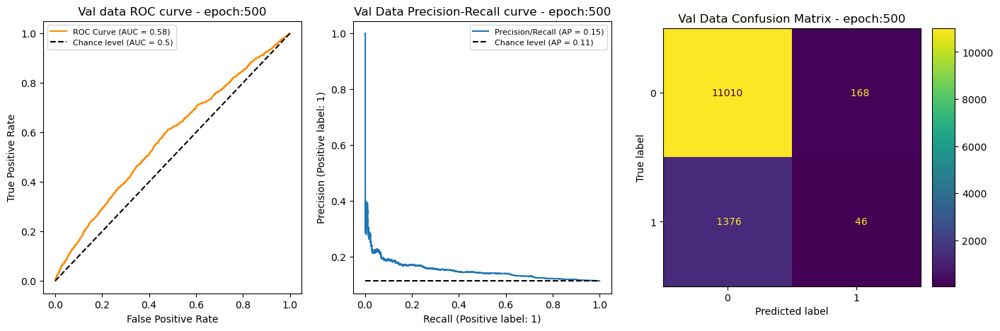

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1930_ep_600
 Val   Acc : 87.75 % 	 roc_auc: 0.5754 	 Precision: 0.2176 	 Recall: 0.0331 	 F1: 0.0574

 Val Label counts:  True: [11178  1422] 	 Pred: [12384   216] 

 Val Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11178
           1       0.22      0.03      0.06      1422

    accuracy                           0.88     12600
   macro avg       0.55      0.51      0.50     12600
weighted avg       0.81      0.88      0.84     12600



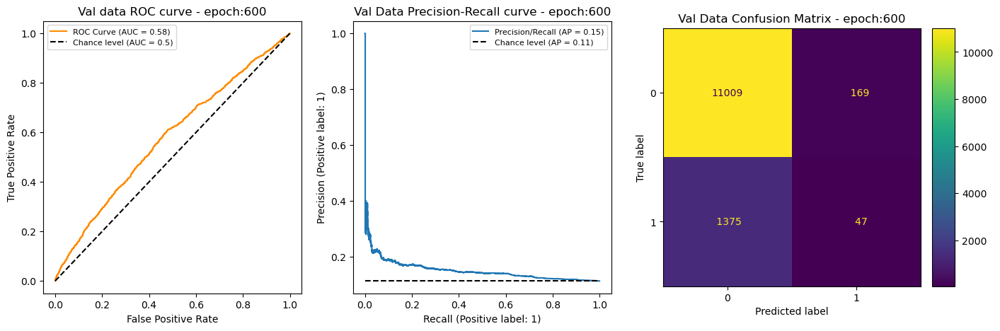

In [26]:
data_type = 'val'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

In [48]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 87.72 %    ROC Auc: 0.5673    PR Auc:0.1189    F1: 0.0686    Prec: 0.2478  Recall: 0.0398    
200 Val   Acc : 87.90 %    ROC Auc: 0.5765    PR Auc:0.1172    F1: 0.0593    Prec: 0.2424  Recall: 0.0338    
200 Train Acc : 88.98 %    ROC Auc: 0.7852    PR Auc:0.1775    F1: 0.1757    Prec: 0.7184  Recall: 0.1001    

300 Test  Acc : 87.61 %    ROC Auc: 0.5651    PR Auc:0.1187    F1: 0.0703    Prec: 0.2379  Recall: 0.0412    
300 Val   Acc : 87.77 %    ROC Auc: 0.5764    PR Auc:0.1167    F1: 0.0598    Prec: 0.2258  Recall: 0.0345    
300 Train Acc : 89.05 %    ROC Auc: 0.7897    PR Auc:0.1826    F1: 0.1863    Prec: 0.7281  Recall: 0.1068    



## SNNL (cpb 600, Latent 150, SNN Factor 3) ---->(Single 512 Layer NN)

In [42]:
AE_RUNMODE = 'snnl'
AE_DATETIME = "20240906_2201"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
AE_LATENT_DIM = 150
RUN_DATETIME = "20240921_0700"

input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS

MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
 
n_hidden_1 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)

2024-10-11 18:18:50,422 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-11 18:18:50,423 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
2024-10-11 18:18:50,424 - utils.dataloader - INFO: -  type    :  train
2024-10-11 18:18:50,425 - utils.dataloader - INFO: -  start   :  21600
2024-10-11 18:18:50,425 - utils.dataloader - INFO: -  end     :  34200
2024-10-11 18:18:50,426 - utils.dataloader - INFO: -  numrows :  12600
2024-10-11 18:18:50,427 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-11 18:18:50,427 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-11 18:18:50,428 - utils.dataloader - INFO: -  sample_size :  3
2024-10-11 18:18:50,429 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-11 18:18:50,429 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240921_0700_ep_{ep}
./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240921_0700_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

 Test  Acc : 88.49 % 	 roc_auc: 0.6182 	 Precision: 0.3137 	 Recall: 0.0112 	 F1: 0.0216

 Test Label counts:  True: [11169  1431] 	 Pred: [12549    51] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.31      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.60      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



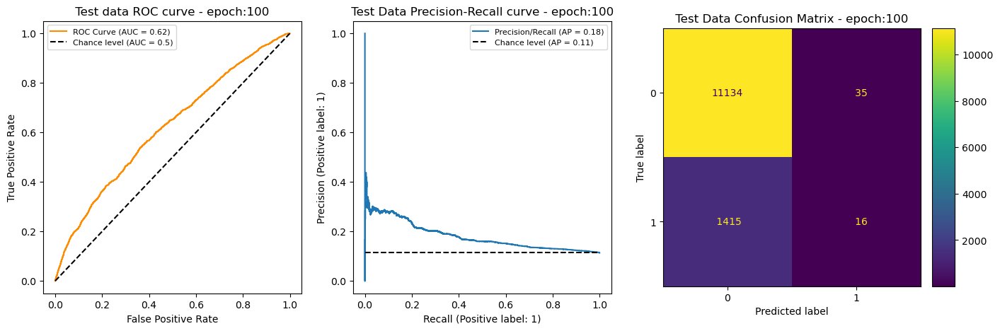

 Test  Acc : 88.57 % 	 roc_auc: 0.6205 	 Precision: 0.3548 	 Recall: 0.0077 	 F1: 0.0150

 Test Label counts:  True: [11169  1431] 	 Pred: [12569    31] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.35      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



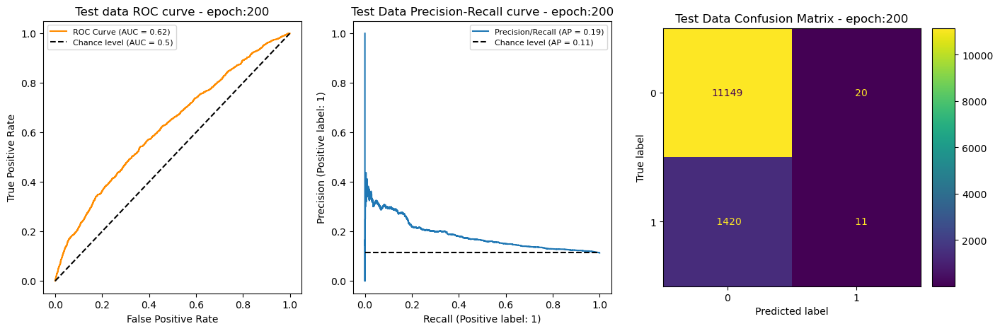

 Test  Acc : 88.56 % 	 roc_auc: 0.6191 	 Precision: 0.3684 	 Recall: 0.0098 	 F1: 0.0191

 Test Label counts:  True: [11169  1431] 	 Pred: [12562    38] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.37      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.63      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



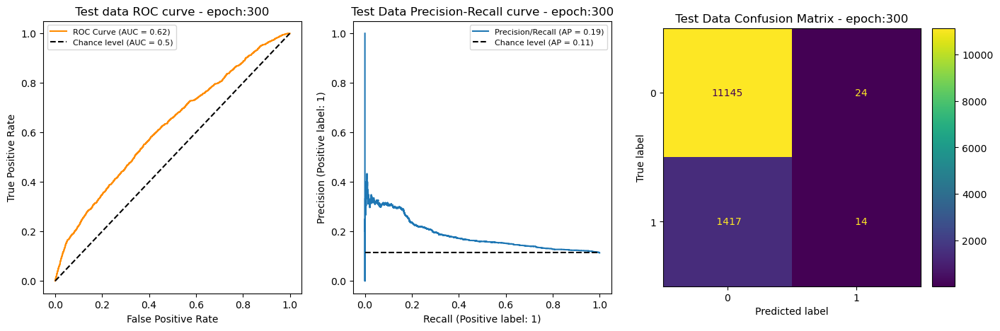

 Test  Acc : 88.56 % 	 roc_auc: 0.6191 	 Precision: 0.3684 	 Recall: 0.0098 	 F1: 0.0191

 Test Label counts:  True: [11169  1431] 	 Pred: [12562    38] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.37      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.63      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



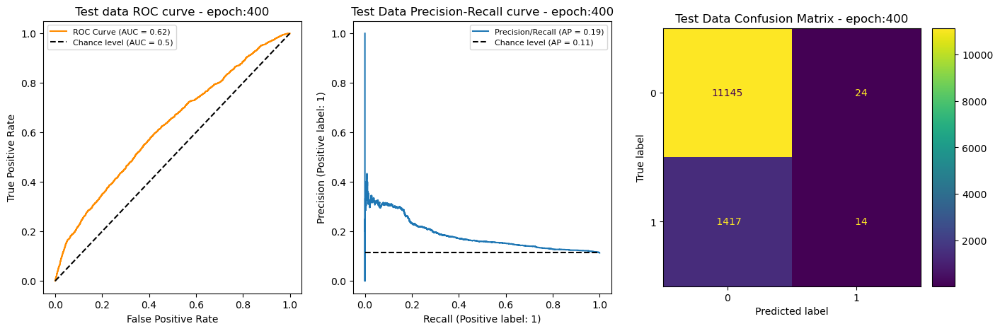

 Test  Acc : 88.57 % 	 roc_auc: 0.6191 	 Precision: 0.3846 	 Recall: 0.0105 	 F1: 0.0204

 Test Label counts:  True: [11169  1431] 	 Pred: [12561    39] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.38      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.64      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



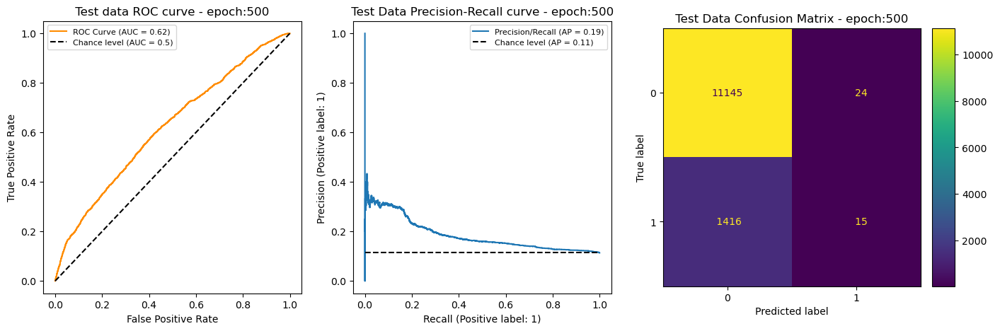

 Test  Acc : 88.57 % 	 roc_auc: 0.6191 	 Precision: 0.3846 	 Recall: 0.0105 	 F1: 0.0204

 Test Label counts:  True: [11169  1431] 	 Pred: [12561    39] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.38      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.64      0.50      0.48     12600
weighted avg       0.83      0.89      0.83     12600



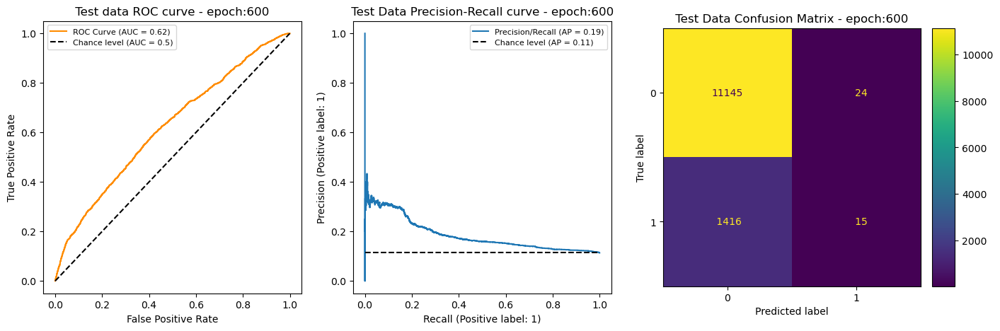

In [18]:
data_type = 'test'
for ep in [100,200,300,400,500,600]:
    model, optimizer, scheudler, loaded_epoch = load_checkpoint(model, optimizer, scheduler, metrics, CKPT_FILE.format(ep=ep), ckpt_path = CKPT_PATH)
    _ = model.eval();
    mdl_outputs = run_model_on_test_data(model, data_loader[data_type], DEVICE, title = data_type, verbose = False)
    mo = compute_classification_metrics(mdl_outputs, epochs = loaded_epoch, title = data_type, verbose = True)
    plot_cls_metrics(mdl_outputs.y_true, mdl_outputs.y_prob, mdl_outputs.y_pred, epochs = loaded_epoch, title = data_type )
    plt.show()

### t1

In [46]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 88.57 %    ROC Auc: 0.6205    PR Auc:0.1154    F1: 0.0150    Prec: 0.3548  Recall: 0.0077    
200 Val   Acc : 88.65 %    ROC Auc: 0.6291    PR Auc:0.1156    F1: 0.0192    Prec: 0.3889  Recall: 0.0098    
200 Train Acc : 88.44 %    ROC Auc: 0.6795    PR Auc:0.1305    F1: 0.0332    Prec: 0.8929  Recall: 0.0169    

300 Test  Acc : 88.56 %    ROC Auc: 0.6191    PR Auc:0.1161    F1: 0.0191    Prec: 0.3684  Recall: 0.0098    
300 Val   Acc : 88.71 %    ROC Auc: 0.6284    PR Auc:0.1183    F1: 0.0274    Prec: 0.5000  Recall: 0.0141    
300 Train Acc : 88.44 %    ROC Auc: 0.6768    PR Auc:0.1313    F1: 0.0421    Prec: 0.7619  Recall: 0.0216    



## Baseline (cpb 600, Latent 250) ---->  (Single 512 layer NN)

In [49]:
AE_LATENT_DIM = 250
AE_RUNMODE = 'base'
AE_DATETIME = "20240917_2017"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20240927_2300'
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-03 23:10:19,731 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-03 23:10:19,731 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
2024-10-03 23:10:19,732 - utils.dataloader - INFO: -  type    :  train
2024-10-03 23:10:19,733 - utils.dataloader - INFO: -  start   :  21600
2024-10-03 23:10:19,733 - utils.dataloader - INFO: -  end     :  34200
2024-10-03 23:10:19,734 - utils.dataloader - INFO: -  numrows :  12600
2024-10-03 23:10:19,735 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-03 23:10:19,735 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-03 23:10:19,736 - utils.dataloader - INFO: -  sample_size :  3
2024-10-03 23:10:19,737 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-03 23:10:19,737 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_100
 Test  Acc : 88.33 % 	 roc_auc: 0.5835 	 Precision: 0.2947 	 Recall: 0.0196 	 F1: 0.0367

 Test Label counts:  True: [11169  1431] 	 Pred: [12505    95] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.29      0.02      0.04      1431

    accuracy                           0.88     12600
   macro avg       0.59      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



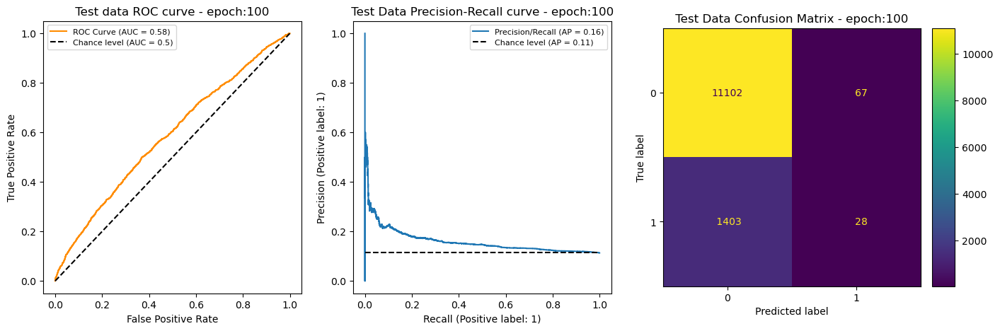

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_200
 Test  Acc : 88.18 % 	 roc_auc: 0.5813 	 Precision: 0.2364 	 Recall: 0.0182 	 F1: 0.0337

 Test Label counts:  True: [11169  1431] 	 Pred: [12490   110] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.24      0.02      0.03      1431

    accuracy                           0.88     12600
   macro avg       0.56      0.51      0.49     12600
weighted avg       0.81      0.88      0.83     12600



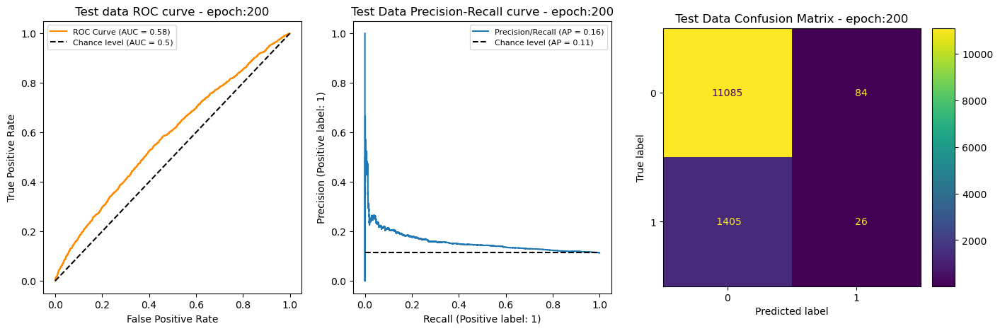

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_300
 Test  Acc : 88.18 % 	 roc_auc: 0.5809 	 Precision: 0.2542 	 Recall: 0.0210 	 F1: 0.0387

 Test Label counts:  True: [11169  1431] 	 Pred: [12482   118] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.25      0.02      0.04      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



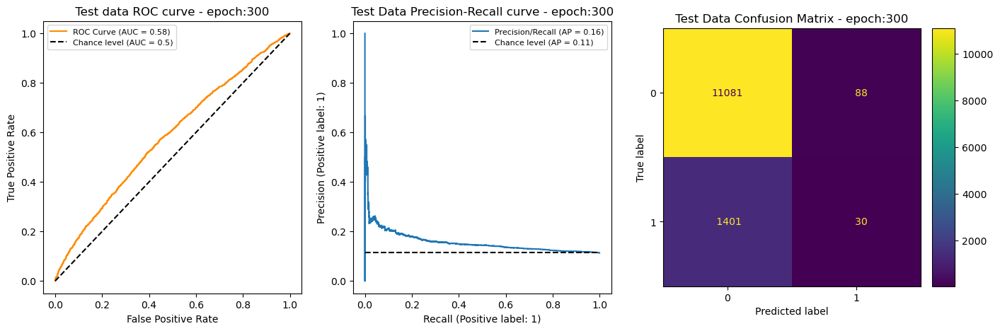

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_400
 Test  Acc : 88.18 % 	 roc_auc: 0.5809 	 Precision: 0.2542 	 Recall: 0.0210 	 F1: 0.0387

 Test Label counts:  True: [11169  1431] 	 Pred: [12482   118] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.25      0.02      0.04      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



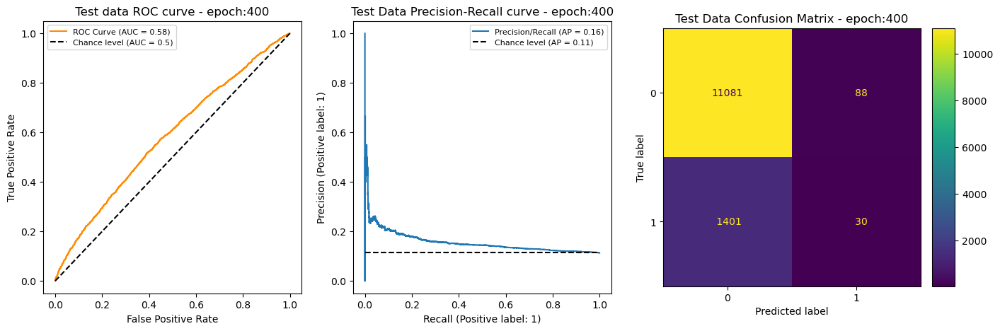

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_500
 Test  Acc : 88.18 % 	 roc_auc: 0.5809 	 Precision: 0.2542 	 Recall: 0.0210 	 F1: 0.0387

 Test Label counts:  True: [11169  1431] 	 Pred: [12482   118] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.25      0.02      0.04      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



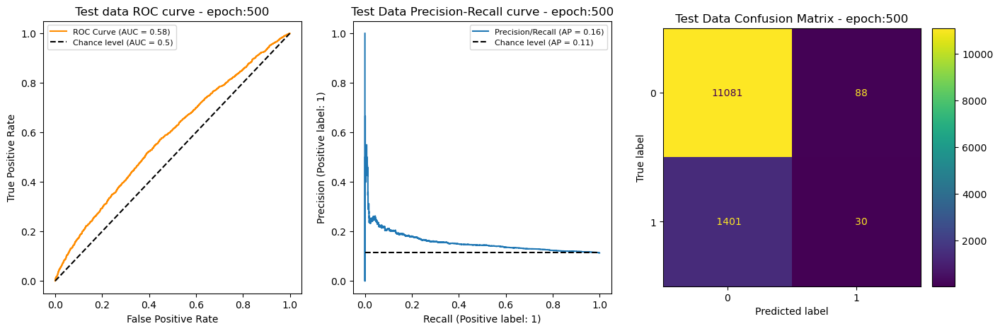

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_600
 Test  Acc : 88.18 % 	 roc_auc: 0.5809 	 Precision: 0.2542 	 Recall: 0.0210 	 F1: 0.0387

 Test Label counts:  True: [11169  1431] 	 Pred: [12482   118] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.25      0.02      0.04      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



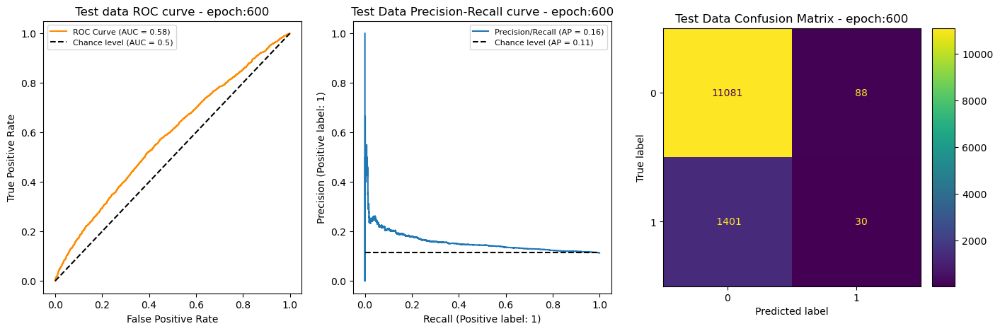

In [50]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_300
 Test  Acc : 88.18 % 	 roc_auc: 0.5809 	 Precision: 0.2542 	 Recall: 0.0210 	 F1: 0.0387

 Test Label counts:  True: [11169  1431] 	 Pred: [12482   118] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.25      0.02      0.04      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



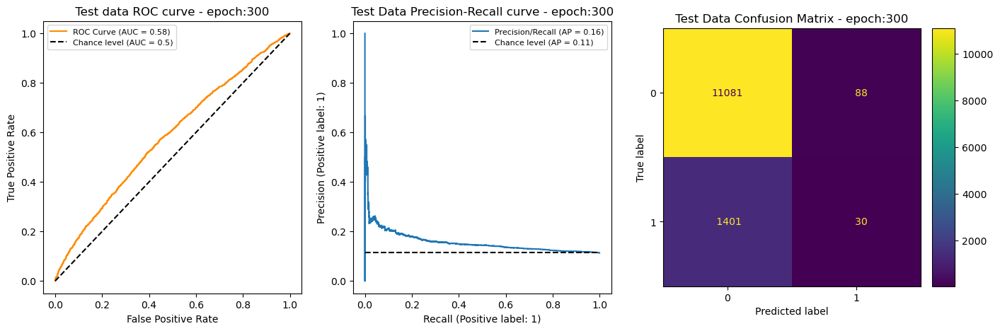

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_300
 Val   Acc : 88.26 % 	 roc_auc: 0.5711 	 Precision: 0.2720 	 Recall: 0.0239 	 F1: 0.0440

 Val Label counts:  True: [11178  1422] 	 Pred: [12475   125] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11178
           1       0.27      0.02      0.04      1422

    accuracy                           0.88     12600
   macro avg       0.58      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



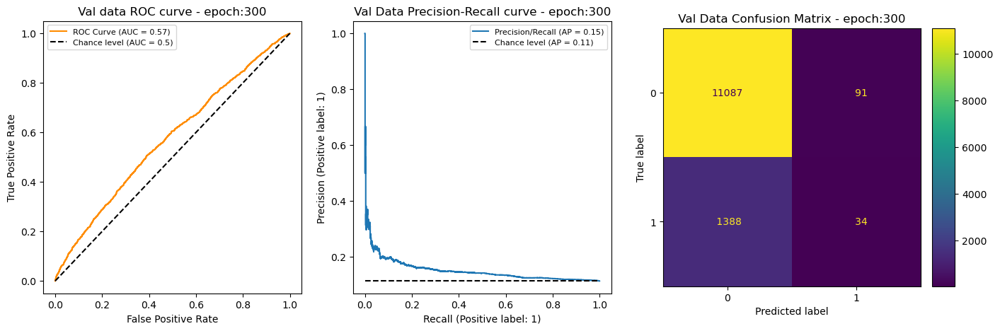

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240927_2300_ep_300
 Train Acc : 88.83 % 	 roc_auc: 0.7842 	 Precision: 0.8462 	 Recall: 0.0595 	 F1: 0.1112

 Train Label counts:  True: [11121  1479] 	 Pred: [12496   104] 

 Train Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11121
           1       0.85      0.06      0.11      1479

    accuracy                           0.89     12600
   macro avg       0.87      0.53      0.53     12600
weighted avg       0.88      0.89      0.84     12600



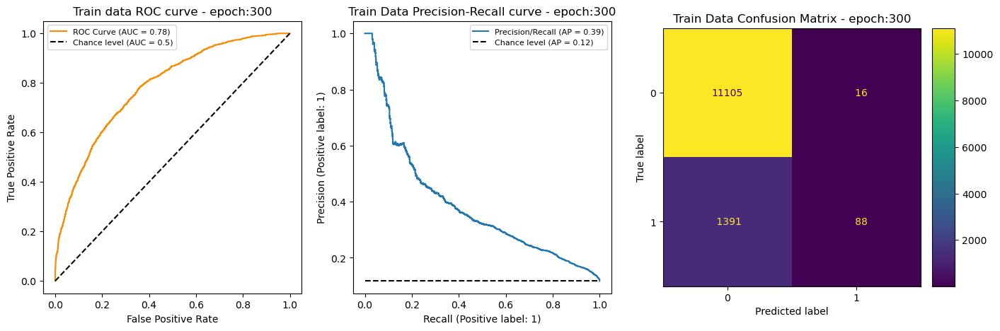

In [51]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

## SNNL (cpb 600, Latent 250, SNN Factor 3) ---->(Single 512 Layer NN)

In [46]:
AE_LATENT_DIM = 250
AE_RUNMODE = 'snnl'
AE_DATETIME = "20240917_2004"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20240927_2345'
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-03 23:07:55,109 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-03 23:07:55,110 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train.csv
2024-10-03 23:07:55,110 - utils.dataloader - INFO: -  type    :  train
2024-10-03 23:07:55,111 - utils.dataloader - INFO: -  start   :  21600
2024-10-03 23:07:55,112 - utils.dataloader - INFO: -  end     :  34200
2024-10-03 23:07:55,112 - utils.dataloader - INFO: -  numrows :  12600
2024-10-03 23:07:55,113 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-03 23:07:55,113 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-03 23:07:55,114 - utils.dataloader - INFO: -  sample_size :  3
2024-10-03 23:07:55,114 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-03 23:07:55,115 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_{ep}
./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_100
 Test  Acc : 88.44 % 	 roc_auc: 0.6337 	 Precision: 0.3239 	 Recall: 0.0161 	 F1: 0.0306

 Test Label counts:  True: [11169  1431] 	 Pred: [12529    71] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.32      0.02      0.03      1431

    accuracy                           0.88     12600
   macro avg       0.61      0.51      0.48     12600
weighted avg       0.82      0.88      0.84     12600



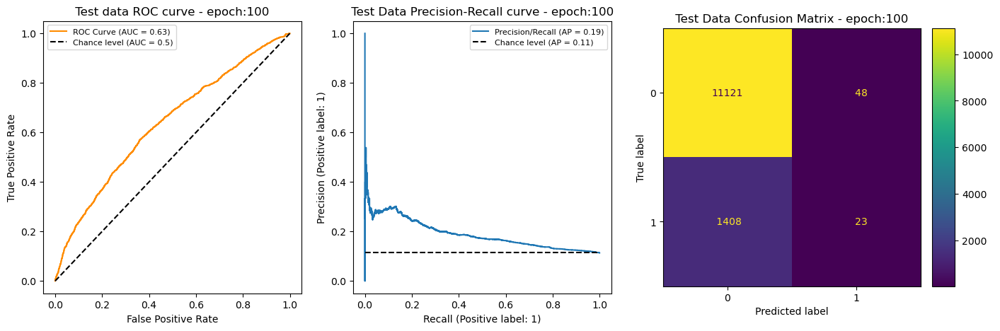

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_200
 Test  Acc : 88.53 % 	 roc_auc: 0.6337 	 Precision: 0.3542 	 Recall: 0.0119 	 F1: 0.0230

 Test Label counts:  True: [11169  1431] 	 Pred: [12552    48] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.35      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.84     12600



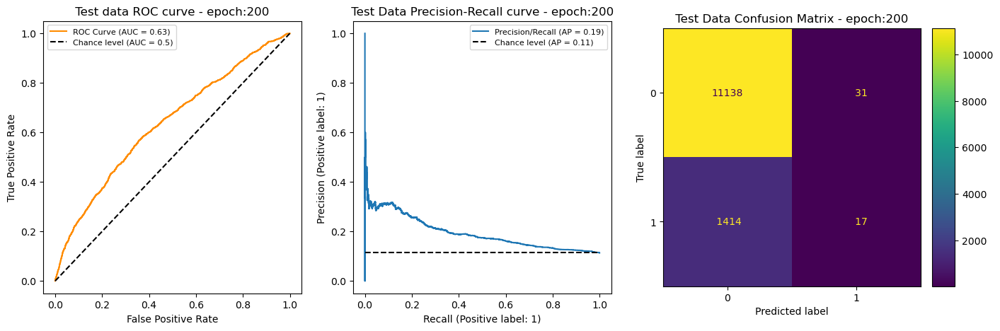

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_300
 Test  Acc : 88.53 % 	 roc_auc: 0.6336 	 Precision: 0.3600 	 Recall: 0.0126 	 F1: 0.0243

 Test Label counts:  True: [11169  1431] 	 Pred: [12550    50] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.36      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.84     12600



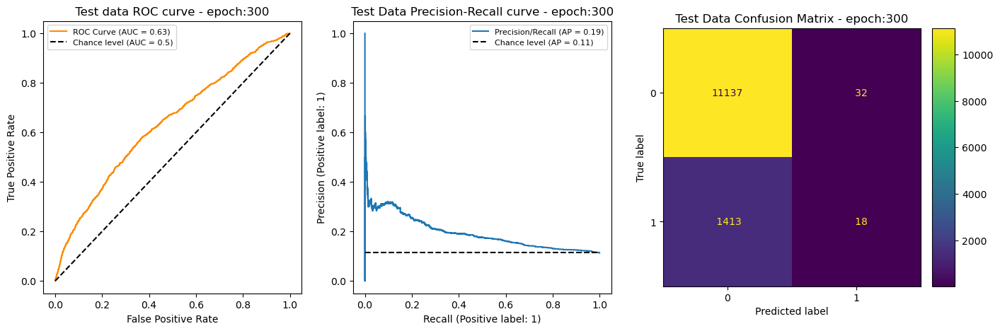

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_400
 Test  Acc : 88.53 % 	 roc_auc: 0.6336 	 Precision: 0.3600 	 Recall: 0.0126 	 F1: 0.0243

 Test Label counts:  True: [11169  1431] 	 Pred: [12550    50] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.36      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.84     12600



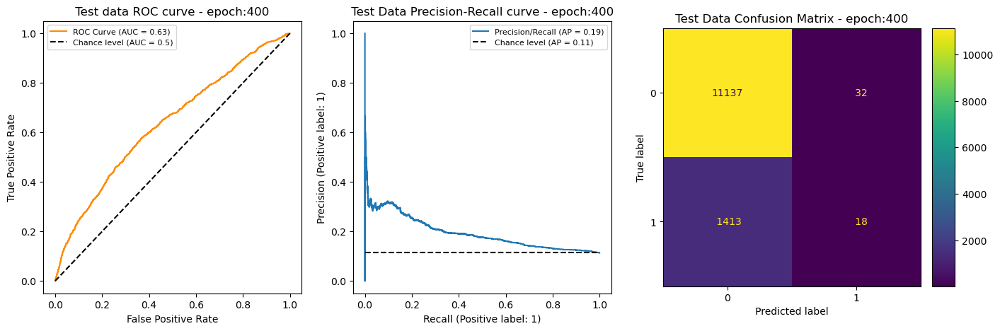

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_500
 Test  Acc : 88.53 % 	 roc_auc: 0.6336 	 Precision: 0.3600 	 Recall: 0.0126 	 F1: 0.0243

 Test Label counts:  True: [11169  1431] 	 Pred: [12550    50] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.36      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.84     12600



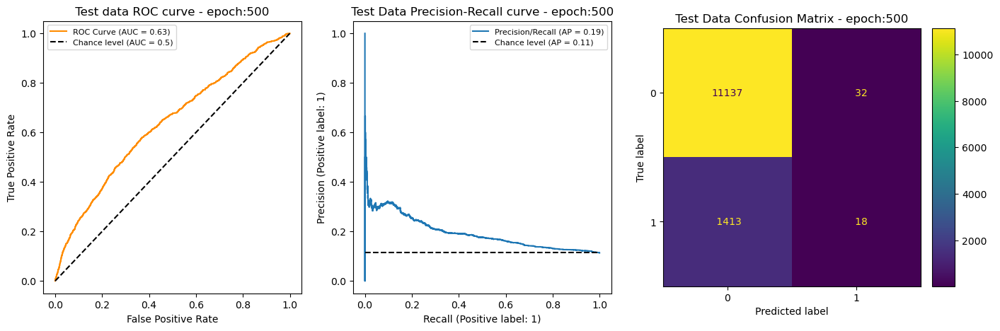

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_600
 Test  Acc : 88.53 % 	 roc_auc: 0.6336 	 Precision: 0.3600 	 Recall: 0.0126 	 F1: 0.0243

 Test Label counts:  True: [11169  1431] 	 Pred: [12550    50] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.36      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.84     12600



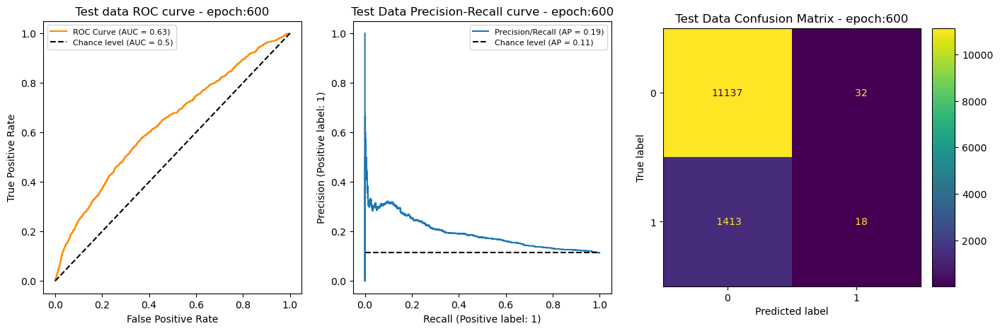

In [47]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t1

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_300
 Test  Acc : 88.53 % 	 roc_auc: 0.6336 	 Precision: 0.3600 	 Recall: 0.0126 	 F1: 0.0243

 Test Label counts:  True: [11169  1431] 	 Pred: [12550    50] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.36      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.62      0.50      0.48     12600
weighted avg       0.83      0.89      0.84     12600



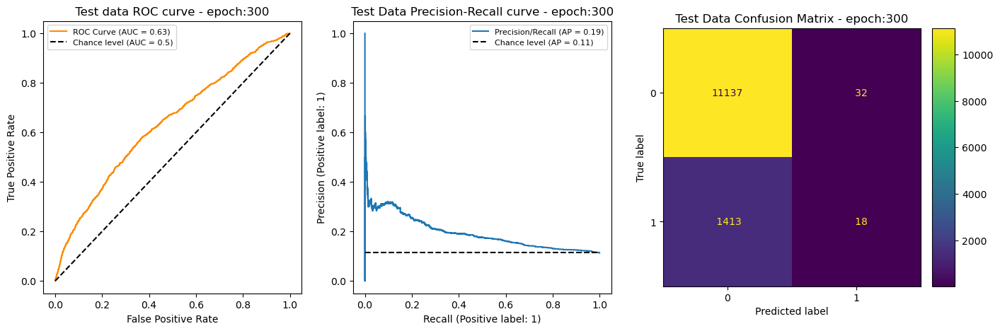

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_300
 Val   Acc : 88.62 % 	 roc_auc: 0.6327 	 Precision: 0.3929 	 Recall: 0.0155 	 F1: 0.0298

 Val Label counts:  True: [11178  1422] 	 Pred: [12544    56] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11178
           1       0.39      0.02      0.03      1422

    accuracy                           0.89     12600
   macro avg       0.64      0.51      0.48     12600
weighted avg       0.83      0.89      0.84     12600



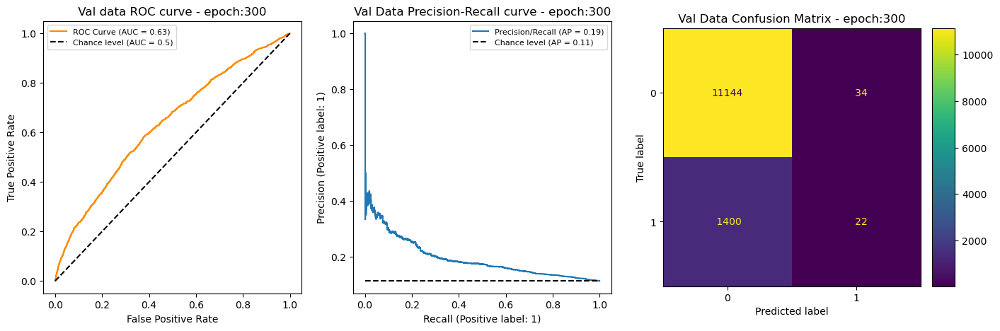

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240927_2345_ep_300
 Train Acc : 88.52 % 	 roc_auc: 0.6782 	 Precision: 0.8810 	 Recall: 0.0250 	 F1: 0.0487

 Train Label counts:  True: [11121  1479] 	 Pred: [12558    42] 

 Train Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11121
           1       0.88      0.03      0.05      1479

    accuracy                           0.89     12600
   macro avg       0.88      0.51      0.49     12600
weighted avg       0.88      0.89      0.83     12600



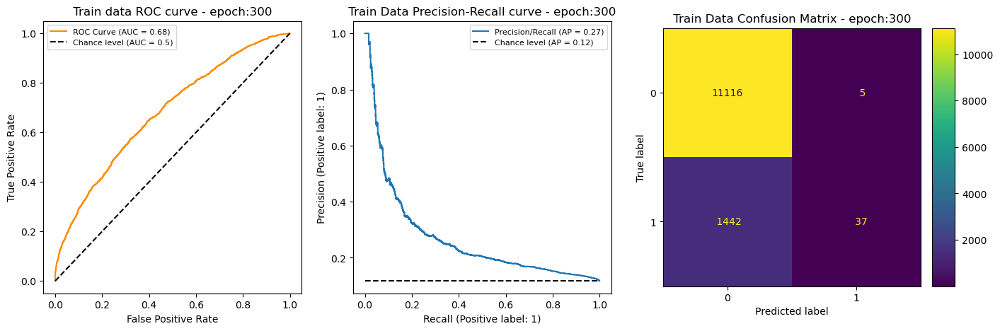

In [48]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

# 4 Layer ReLU 256/256/128

## Baseline (cpb 600, Latent 150) ---->  (4 Layer ReLU 256/256/128)

In [61]:
AE_RUNMODE = 'base'
AE_DATETIME = "20240923_1943"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "BEST"
AE_LATENT_DIM = 150
RUN_DATETIME = '20241002_1940'

input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS

MODEL_TYPE = 'relu'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)

2024-10-11 18:49:24,335 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-11 18:49:24,336 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
2024-10-11 18:49:24,337 - utils.dataloader - INFO: -  type    :  train
2024-10-11 18:49:24,337 - utils.dataloader - INFO: -  start   :  21600
2024-10-11 18:49:24,338 - utils.dataloader - INFO: -  end     :  34200
2024-10-11 18:49:24,339 - utils.dataloader - INFO: -  numrows :  12600
2024-10-11 18:49:24,339 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-11 18:49:24,340 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-11 18:49:24,340 - utils.dataloader - INFO: -  sample_size :  3
2024-10-11 18:49:24,341 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-11 18:49:24,342 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1940_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1940_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1940_ep_100
 Test  Acc : 82.44 % 	 roc_auc: 0.5387 	 Precision: 0.1269 	 Recall: 0.0929 	 F1: 0.1073

 Test Label counts:  True: [11169  1431] 	 Pred: [11552  1048] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.92      0.90     11169
           1       0.13      0.09      0.11      1431

    accuracy                           0.82     12600
   macro avg       0.51      0.51      0.50     12600
weighted avg       0.80      0.82      0.81     12600



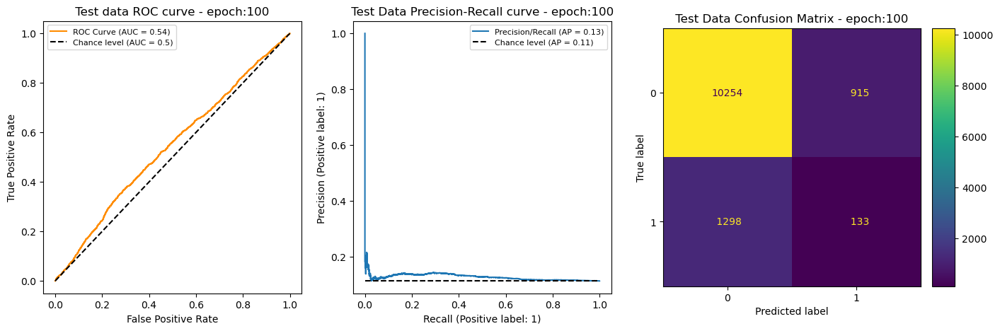

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1940_ep_200
 Test  Acc : 81.84 % 	 roc_auc: 0.5386 	 Precision: 0.1316 	 Recall: 0.1069 	 F1: 0.1180

 Test Label counts:  True: [11169  1431] 	 Pred: [11437  1163] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.91      0.90     11169
           1       0.13      0.11      0.12      1431

    accuracy                           0.82     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.80      0.82      0.81     12600



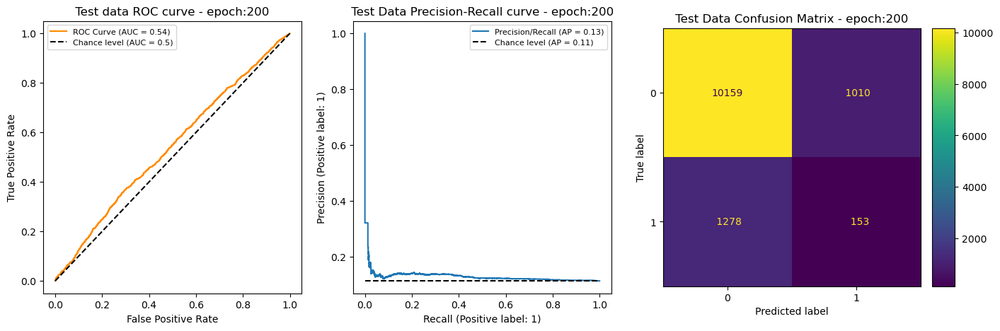

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1940_ep_300
 Test  Acc : 80.71 % 	 roc_auc: 0.5375 	 Precision: 0.1346 	 Recall: 0.1286 	 F1: 0.1315

 Test Label counts:  True: [11169  1431] 	 Pred: [11233  1367] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.89      0.89     11169
           1       0.13      0.13      0.13      1431

    accuracy                           0.81     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.80      0.81      0.81     12600



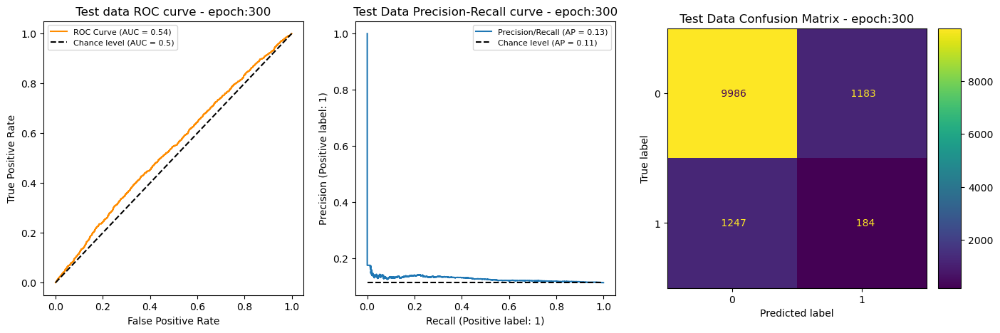

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1940_ep_400
 Test  Acc : 80.29 % 	 roc_auc: 0.5373 	 Precision: 0.1351 	 Recall: 0.1363 	 F1: 0.1357

 Test Label counts:  True: [11169  1431] 	 Pred: [11157  1443] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.89      0.89     11169
           1       0.14      0.14      0.14      1431

    accuracy                           0.80     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.80      0.80      0.80     12600



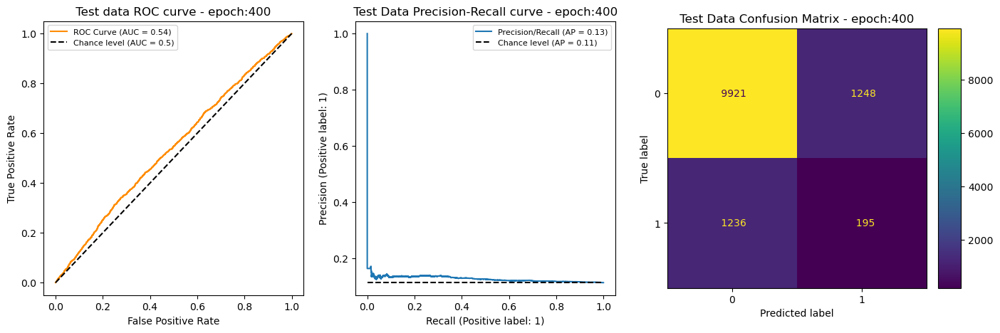

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1940_ep_500
 Test  Acc : 80.21 % 	 roc_auc: 0.5374 	 Precision: 0.1343 	 Recall: 0.1363 	 F1: 0.1353

 Test Label counts:  True: [11169  1431] 	 Pred: [11148  1452] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.89      0.89     11169
           1       0.13      0.14      0.14      1431

    accuracy                           0.80     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.80      0.80      0.80     12600



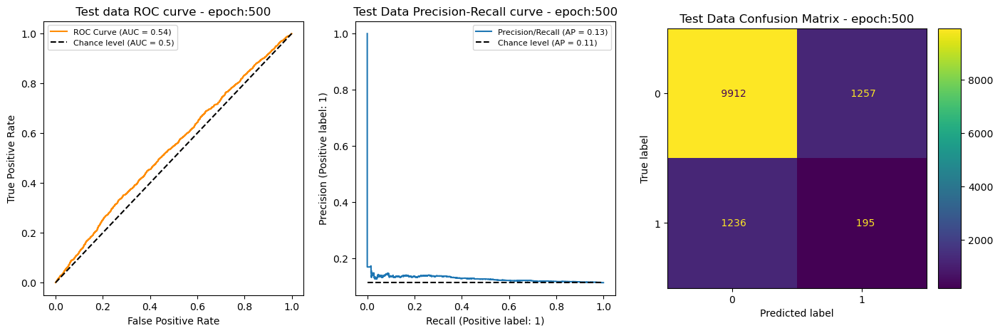

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1940_ep_600
 Test  Acc : 80.25 % 	 roc_auc: 0.5374 	 Precision: 0.1342 	 Recall: 0.1356 	 F1: 0.1349

 Test Label counts:  True: [11169  1431] 	 Pred: [11154  1446] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.89      0.89     11169
           1       0.13      0.14      0.13      1431

    accuracy                           0.80     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.80      0.80      0.80     12600



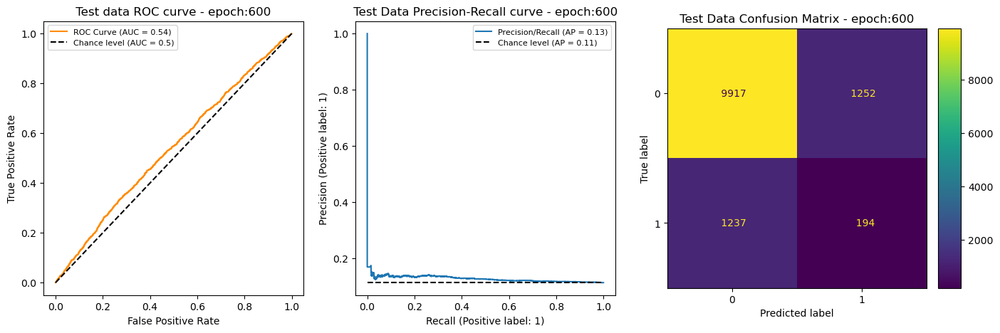

In [36]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

In [62]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 81.84 %    ROC Auc: 0.5386    PR Auc:0.1155    F1: 0.1180    Prec: 0.1316  Recall: 0.1069    
200 Val   Acc : 81.86 %    ROC Auc: 0.5500    PR Auc:0.1175    F1: 0.1380    Prec: 0.1488  Recall: 0.1287    
200 Train Acc : 95.21 %    ROC Auc: 0.9769    PR Auc:0.6396    F1: 0.7685    Prec: 0.8890  Recall: 0.6768    

300 Test  Acc : 80.71 %    ROC Auc: 0.5375    PR Auc:0.1163    F1: 0.1315    Prec: 0.1346  Recall: 0.1286    
300 Val   Acc : 80.69 %    ROC Auc: 0.5517    PR Auc:0.1186    F1: 0.1514    Prec: 0.1502  Recall: 0.1526    
300 Train Acc : 97.79 %    ROC Auc: 0.9925    PR Auc:0.8312    F1: 0.9008    Prec: 0.9539  Recall: 0.8533    



## SNNL (cpb 600, Latent 150, SNN Factor 3) ---->(4 layer NN with ReLU)

In [66]:
AE_RUNMODE = 'snnl'
AE_DATETIME = "20240906_2201"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
AE_LATENT_DIM = 150
RUN_DATETIME = '20240909_1801'

input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS

MODEL_TYPE = 'relu'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)

2024-10-11 18:53:03,818 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-11 18:53:03,819 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
2024-10-11 18:53:03,820 - utils.dataloader - INFO: -  type    :  train
2024-10-11 18:53:03,821 - utils.dataloader - INFO: -  start   :  21600
2024-10-11 18:53:03,822 - utils.dataloader - INFO: -  end     :  34200
2024-10-11 18:53:03,823 - utils.dataloader - INFO: -  numrows :  12600
2024-10-11 18:53:03,824 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-11 18:53:03,825 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-11 18:53:03,825 - utils.dataloader - INFO: -  sample_size :  3
2024-10-11 18:53:03,827 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-11 18:53:03,828 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_1801_ep_{ep}
./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_1801_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

In [64]:
# RUN_DATETIME = '20240909_1801'
# AE_LATENT_DIM = 150
# input_num_cols = AE_LATENT_DIM + 11
# TPSA_THRESHOLD = 100
# MODEL_TYPE = 'relu'

# data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH, tpsa_threshold = TPSA_THRESHOLD)
# model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)
# _ = summary(model, verbose = 2, input_size=(30, n_input), col_names = SUMMARY_COL_NAMES)

# CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
# CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
# print(CKPT_FILE)
# print(CKPT_FILE.format(ep=999))

 Test  Acc : 88.48 % 	 roc_auc: 0.6175 	 Precision: 0.3279 	 Recall: 0.0140 	 F1: 0.0268

 Test Label counts:  True: [11169  1431] 	 Pred: [12539    61] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.33      0.01      0.03      1431

    accuracy                           0.88     12600
   macro avg       0.61      0.51      0.48     12600
weighted avg       0.82      0.88      0.84     12600



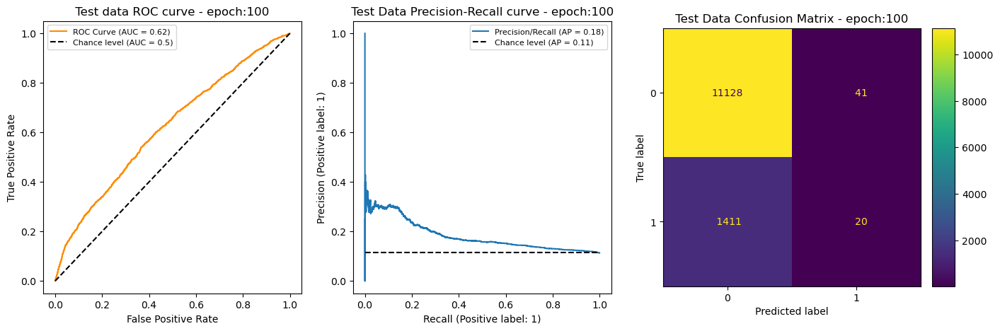

 Test  Acc : 88.57 % 	 roc_auc: 0.6186 	 Precision: 0.4000 	 Recall: 0.0126 	 F1: 0.0244

 Test Label counts:  True: [11169  1431] 	 Pred: [12555    45] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.40      0.01      0.02      1431

    accuracy                           0.89     12600
   macro avg       0.64      0.51      0.48     12600
weighted avg       0.83      0.89      0.84     12600



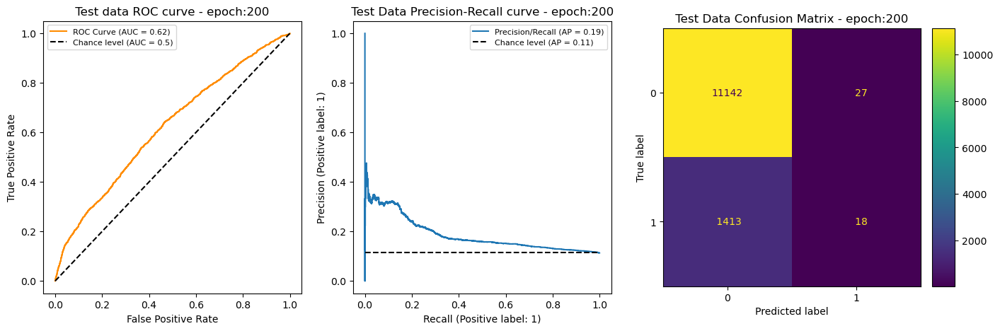

 Test  Acc : 88.55 % 	 roc_auc: 0.6190 	 Precision: 0.3889 	 Recall: 0.0147 	 F1: 0.0283

 Test Label counts:  True: [11169  1431] 	 Pred: [12546    54] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.39      0.01      0.03      1431

    accuracy                           0.89     12600
   macro avg       0.64      0.51      0.48     12600
weighted avg       0.83      0.89      0.84     12600



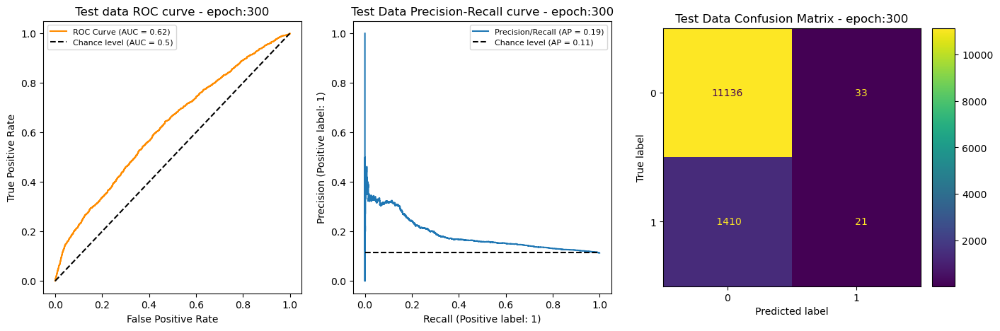

 Test  Acc : 88.55 % 	 roc_auc: 0.6190 	 Precision: 0.3889 	 Recall: 0.0147 	 F1: 0.0283

 Test Label counts:  True: [11169  1431] 	 Pred: [12546    54] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.39      0.01      0.03      1431

    accuracy                           0.89     12600
   macro avg       0.64      0.51      0.48     12600
weighted avg       0.83      0.89      0.84     12600



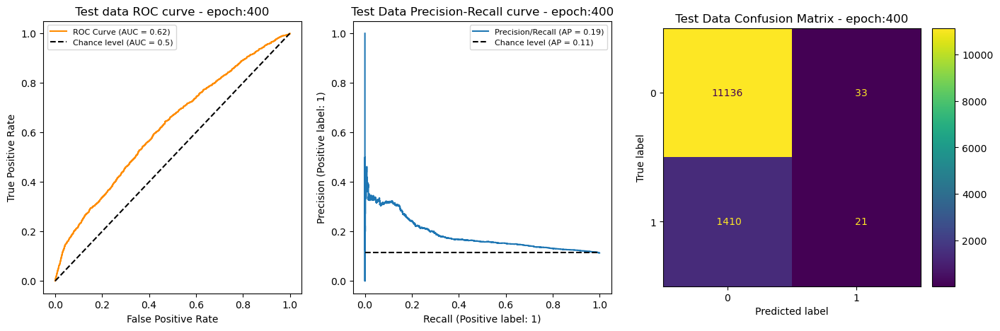

 Test  Acc : 88.55 % 	 roc_auc: 0.6190 	 Precision: 0.3889 	 Recall: 0.0147 	 F1: 0.0283

 Test Label counts:  True: [11169  1431] 	 Pred: [12546    54] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.39      0.01      0.03      1431

    accuracy                           0.89     12600
   macro avg       0.64      0.51      0.48     12600
weighted avg       0.83      0.89      0.84     12600



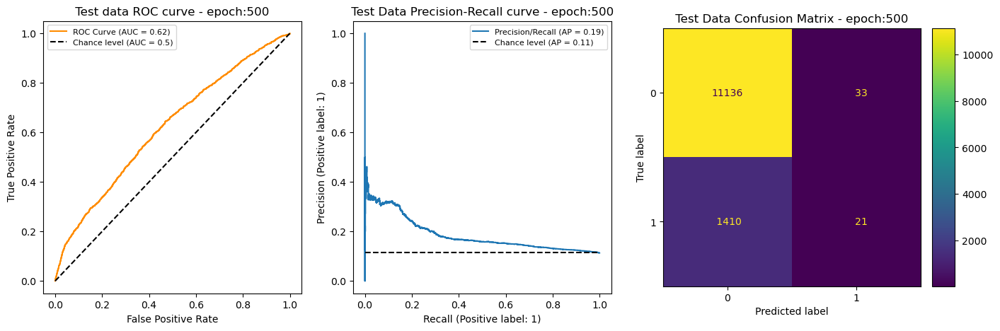

In [50]:
# data_type = 'test'
# for ep in [100,200,300,400,500]:
#     model, optimizer, scheudler, loaded_epoch = load_checkpoint(model, optimizer, scheduler, metrics, CKPT_FILE.format(ep=ep), ckpt_path = CKPT_PATH)
#     _ = model.eval();
#     mdl_outputs = run_model_on_test_data(model, data_loader[data_type], DEVICE, title = data_type, verbose = False)
#     mo = compute_classification_metrics(mdl_outputs, epochs = loaded_epoch, title = data_type, verbose = True)
#     plot_cls_metrics(mdl_outputs.y_true, mdl_outputs.y_prob, mdl_outputs.y_pred, epochs = loaded_epoch, title = data_type )
#     plt.show()

### t0

In [68]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

In [67]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 88.57 %    ROC Auc: 0.6186    PR Auc:0.1172    F1: 0.0244    Prec: 0.4000  Recall: 0.0126    
200 Val   Acc : 88.72 %    ROC Auc: 0.6297    PR Auc:0.1193    F1: 0.0314    Prec: 0.5111  Recall: 0.0162    
200 Train Acc : 88.54 %    ROC Auc: 0.6893    PR Auc:0.1382    F1: 0.0525    Prec: 0.8889  Recall: 0.0270    

300 Test  Acc : 88.55 %    ROC Auc: 0.6190    PR Auc:0.1176    F1: 0.0283    Prec: 0.3889  Recall: 0.0147    
300 Val   Acc : 88.70 %    ROC Auc: 0.6289    PR Auc:0.1193    F1: 0.0339    Prec: 0.4808  Recall: 0.0176    
300 Train Acc : 88.53 %    ROC Auc: 0.6900    PR Auc:0.1379    F1: 0.0549    Prec: 0.8400  Recall: 0.0284    



# 4 Layer Batch Norm 256/256/128

## Baseline (cpb 600, Latent 150) ---->  (4 Layer BatchNorm 256/256/128)

In [69]:
AE_RUNMODE = 'base'
AE_DATETIME = "20240923_1943"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "BEST"
AE_LATENT_DIM = 150
RUN_DATETIME = '20241002_1945'

input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS

MODEL_TYPE = 'batch_norm'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)

2024-10-11 18:57:27,423 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-11 18:57:27,424 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
2024-10-11 18:57:27,425 - utils.dataloader - INFO: -  type    :  train
2024-10-11 18:57:27,425 - utils.dataloader - INFO: -  start   :  21600
2024-10-11 18:57:27,426 - utils.dataloader - INFO: -  end     :  34200
2024-10-11 18:57:27,426 - utils.dataloader - INFO: -  numrows :  12600
2024-10-11 18:57:27,427 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-11 18:57:27,428 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-11 18:57:27,428 - utils.dataloader - INFO: -  sample_size :  3
2024-10-11 18:57:27,429 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-11 18:57:27,429 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1945_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1945_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1945_ep_100
 Val   Acc : 83.17 % 	 roc_auc: 0.5440 	 Precision: 0.1439 	 Recall: 0.0992 	 F1: 0.1174

 Val Label counts:  True: [11178  1422] 	 Pred: [11620   980] 

 Val Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.92      0.91     11178
           1       0.14      0.10      0.12      1422

    accuracy                           0.83     12600
   macro avg       0.52      0.51      0.51     12600
weighted avg       0.81      0.83      0.82     12600



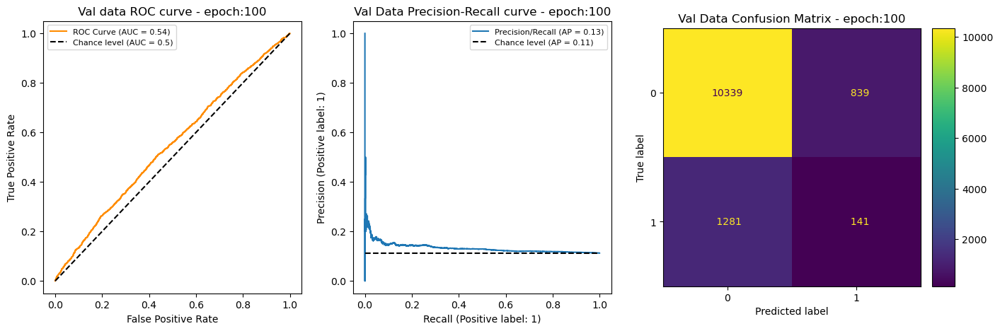

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1945_ep_200
 Val   Acc : 81.04 % 	 roc_auc: 0.5534 	 Precision: 0.1607 	 Recall: 0.1610 	 F1: 0.1609

 Val Label counts:  True: [11178  1422] 	 Pred: [11175  1425] 

 Val Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.89      0.89     11178
           1       0.16      0.16      0.16      1422

    accuracy                           0.81     12600
   macro avg       0.53      0.53      0.53     12600
weighted avg       0.81      0.81      0.81     12600



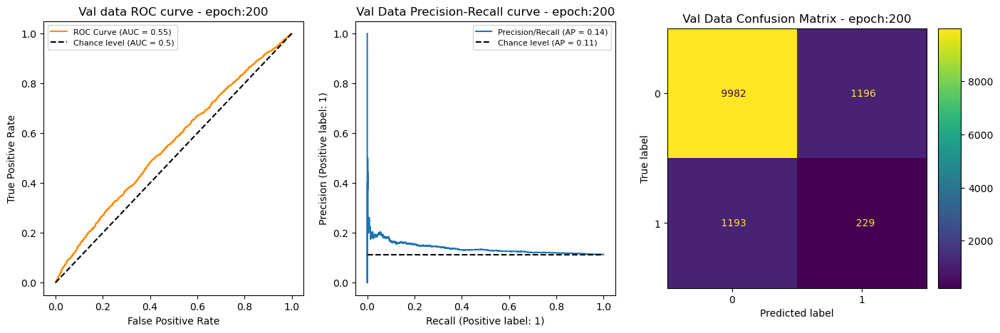

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1945_ep_300
 Val   Acc : 81.52 % 	 roc_auc: 0.5541 	 Precision: 0.1594 	 Recall: 0.1491 	 F1: 0.1541

 Val Label counts:  True: [11178  1422] 	 Pred: [11270  1330] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.90      0.90     11178
           1       0.16      0.15      0.15      1422

    accuracy                           0.82     12600
   macro avg       0.53      0.52      0.53     12600
weighted avg       0.81      0.82      0.81     12600



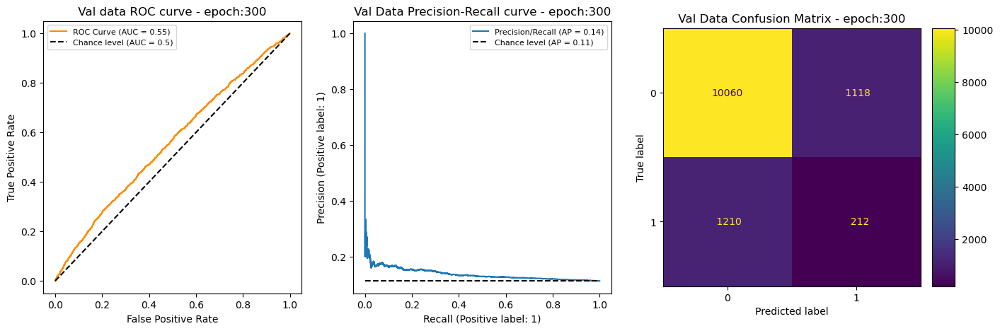

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1945_ep_400
 Val   Acc : 81.57 % 	 roc_auc: 0.5537 	 Precision: 0.1544 	 Recall: 0.1414 	 F1: 0.1476

 Val Label counts:  True: [11178  1422] 	 Pred: [11298  1302] 

 Val Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.90      0.90     11178
           1       0.15      0.14      0.15      1422

    accuracy                           0.82     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.81      0.82      0.81     12600



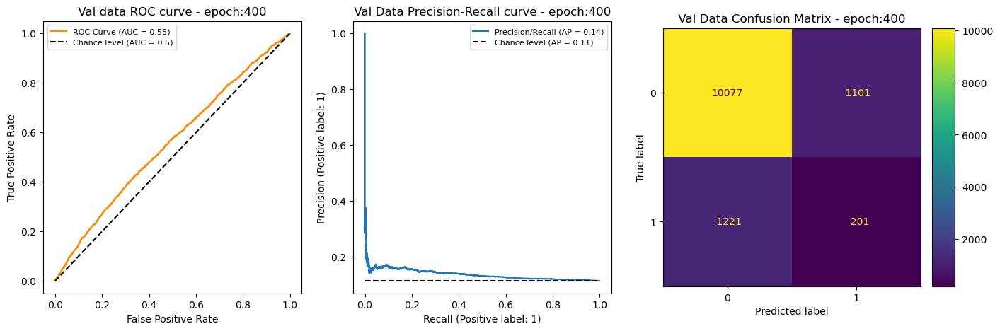

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1945_ep_500
 Val   Acc : 81.76 % 	 roc_auc: 0.5546 	 Precision: 0.1641 	 Recall: 0.1505 	 F1: 0.1570

 Val Label counts:  True: [11178  1422] 	 Pred: [11296  1304] 

 Val Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.90      0.90     11178
           1       0.16      0.15      0.16      1422

    accuracy                           0.82     12600
   macro avg       0.53      0.53      0.53     12600
weighted avg       0.81      0.82      0.81     12600



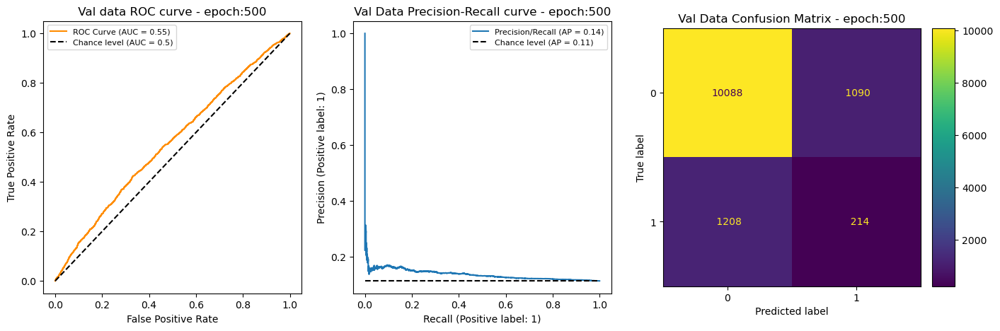

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_1945_ep_600
 Val   Acc : 81.72 % 	 roc_auc: 0.5544 	 Precision: 0.1604 	 Recall: 0.1463 	 F1: 0.1530

 Val Label counts:  True: [11178  1422] 	 Pred: [11303  1297] 

 Val Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.90      0.90     11178
           1       0.16      0.15      0.15      1422

    accuracy                           0.82     12600
   macro avg       0.53      0.52      0.53     12600
weighted avg       0.81      0.82      0.81     12600



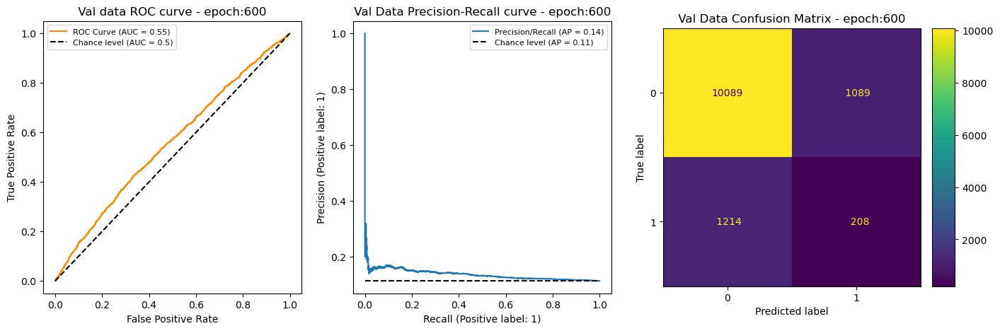

In [29]:
data_type = 'val'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

In [70]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 80.78 %    ROC Auc: 0.5451    PR Auc:0.1164    F1: 0.1319    Prec: 0.1354  Recall: 0.1286    
200 Val   Acc : 81.04 %    ROC Auc: 0.5534    PR Auc:0.1206    F1: 0.1609    Prec: 0.1607  Recall: 0.1610    
200 Train Acc : 93.20 %    ROC Auc: 0.9587    PR Auc:0.5281    F1: 0.6994    Prec: 0.7267  Recall: 0.6741    

300 Test  Acc : 81.55 %    ROC Auc: 0.5481    PR Auc:0.1191    F1: 0.1455    Prec: 0.1535  Recall: 0.1384    
300 Val   Acc : 81.52 %    ROC Auc: 0.5541    PR Auc:0.1198    F1: 0.1541    Prec: 0.1594  Recall: 0.1491    
300 Train Acc : 95.50 %    ROC Auc: 0.9800    PR Auc:0.6685    F1: 0.7999    Prec: 0.8368  Recall: 0.7661    



## SNNL (cpb 600, Latent 150, SNN Factor 3) ---->   (4 Layer BatchNorm 256/256/128)

 - Model: **20240909_2100** : Run on 4 FC layers model (includes final layer), with Batch Norm layers and Tanh non linearities

In [71]:
AE_RUNMODE = 'snnl'
AE_DATETIME = "20240906_2201"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20240909_2100'
AE_LATENT_DIM = 150
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'batch_norm'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-11 18:58:20,404 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-11 18:58:20,405 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
2024-10-11 18:58:20,406 - utils.dataloader - INFO: -  type    :  train
2024-10-11 18:58:20,407 - utils.dataloader - INFO: -  start   :  21600
2024-10-11 18:58:20,407 - utils.dataloader - INFO: -  end     :  34200
2024-10-11 18:58:20,408 - utils.dataloader - INFO: -  numrows :  12600
2024-10-11 18:58:20,410 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-11 18:58:20,411 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-11 18:58:20,411 - utils.dataloader - INFO: -  sample_size :  3
2024-10-11 18:58:20,412 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-11 18:58:20,413 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_{ep}
./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_100
 Test  Acc : 88.06 % 	 roc_auc: 0.5886 	 Precision: 0.2256 	 Recall: 0.0210 	 F1: 0.0384

 Test Label counts:  True: [11169  1431] 	 Pred: [12467   133] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.23      0.02      0.04      1431

    accuracy                           0.88     12600
   macro avg       0.56      0.51      0.49     12600
weighted avg       0.81      0.88      0.83     12600



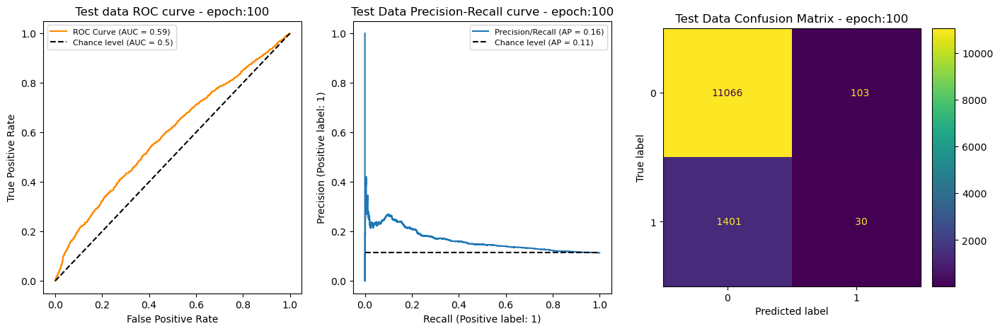

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_200
 Test  Acc : 87.92 % 	 roc_auc: 0.5785 	 Precision: 0.2275 	 Recall: 0.0266 	 F1: 0.0476

 Test Label counts:  True: [11169  1431] 	 Pred: [12433   167] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.23      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.56      0.51      0.49     12600
weighted avg       0.81      0.88      0.83     12600



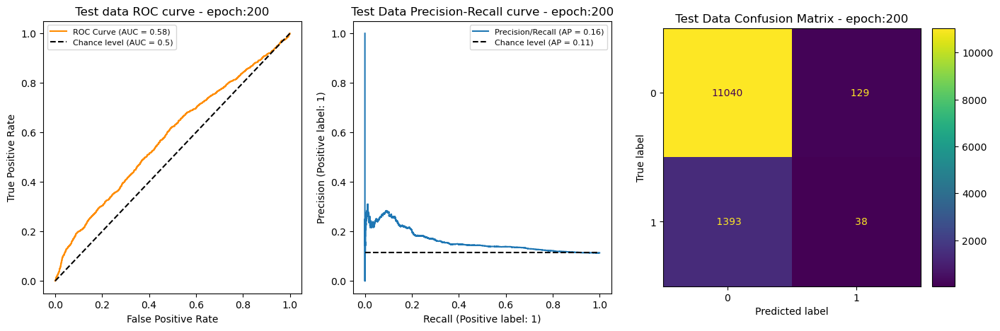

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_300
 Test  Acc : 87.49 % 	 roc_auc: 0.5785 	 Precision: 0.1888 	 Recall: 0.0307 	 F1: 0.0529

 Test Label counts:  True: [11169  1431] 	 Pred: [12367   233] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.19      0.03      0.05      1431

    accuracy                           0.87     12600
   macro avg       0.54      0.51      0.49     12600
weighted avg       0.81      0.87      0.83     12600



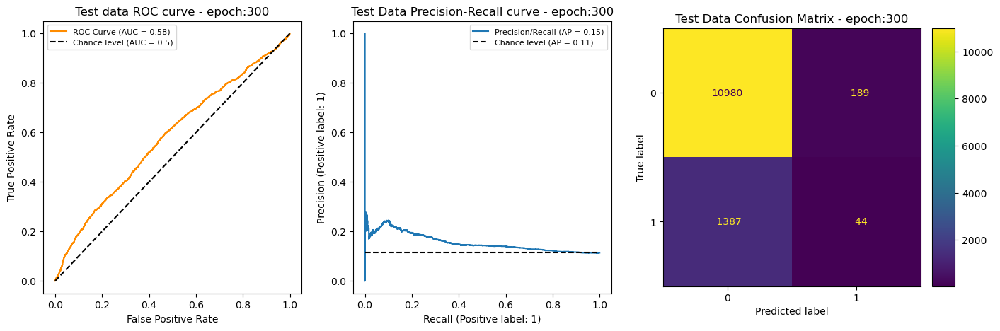

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_400
 Test  Acc : 87.56 % 	 roc_auc: 0.5792 	 Precision: 0.1937 	 Recall: 0.0300 	 F1: 0.0520

 Test Label counts:  True: [11169  1431] 	 Pred: [12378   222] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.19      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.54      0.51      0.49     12600
weighted avg       0.81      0.88      0.83     12600



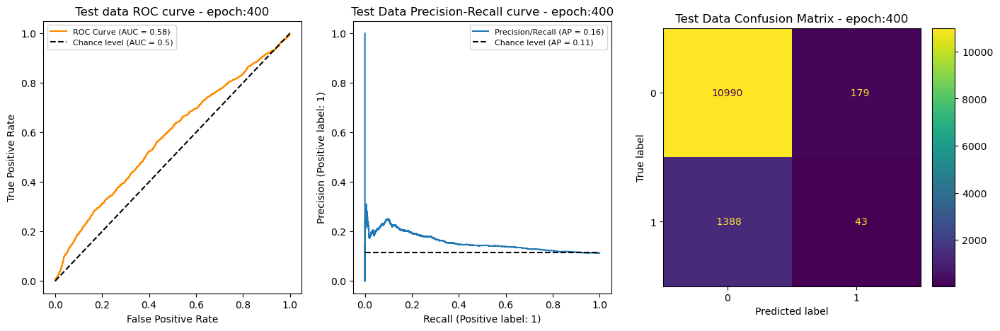

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_500
 Test  Acc : 87.56 % 	 roc_auc: 0.5793 	 Precision: 0.1937 	 Recall: 0.0300 	 F1: 0.0520

 Test Label counts:  True: [11169  1431] 	 Pred: [12378   222] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.19      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.54      0.51      0.49     12600
weighted avg       0.81      0.88      0.83     12600



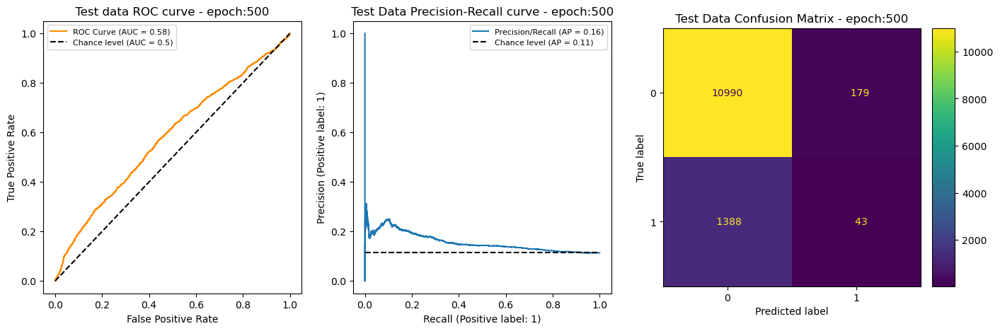

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_600
 Test  Acc : 87.56 % 	 roc_auc: 0.5793 	 Precision: 0.1937 	 Recall: 0.0300 	 F1: 0.0520

 Test Label counts:  True: [11169  1431] 	 Pred: [12378   222] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.19      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.54      0.51      0.49     12600
weighted avg       0.81      0.88      0.83     12600



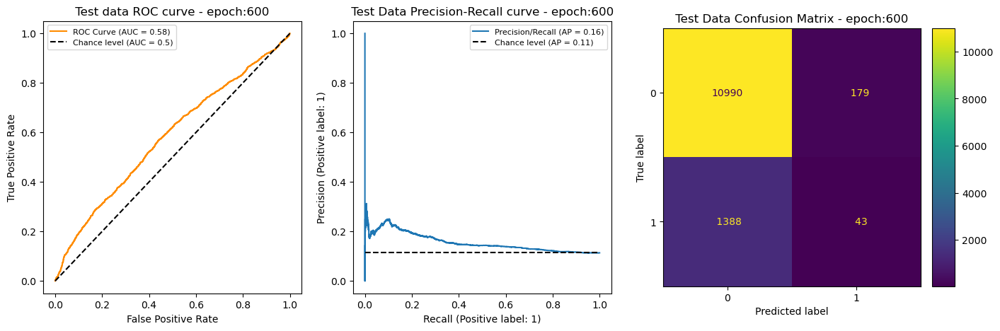

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_700
 Test  Acc : 87.56 % 	 roc_auc: 0.5793 	 Precision: 0.1937 	 Recall: 0.0300 	 F1: 0.0520

 Test Label counts:  True: [11169  1431] 	 Pred: [12378   222] 

 Test Data Classification Report: - epoch:700 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.19      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.54      0.51      0.49     12600
weighted avg       0.81      0.88      0.83     12600



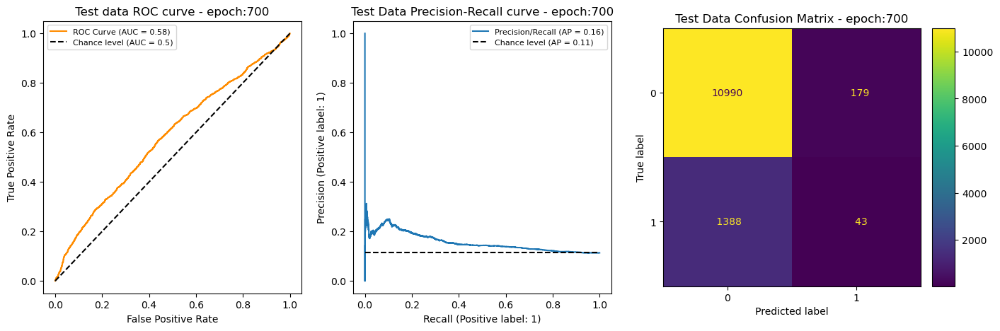

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2100_ep_800
 Test  Acc : 87.56 % 	 roc_auc: 0.5793 	 Precision: 0.1937 	 Recall: 0.0300 	 F1: 0.0520

 Test Label counts:  True: [11169  1431] 	 Pred: [12378   222] 

 Test Data Classification Report: - epoch:800 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.19      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.54      0.51      0.49     12600
weighted avg       0.81      0.88      0.83     12600



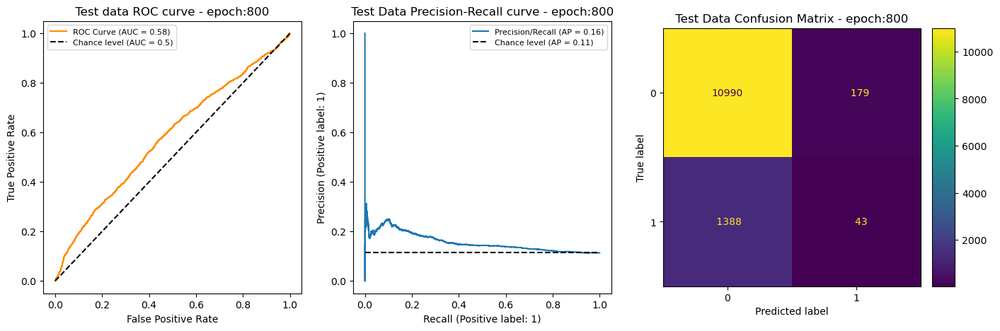

In [34]:
data_type = 'test'
for epoch in [100,200,300,400,500,600,700,800]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t1

In [72]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 87.92 %    ROC Auc: 0.5785    PR Auc:0.1166    F1: 0.0476    Prec: 0.2275  Recall: 0.0266    
200 Val   Acc : 88.00 %    ROC Auc: 0.5879    PR Auc:0.1174    F1: 0.0574    Prec: 0.2527  Recall: 0.0323    
200 Train Acc : 88.85 %    ROC Auc: 0.7020    PR Auc:0.1673    F1: 0.1500    Prec: 0.7126  Recall: 0.0838    

300 Test  Acc : 87.49 %    ROC Auc: 0.5785    PR Auc:0.1159    F1: 0.0529    Prec: 0.1888  Recall: 0.0307    
300 Val   Acc : 87.75 %    ROC Auc: 0.5897    PR Auc:0.1175    F1: 0.0654    Prec: 0.2358  Recall: 0.0380    
300 Train Acc : 88.94 %    ROC Auc: 0.7282    PR Auc:0.1775    F1: 0.1829    Prec: 0.6872  Recall: 0.1055    



## Baseline (cpb 600, Latent 250) ---->  (4 Layer BatchNorm 256/256/128)

In [12]:
AE_RUNMODE = 'base'
AE_DATETIME = "20240917_2017"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
RUN_DATETIME = '20240929_2000'
AE_LATENT_DIM = 250
input_num_cols = AE_LATENT_DIM + 11

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model('batch_norm', input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)
_ = summary(model, verbose = 2, input_size=(30, n_input), col_names = SUMMARY_COL_NAMES)

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}"
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

2024-10-01 17:50:57,813 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-01 17:50:57,814 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
2024-10-01 17:50:57,815 - utils.dataloader - INFO: -  type    :  train
2024-10-01 17:50:57,816 - utils.dataloader - INFO: -  start   :  21600
2024-10-01 17:50:57,816 - utils.dataloader - INFO: -  end     :  34200
2024-10-01 17:50:57,817 - utils.dataloader - INFO: -  numrows :  12600
2024-10-01 17:50:57,818 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-01 17:50:57,818 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-01 17:50:57,819 - utils.dataloader - INFO: -  sample_size :  3
2024-10-01 17:50:57,819 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-01 17:50:57,820 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Param %                   Mult-Adds                 Trainable
Sequential                               [30, 250]                 [30, 1]                   --  

### t0

 Test  Acc : 49.78 % 	 roc_auc: 0.5135 	 Precision: 0.5283 	 Recall: 0.0426 	 F1: 0.0789

 Test Label counts:  True: [6243 6357] 	 Pred: [12087   513] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.50      0.96      0.65      6243
           1       0.53      0.04      0.08      6357

    accuracy                           0.50     12600
   macro avg       0.51      0.50      0.37     12600
weighted avg       0.51      0.50      0.36     12600



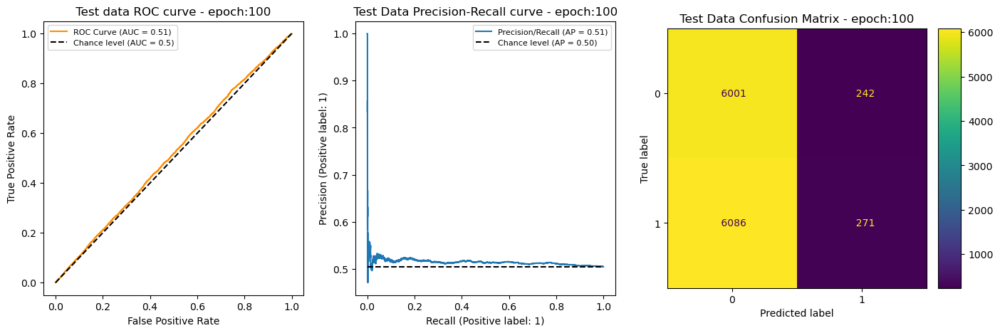

 Test  Acc : 49.73 % 	 roc_auc: 0.5123 	 Precision: 0.5140 	 Recall: 0.0664 	 F1: 0.1176

 Test Label counts:  True: [6243 6357] 	 Pred: [11779   821] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.50      0.94      0.65      6243
           1       0.51      0.07      0.12      6357

    accuracy                           0.50     12600
   macro avg       0.51      0.50      0.38     12600
weighted avg       0.51      0.50      0.38     12600



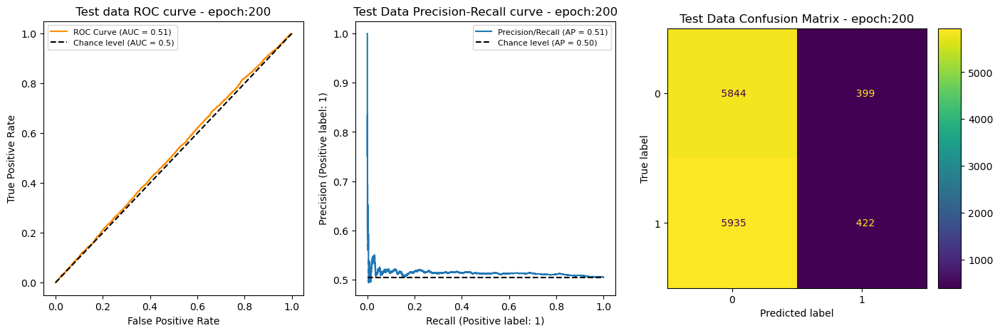

 Test  Acc : 49.93 % 	 roc_auc: 0.5116 	 Precision: 0.5280 	 Recall: 0.0713 	 F1: 0.1256

 Test Label counts:  True: [6243 6357] 	 Pred: [11742   858] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.50      0.94      0.65      6243
           1       0.53      0.07      0.13      6357

    accuracy                           0.50     12600
   macro avg       0.51      0.50      0.39     12600
weighted avg       0.51      0.50      0.39     12600



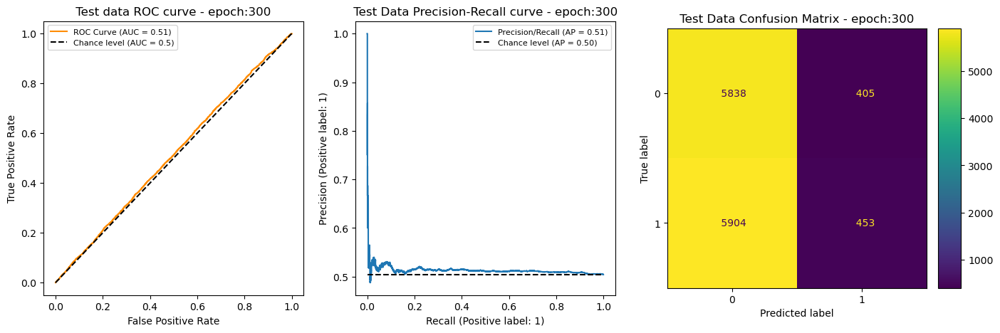

 Test  Acc : 49.89 % 	 roc_auc: 0.5115 	 Precision: 0.5251 	 Recall: 0.0708 	 F1: 0.1248

 Test Label counts:  True: [6243 6357] 	 Pred: [11743   857] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.50      0.93      0.65      6243
           1       0.53      0.07      0.12      6357

    accuracy                           0.50     12600
   macro avg       0.51      0.50      0.39     12600
weighted avg       0.51      0.50      0.38     12600



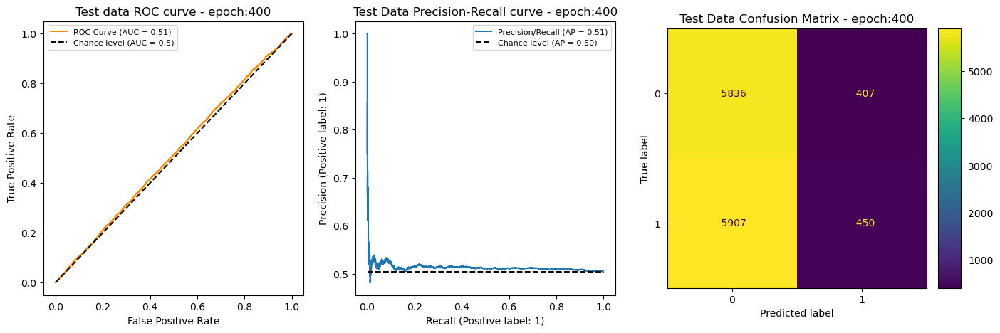

 Test  Acc : 49.87 % 	 roc_auc: 0.5115 	 Precision: 0.5240 	 Recall: 0.0705 	 F1: 0.1242

 Test Label counts:  True: [6243 6357] 	 Pred: [11745   855] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.50      0.93      0.65      6243
           1       0.52      0.07      0.12      6357

    accuracy                           0.50     12600
   macro avg       0.51      0.50      0.39     12600
weighted avg       0.51      0.50      0.38     12600



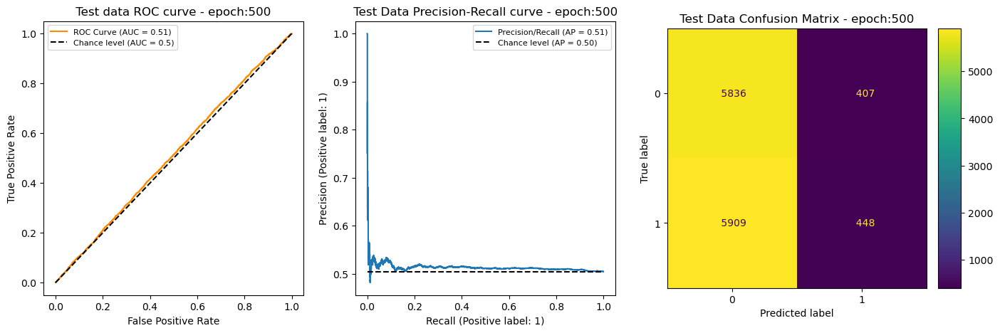

 Test  Acc : 49.87 % 	 roc_auc: 0.5115 	 Precision: 0.5240 	 Recall: 0.0705 	 F1: 0.1242

 Test Label counts:  True: [6243 6357] 	 Pred: [11745   855] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.50      0.93      0.65      6243
           1       0.52      0.07      0.12      6357

    accuracy                           0.50     12600
   macro avg       0.51      0.50      0.39     12600
weighted avg       0.51      0.50      0.38     12600



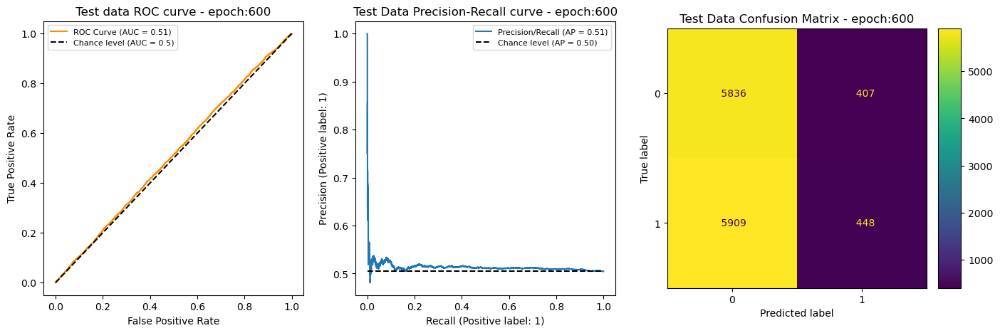

In [13]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for ep in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, ep, data_type)

### t2

 Test  Acc : 49.93 % 	 roc_auc: 0.5116 	 Precision: 0.5280 	 Recall: 0.0713 	 F1: 0.1256

 Test Label counts:  True: [6243 6357] 	 Pred: [11742   858] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.50      0.94      0.65      6243
           1       0.53      0.07      0.13      6357

    accuracy                           0.50     12600
   macro avg       0.51      0.50      0.39     12600
weighted avg       0.51      0.50      0.39     12600



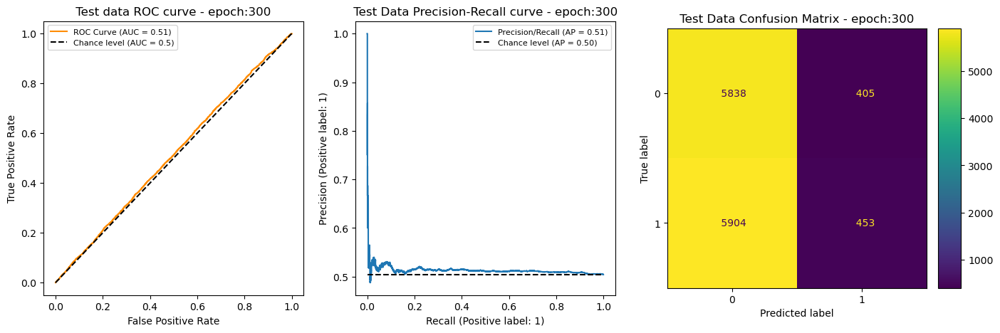

 Val   Acc : 47.46 % 	 roc_auc: 0.5259 	 Precision: 0.5711 	 Recall: 0.0738 	 F1: 0.1308

 Val Label counts:  True: [5856 6744] 	 Pred: [11728   872] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.47      0.94      0.62      5856
           1       0.57      0.07      0.13      6744

    accuracy                           0.47     12600
   macro avg       0.52      0.50      0.38     12600
weighted avg       0.52      0.47      0.36     12600



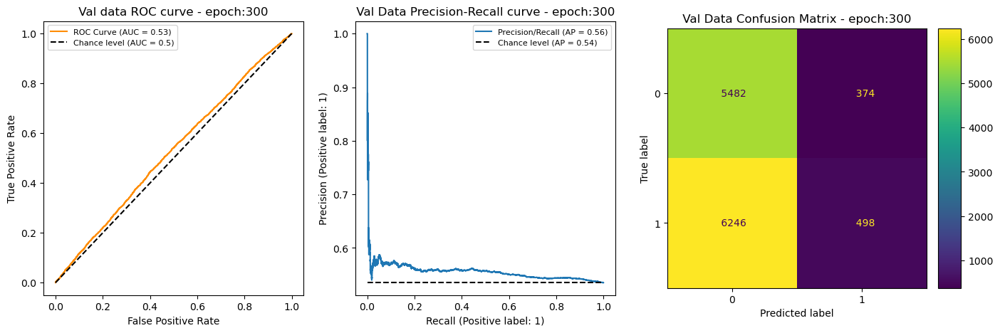

 Train Acc : 53.77 % 	 roc_auc: 0.6031 	 Precision: 0.9011 	 Recall: 0.1287 	 F1: 0.2253

 Train Label counts:  True: [6021 6579] 	 Pred: [11660   940] 

 Train Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.51      0.98      0.67      6021
           1       0.90      0.13      0.23      6579

    accuracy                           0.54     12600
   macro avg       0.70      0.56      0.45     12600
weighted avg       0.71      0.54      0.44     12600



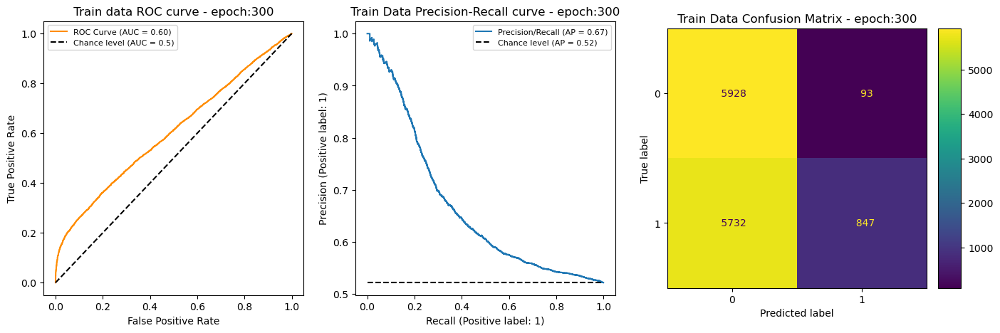

In [22]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

## SNNL (cpb 600, Latent 250, SNN Factor 3) ---->  (4 Layer BatchNorm 256/256/128)

In [17]:
AE_RUNMODE = 'snnl'
AE_DATETIME = "20240917_2004"    # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20240929_2015'
AE_LATENT_DIM = 250
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'batch_norm'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-03 22:24:03,088 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-03 22:24:03,089 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train.csv
2024-10-03 22:24:03,090 - utils.dataloader - INFO: -  type    :  train
2024-10-03 22:24:03,091 - utils.dataloader - INFO: -  start   :  21600
2024-10-03 22:24:03,091 - utils.dataloader - INFO: -  end     :  34200
2024-10-03 22:24:03,092 - utils.dataloader - INFO: -  numrows :  12600
2024-10-03 22:24:03,092 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-03 22:24:03,093 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-03 22:24:03,093 - utils.dataloader - INFO: -  sample_size :  3
2024-10-03 22:24:03,094 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-03 22:24:03,095 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_{ep}
./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_100
 Test  Acc : 88.42 % 	 roc_auc: 0.6305 	 Precision: 0.3409 	 Recall: 0.0210 	 F1: 0.0395

 Test Label counts:  True: [11169  1431] 	 Pred: [12512    88] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.34      0.02      0.04      1431

    accuracy                           0.88     12600
   macro avg       0.61      0.51      0.49     12600
weighted avg       0.83      0.88      0.84     12600



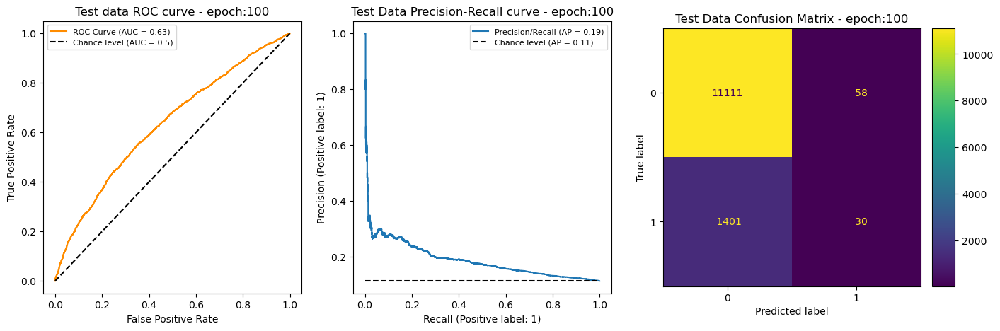

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_200
 Test  Acc : 88.44 % 	 roc_auc: 0.6249 	 Precision: 0.3673 	 Recall: 0.0252 	 F1: 0.0471

 Test Label counts:  True: [11169  1431] 	 Pred: [12502    98] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.37      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.63      0.51      0.49     12600
weighted avg       0.83      0.88      0.84     12600



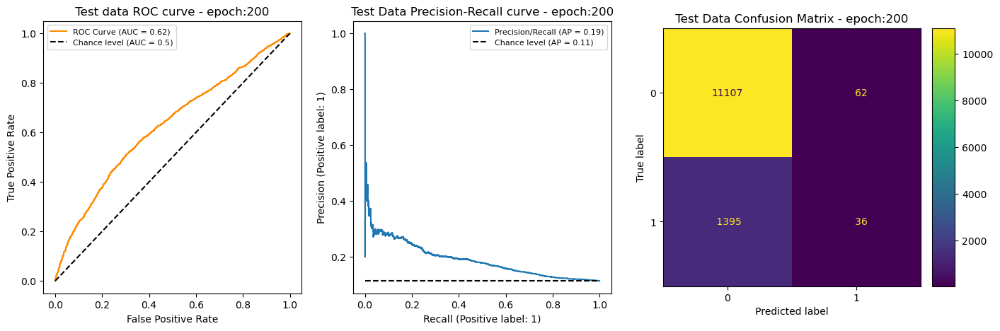

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_300
 Test  Acc : 88.38 % 	 roc_auc: 0.6207 	 Precision: 0.3429 	 Recall: 0.0252 	 F1: 0.0469

 Test Label counts:  True: [11169  1431] 	 Pred: [12495   105] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.34      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.62      0.51      0.49     12600
weighted avg       0.83      0.88      0.84     12600



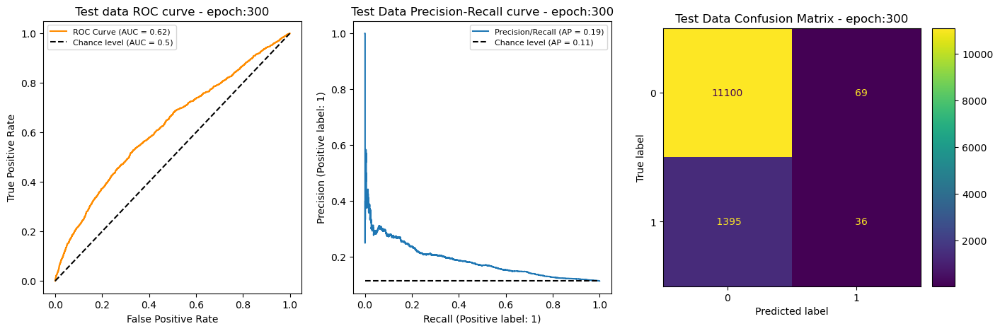

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_400
 Test  Acc : 88.38 % 	 roc_auc: 0.6208 	 Precision: 0.3429 	 Recall: 0.0252 	 F1: 0.0469

 Test Label counts:  True: [11169  1431] 	 Pred: [12495   105] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.34      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.62      0.51      0.49     12600
weighted avg       0.83      0.88      0.84     12600



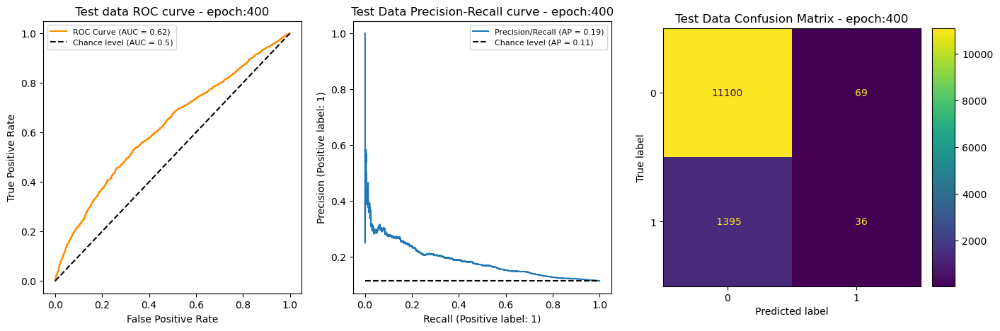

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_500
 Test  Acc : 88.38 % 	 roc_auc: 0.6208 	 Precision: 0.3429 	 Recall: 0.0252 	 F1: 0.0469

 Test Label counts:  True: [11169  1431] 	 Pred: [12495   105] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.34      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.62      0.51      0.49     12600
weighted avg       0.83      0.88      0.84     12600



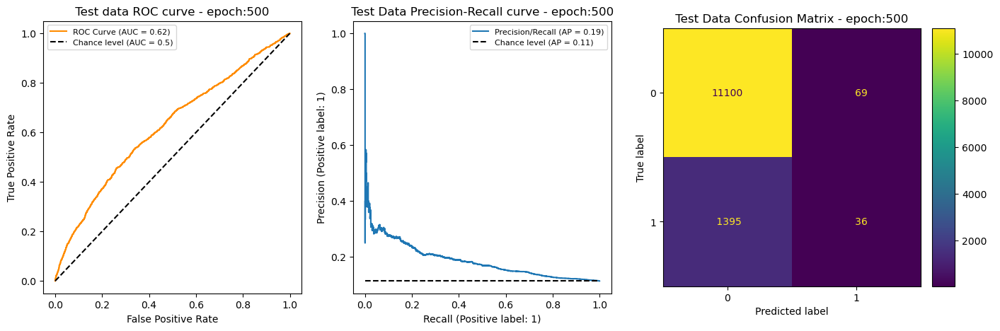

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_600
 Test  Acc : 88.38 % 	 roc_auc: 0.6208 	 Precision: 0.3429 	 Recall: 0.0252 	 F1: 0.0469

 Test Label counts:  True: [11169  1431] 	 Pred: [12495   105] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.34      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.62      0.51      0.49     12600
weighted avg       0.83      0.88      0.84     12600



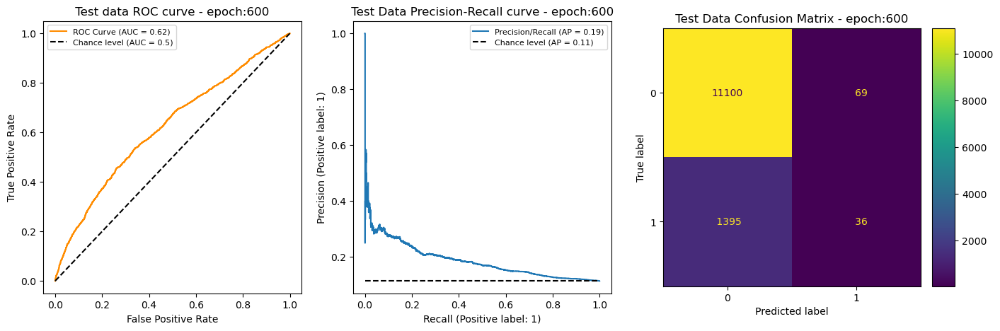

In [18]:
data_type = 'test'
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_300
 Test  Acc : 88.38 % 	 roc_auc: 0.6207 	 Precision: 0.3429 	 Recall: 0.0252 	 F1: 0.0469

 Test Label counts:  True: [11169  1431] 	 Pred: [12495   105] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.34      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.62      0.51      0.49     12600
weighted avg       0.83      0.88      0.84     12600



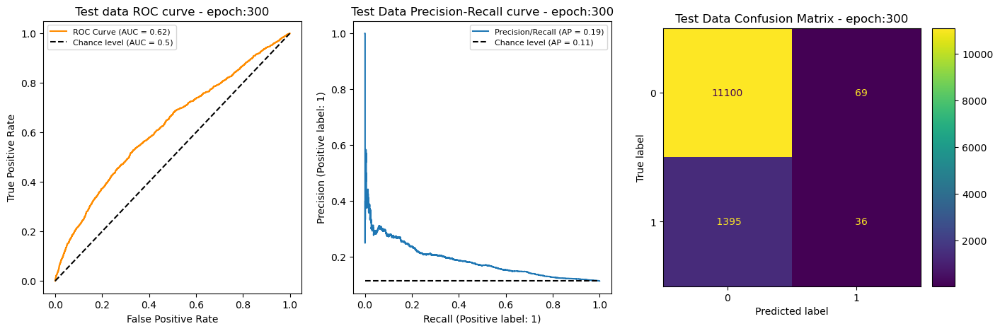

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_300
 Val   Acc : 88.39 % 	 roc_auc: 0.6223 	 Precision: 0.3153 	 Recall: 0.0246 	 F1: 0.0457

 Val Label counts:  True: [11178  1422] 	 Pred: [12489   111] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11178
           1       0.32      0.02      0.05      1422

    accuracy                           0.88     12600
   macro avg       0.60      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



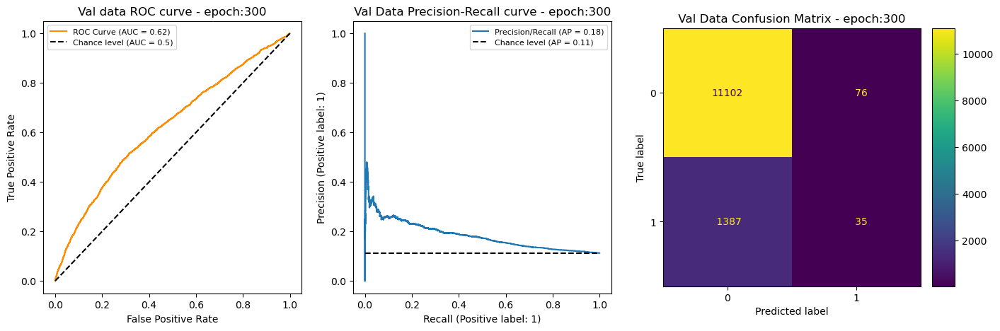

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240929_2015_ep_300
 Train Acc : 88.90 % 	 roc_auc: 0.7037 	 Precision: 0.8649 	 Recall: 0.0649 	 F1: 0.1208

 Train Label counts:  True: [11121  1479] 	 Pred: [12489   111] 

 Train Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11121
           1       0.86      0.06      0.12      1479

    accuracy                           0.89     12600
   macro avg       0.88      0.53      0.53     12600
weighted avg       0.89      0.89      0.84     12600



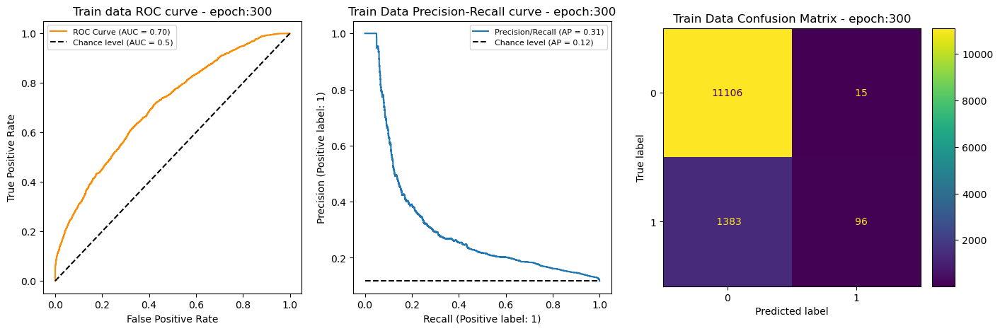

In [20]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

## SNNL (cpb 600, Latent 250, SNN Factor 30) ----> (4 Layer BatchNorm 256/256/128)

In [21]:
AE_RUNMODE = 'snnl'
AE_DATETIME = '20240924_0146'
RUN_DATETIME = '20240929_2030'
AE_LATENT_DIM = 250
input_num_cols = AE_LATENT_DIM + 11
TPSA_THRESHOLD = 100
MODEL_TYPE = 'batch_norm'

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH, tpsa_threshold = TPSA_THRESHOLD)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)
_ = summary(model, verbose = 2, input_size=(30, n_input), col_names = SUMMARY_COL_NAMES)

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

2024-10-01 18:22:36,322 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-01 18:22:36,323 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240924_0146_LAST_train.csv
2024-10-01 18:22:36,324 - utils.dataloader - INFO: -  type    :  train
2024-10-01 18:22:36,324 - utils.dataloader - INFO: -  start   :  21600
2024-10-01 18:22:36,325 - utils.dataloader - INFO: -  end     :  34200
2024-10-01 18:22:36,326 - utils.dataloader - INFO: -  numrows :  12600
2024-10-01 18:22:36,326 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-01 18:22:36,327 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-01 18:22:36,328 - utils.dataloader - INFO: -  sample_size :  3
2024-10-01 18:22:36,328 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-01 18:22:36,329 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240924_0146_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240924_0146_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240924_0146_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output Shape              Param #                   Param %                   Mult-Adds                 Trainable
Sequential                               [30, 250]                 [30, 1]                   -

### t0

 Test  Acc : 88.40 % 	 roc_auc: 0.6074 	 Precision: 0.2933 	 Recall: 0.0154 	 F1: 0.0292

 Test Label counts:  True: [11169  1431] 	 Pred: [12525    75] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.29      0.02      0.03      1431

    accuracy                           0.88     12600
   macro avg       0.59      0.51      0.48     12600
weighted avg       0.82      0.88      0.84     12600



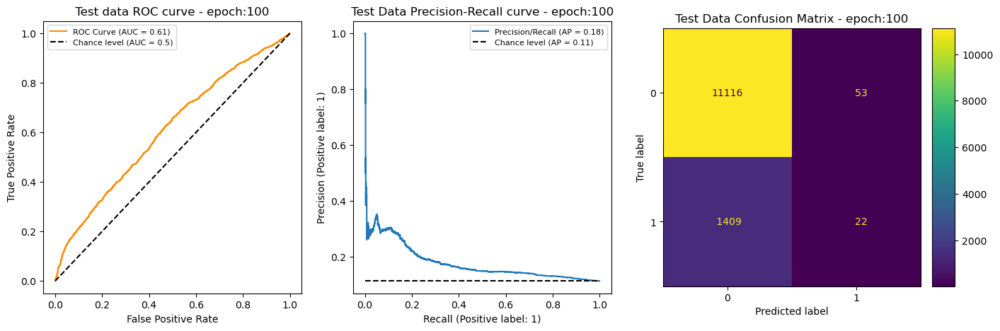

 Test  Acc : 88.41 % 	 roc_auc: 0.6009 	 Precision: 0.2698 	 Recall: 0.0119 	 F1: 0.0228

 Test Label counts:  True: [11169  1431] 	 Pred: [12537    63] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.27      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



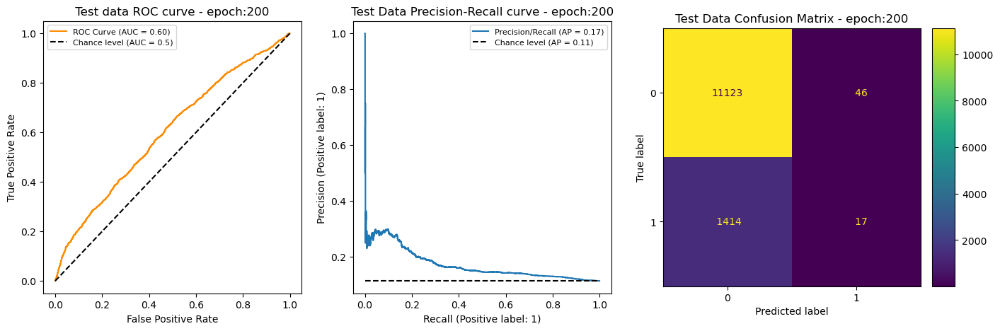

 Test  Acc : 88.40 % 	 roc_auc: 0.6028 	 Precision: 0.2687 	 Recall: 0.0126 	 F1: 0.0240

 Test Label counts:  True: [11169  1431] 	 Pred: [12533    67] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.27      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



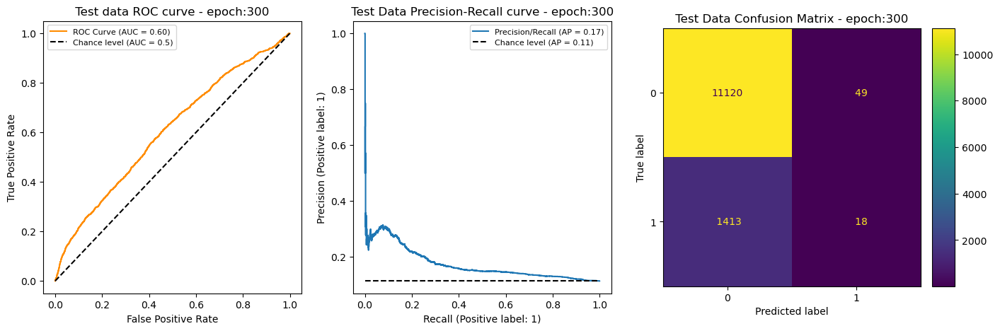

 Test  Acc : 88.40 % 	 roc_auc: 0.6028 	 Precision: 0.2687 	 Recall: 0.0126 	 F1: 0.0240

 Test Label counts:  True: [11169  1431] 	 Pred: [12533    67] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.27      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



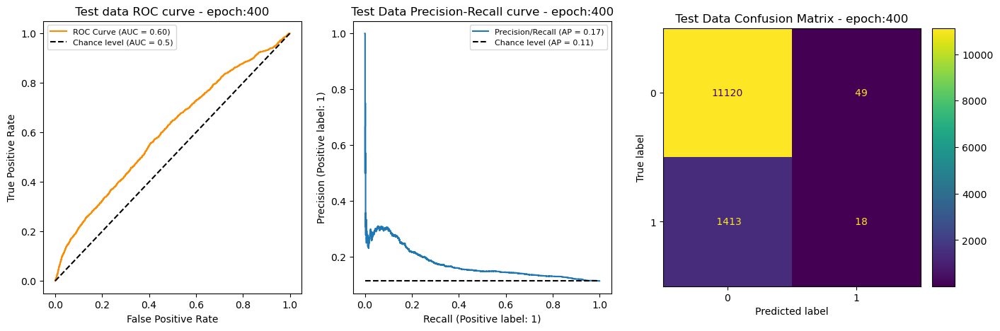

 Test  Acc : 88.40 % 	 roc_auc: 0.6028 	 Precision: 0.2687 	 Recall: 0.0126 	 F1: 0.0240

 Test Label counts:  True: [11169  1431] 	 Pred: [12533    67] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.27      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



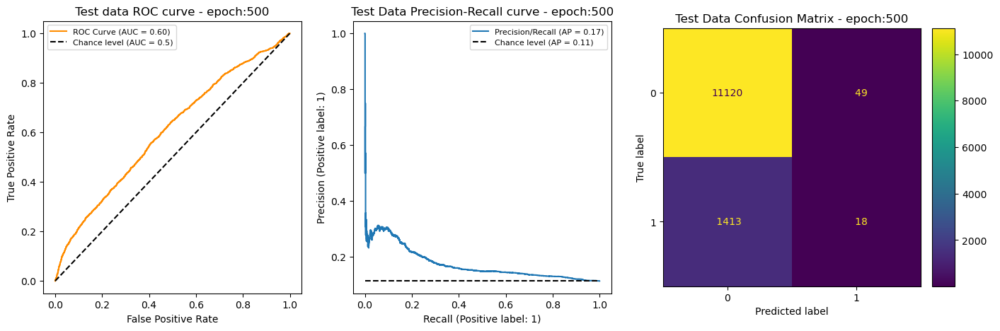

 Test  Acc : 88.39 % 	 roc_auc: 0.6028 	 Precision: 0.2647 	 Recall: 0.0126 	 F1: 0.0240

 Test Label counts:  True: [11169  1431] 	 Pred: [12532    68] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.26      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



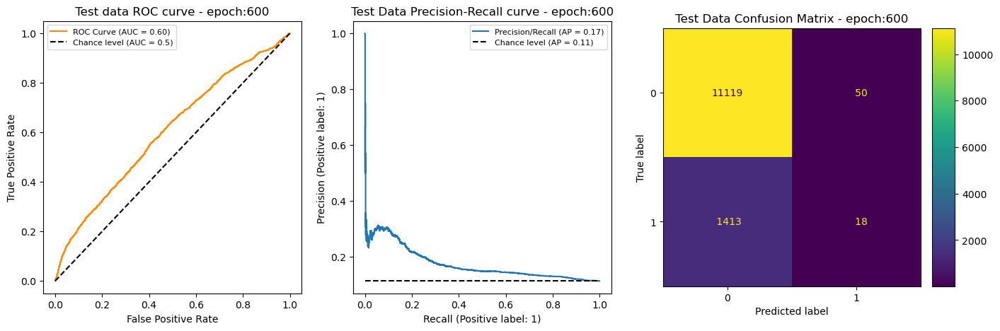

In [32]:
data_type = 'test'
for ep in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE_BASE, ep, 'test')

### t2

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240924_0146_LAST_20240929_2030_ep_600
 Test  Acc : 88.39 % 	 roc_auc: 0.6028 	 Precision: 0.2647 	 Recall: 0.0126 	 F1: 0.0240

 Test Label counts:  True: [11169  1431] 	 Pred: [12532    68] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11169
           1       0.26      0.01      0.02      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.50      0.48     12600
weighted avg       0.82      0.88      0.83     12600



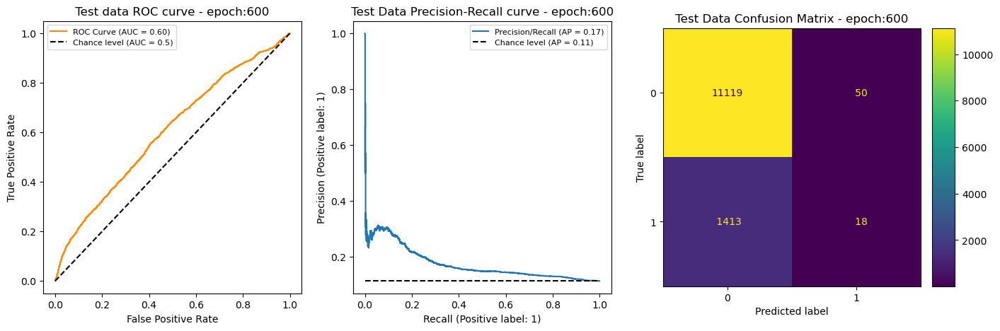

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240924_0146_LAST_20240929_2030_ep_600
 Val   Acc : 88.56 % 	 roc_auc: 0.6061 	 Precision: 0.3750 	 Recall: 0.0211 	 F1: 0.0399

 Val Label counts:  True: [11178  1422] 	 Pred: [12520    80] 

 Val Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11178
           1       0.38      0.02      0.04      1422

    accuracy                           0.89     12600
   macro avg       0.63      0.51      0.49     12600
weighted avg       0.83      0.89      0.84     12600



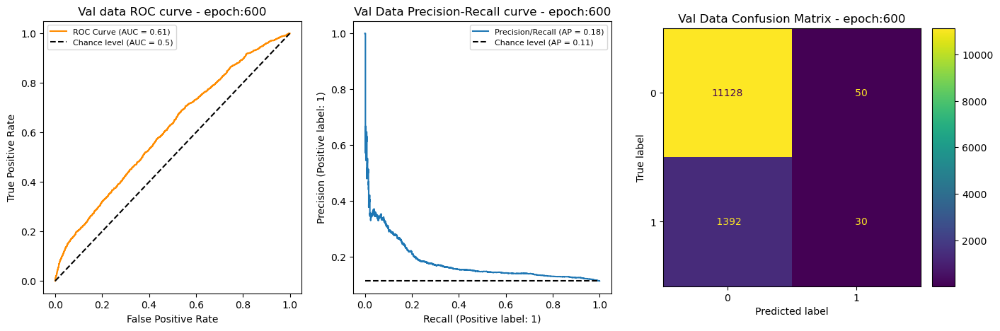

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240924_0146_LAST_20240929_2030_ep_600
 Train Acc : 88.68 % 	 roc_auc: 0.6639 	 Precision: 0.9077 	 Recall: 0.0399 	 F1: 0.0764

 Train Label counts:  True: [11121  1479] 	 Pred: [12535    65] 

 Train Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11121
           1       0.91      0.04      0.08      1479

    accuracy                           0.89     12600
   macro avg       0.90      0.52      0.51     12600
weighted avg       0.89      0.89      0.84     12600



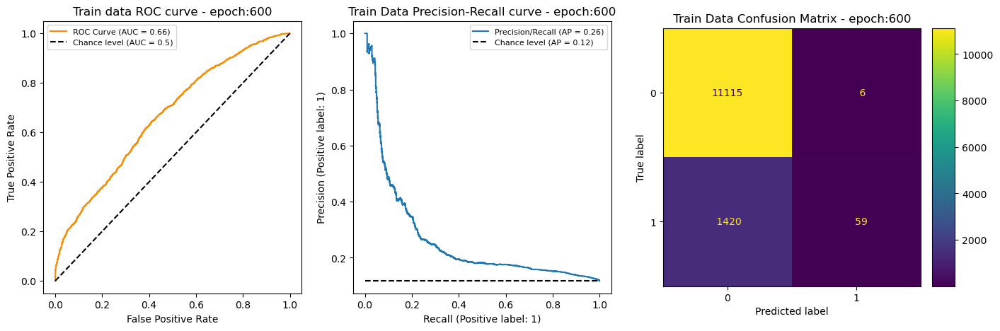

In [24]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

# 4 Layer Batch Norm 512/512/128

## Baseline (cpb 600, Latent 150) ---->  (4 Layer BatchNorm 512/512/128)

In [73]:
AE_RUNMODE = 'base'
AE_DATETIME = "20240923_1943"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "BEST"
AE_LATENT_DIM = 150
RUN_DATETIME = '20241002_2000'

input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS

MODEL_TYPE = 'batch_norm'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
 
n_hidden_1 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)

2024-10-11 19:01:08,967 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-11 19:01:08,967 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
2024-10-11 19:01:08,968 - utils.dataloader - INFO: -  type    :  train
2024-10-11 19:01:08,969 - utils.dataloader - INFO: -  start   :  21600
2024-10-11 19:01:08,970 - utils.dataloader - INFO: -  end     :  34200
2024-10-11 19:01:08,971 - utils.dataloader - INFO: -  numrows :  12600
2024-10-11 19:01:08,972 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-11 19:01:08,973 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-11 19:01:08,974 - utils.dataloader - INFO: -  sample_size :  3
2024-10-11 19:01:08,974 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-11 19:01:08,975 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_2000_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_2000_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_base_20240923_1943_BEST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_2000_ep_100
 Test  Acc : 83.44 % 	 roc_auc: 0.5391 	 Precision: 0.1349 	 Recall: 0.0846 	 F1: 0.1040

 Test Label counts:  True: [11169  1431] 	 Pred: [11703   897] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.93      0.91     11169
           1       0.13      0.08      0.10      1431

    accuracy                           0.83     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.80      0.83      0.82     12600



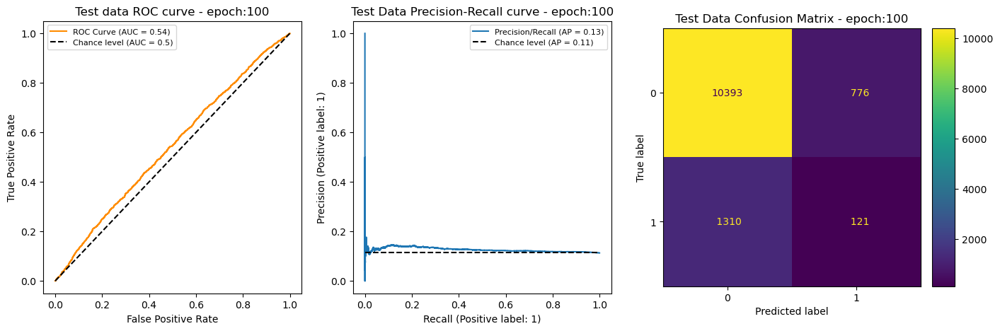

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_2000_ep_200
 Test  Acc : 83.29 % 	 roc_auc: 0.5338 	 Precision: 0.1445 	 Recall: 0.0957 	 F1: 0.1152

 Test Label counts:  True: [11169  1431] 	 Pred: [11652   948] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.93      0.91     11169
           1       0.14      0.10      0.12      1431

    accuracy                           0.83     12600
   macro avg       0.52      0.51      0.51     12600
weighted avg       0.80      0.83      0.82     12600



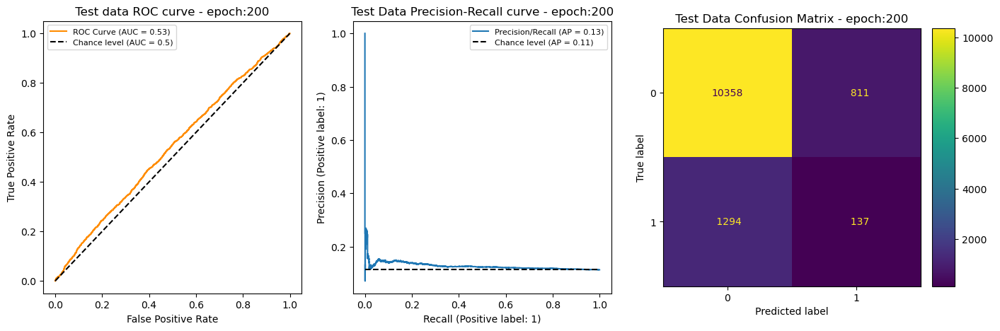

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_2000_ep_300
 Test  Acc : 82.52 % 	 roc_auc: 0.5337 	 Precision: 0.1317 	 Recall: 0.0964 	 F1: 0.1113

 Test Label counts:  True: [11169  1431] 	 Pred: [11552  1048] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.92      0.90     11169
           1       0.13      0.10      0.11      1431

    accuracy                           0.83     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.80      0.83      0.81     12600



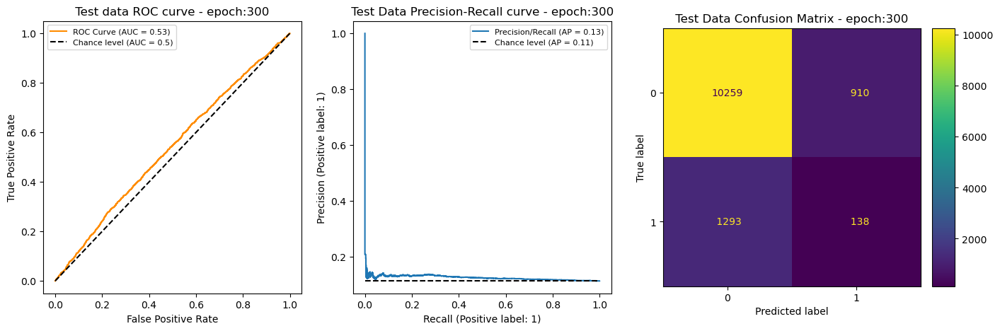

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_2000_ep_400
 Test  Acc : 82.10 % 	 roc_auc: 0.5342 	 Precision: 0.1233 	 Recall: 0.0943 	 F1: 0.1069

 Test Label counts:  True: [11169  1431] 	 Pred: [11505  1095] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.91      0.90     11169
           1       0.12      0.09      0.11      1431

    accuracy                           0.82     12600
   macro avg       0.51      0.50      0.50     12600
weighted avg       0.80      0.82      0.81     12600



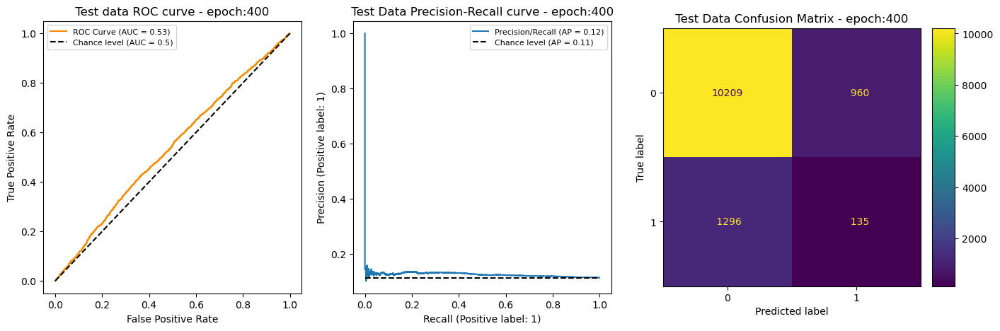

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_2000_ep_500
 Test  Acc : 82.31 % 	 roc_auc: 0.5335 	 Precision: 0.1214 	 Recall: 0.0894 	 F1: 0.1030

 Test Label counts:  True: [11169  1431] 	 Pred: [11546  1054] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.92      0.90     11169
           1       0.12      0.09      0.10      1431

    accuracy                           0.82     12600
   macro avg       0.50      0.50      0.50     12600
weighted avg       0.80      0.82      0.81     12600



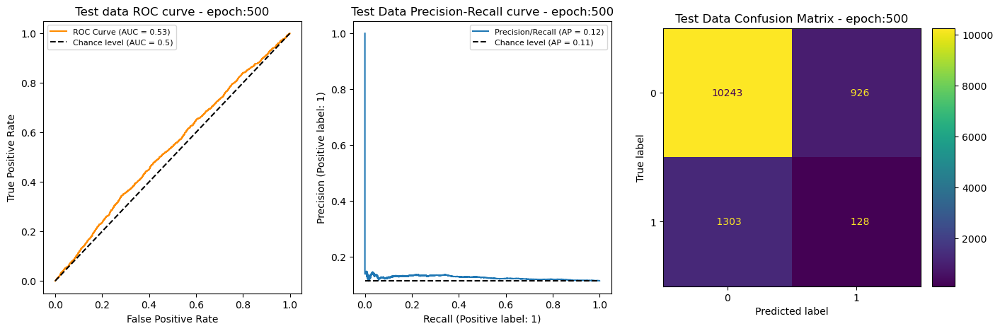

./saved_models/embedding_models/NN_base_embd600_150Ltnt_512_20240923_1943_BEST_20241002_2000_ep_600
 Test  Acc : 82.30 % 	 roc_auc: 0.5337 	 Precision: 0.1249 	 Recall: 0.0929 	 F1: 0.1066

 Test Label counts:  True: [11169  1431] 	 Pred: [11535  1065] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.92      0.90     11169
           1       0.12      0.09      0.11      1431

    accuracy                           0.82     12600
   macro avg       0.51      0.50      0.50     12600
weighted avg       0.80      0.82      0.81     12600



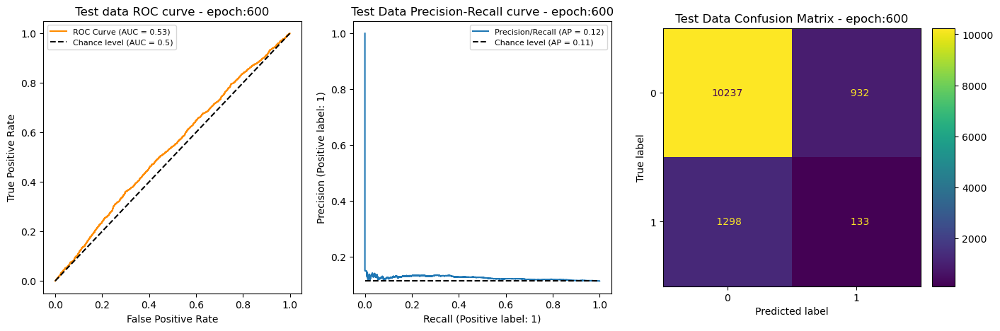

In [15]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

In [74]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 83.29 %    ROC Auc: 0.5338    PR Auc:0.1165    F1: 0.1152    Prec: 0.1445  Recall: 0.0957    
200 Val   Acc : 83.50 %    ROC Auc: 0.5555    PR Auc:0.1187    F1: 0.1341    Prec: 0.1645  Recall: 0.1132    
200 Train Acc : 98.67 %    ROC Auc: 0.9978    PR Auc:0.8973    F1: 0.9415    Prec: 0.9706  Recall: 0.9141    

300 Test  Acc : 82.52 %    ROC Auc: 0.5337    PR Auc:0.1153    F1: 0.1113    Prec: 0.1317  Recall: 0.0964    
300 Val   Acc : 83.37 %    ROC Auc: 0.5548    PR Auc:0.1197    F1: 0.1410    Prec: 0.1691  Recall: 0.1210    
300 Train Acc : 99.28 %    ROC Auc: 0.9989    PR Auc:0.9446    F1: 0.9686    Prec: 0.9894  Recall: 0.9486    



## SNNL (cpb 600, Latent 150, SNN Factor 3) ---->   (4 Layer BatchNorm 512/512/128)

In [75]:
AE_RUNMODE = 'snnl'
AE_DATETIME = "20240906_2201"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20240909_2130'
AE_LATENT_DIM = 150
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'batch_norm'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-11 19:01:57,734 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-11 19:01:57,734 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
2024-10-11 19:01:57,736 - utils.dataloader - INFO: -  type    :  train
2024-10-11 19:01:57,737 - utils.dataloader - INFO: -  start   :  21600
2024-10-11 19:01:57,737 - utils.dataloader - INFO: -  end     :  34200
2024-10-11 19:01:57,738 - utils.dataloader - INFO: -  numrows :  12600
2024-10-11 19:01:57,739 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-11 19:01:57,740 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-11 19:01:57,741 - utils.dataloader - INFO: -  sample_size :  3
2024-10-11 19:01:57,742 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-11 19:01:57,743 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2130_ep_{ep}
./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2130_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_161_HashOrder_snnl_20240906_2201_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2130_ep_100
 Test  Acc : 88.07 % 	 roc_auc: 0.6024 	 Precision: 0.2568 	 Recall: 0.0266 	 F1: 0.0481

 Test Label counts:  True: [11169  1431] 	 Pred: [12452   148] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.26      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



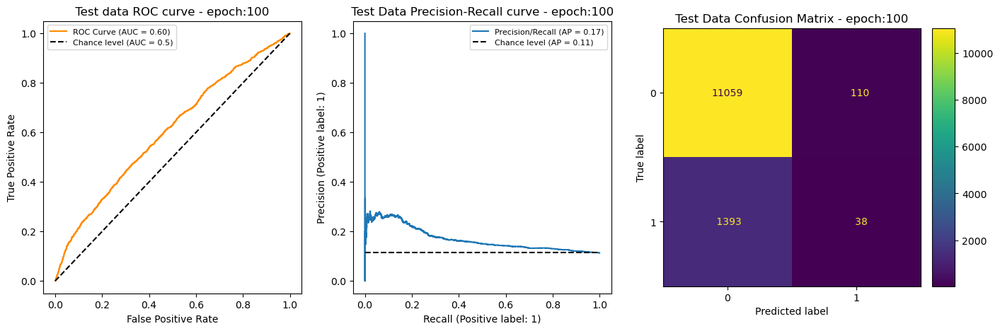

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2130_ep_200
 Test  Acc : 87.12 % 	 roc_auc: 0.5814 	 Precision: 0.2333 	 Recall: 0.0587 	 F1: 0.0938

 Test Label counts:  True: [11169  1431] 	 Pred: [12240   360] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.23      0.06      0.09      1431

    accuracy                           0.87     12600
   macro avg       0.56      0.52      0.51     12600
weighted avg       0.82      0.87      0.84     12600



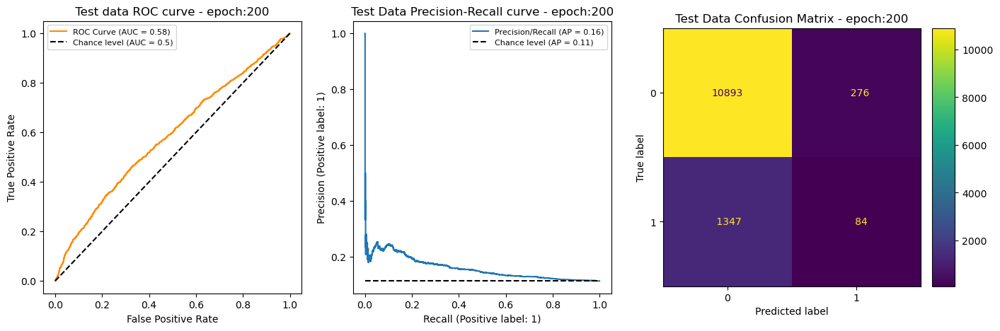

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2130_ep_300
 Test  Acc : 87.01 % 	 roc_auc: 0.5733 	 Precision: 0.1971 	 Recall: 0.0468 	 F1: 0.0757

 Test Label counts:  True: [11169  1431] 	 Pred: [12260   340] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.20      0.05      0.08      1431

    accuracy                           0.87     12600
   macro avg       0.54      0.51      0.50     12600
weighted avg       0.81      0.87      0.83     12600



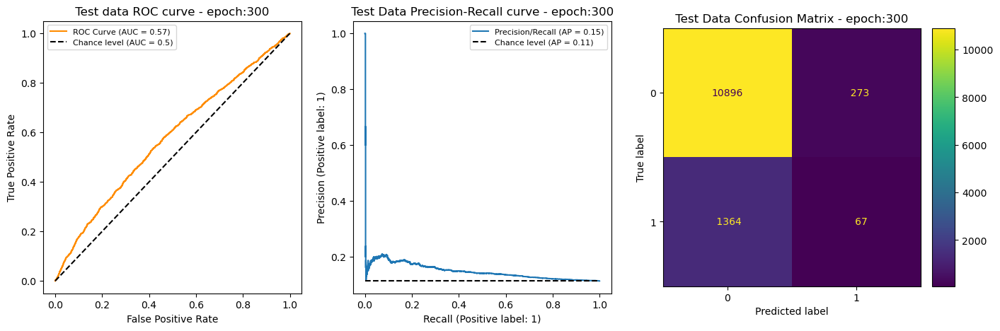

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2130_ep_400
 Test  Acc : 86.97 % 	 roc_auc: 0.5728 	 Precision: 0.1924 	 Recall: 0.0461 	 F1: 0.0744

 Test Label counts:  True: [11169  1431] 	 Pred: [12257   343] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.19      0.05      0.07      1431

    accuracy                           0.87     12600
   macro avg       0.54      0.51      0.50     12600
weighted avg       0.81      0.87      0.83     12600



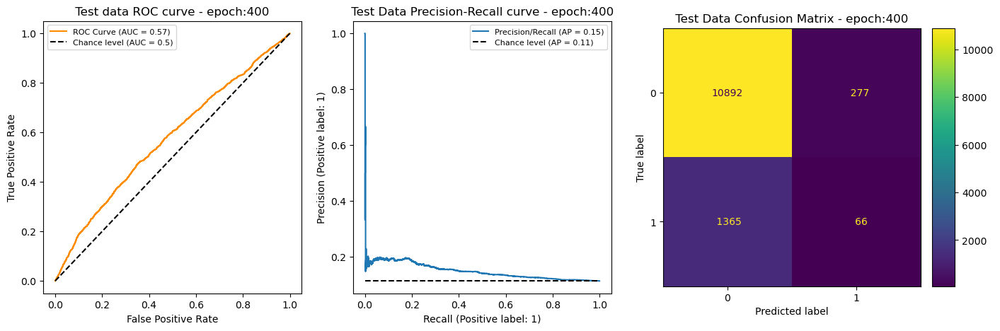

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2130_ep_500
 Test  Acc : 86.71 % 	 roc_auc: 0.5735 	 Precision: 0.1806 	 Recall: 0.0482 	 F1: 0.0761

 Test Label counts:  True: [11169  1431] 	 Pred: [12218   382] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.97      0.93     11169
           1       0.18      0.05      0.08      1431

    accuracy                           0.87     12600
   macro avg       0.53      0.51      0.50     12600
weighted avg       0.81      0.87      0.83     12600



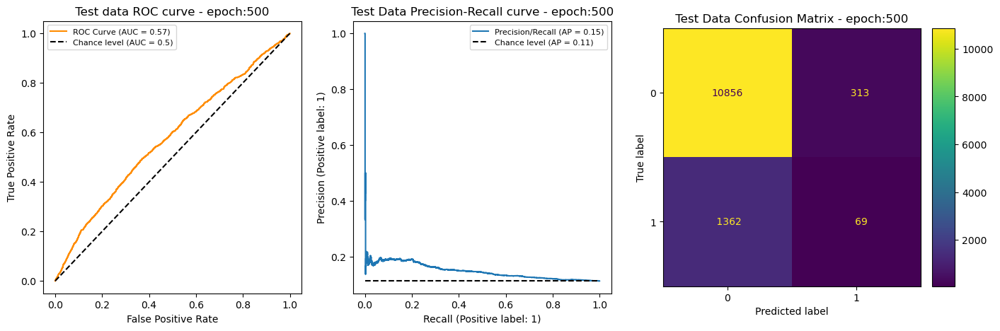

./saved_models/embedding_models/NN_snnl_embd600_150Ltnt_512_20240906_2201_LAST_20240909_2130_ep_600
 Test  Acc : 86.63 % 	 roc_auc: 0.5753 	 Precision: 0.1765 	 Recall: 0.0482 	 F1: 0.0757

 Test Label counts:  True: [11169  1431] 	 Pred: [12209   391] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.97      0.93     11169
           1       0.18      0.05      0.08      1431

    accuracy                           0.87     12600
   macro avg       0.53      0.51      0.50     12600
weighted avg       0.81      0.87      0.83     12600



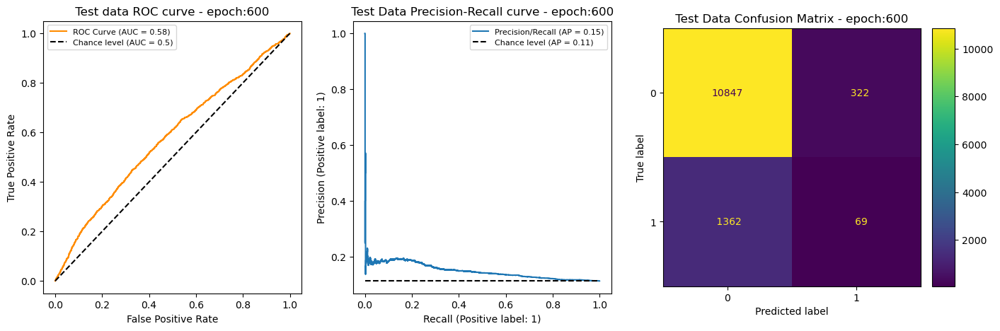

In [12]:
data_type = 'test'
for epoch in [100,200,300,400,500,600]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t1

In [76]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

200 Test  Acc : 87.12 %    ROC Auc: 0.5814    PR Auc:0.1206    F1: 0.0938    Prec: 0.2333  Recall: 0.0587    
200 Val   Acc : 86.85 %    ROC Auc: 0.5834    PR Auc:0.1153    F1: 0.0686    Prec: 0.1709  Recall: 0.0429    
200 Train Acc : 88.99 %    ROC Auc: 0.7362    PR Auc:0.1956    F1: 0.2466    Prec: 0.6271  Recall: 0.1535    

300 Test  Acc : 87.01 %    ROC Auc: 0.5733    PR Auc:0.1175    F1: 0.0757    Prec: 0.1971  Recall: 0.0468    
300 Val   Acc : 87.07 %    ROC Auc: 0.5696    PR Auc:0.1165    F1: 0.0739    Prec: 0.1929  Recall: 0.0457    
300 Train Acc : 89.21 %    ROC Auc: 0.7672    PR Auc:0.2070    F1: 0.2626    Prec: 0.6648  Recall: 0.1636    



## Baseline (cpb 600, Latent 250) ---->  (4 Layer BatchNorm 512/512/128)

In [33]:
AE_LATENT_DIM = 250
AE_RUNMODE = 'base'
AE_DATETIME = "20240917_2017"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20240930_1900'

input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS

MODEL_TYPE = 'batch_norm'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
 
n_hidden_1 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)

2024-10-03 22:42:38,006 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-03 22:42:38,007 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
2024-10-03 22:42:38,008 - utils.dataloader - INFO: -  type    :  train
2024-10-03 22:42:38,008 - utils.dataloader - INFO: -  start   :  21600
2024-10-03 22:42:38,009 - utils.dataloader - INFO: -  end     :  34200
2024-10-03 22:42:38,009 - utils.dataloader - INFO: -  numrows :  12600
2024-10-03 22:42:38,010 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-03 22:42:38,011 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-03 22:42:38,011 - utils.dataloader - INFO: -  sample_size :  3
2024-10-03 22:42:38,012 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-03 22:42:38,012 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

In [34]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for ep in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, ep, data_type)

TypeError: run_classification_inference() missing 2 required positional arguments: 'data_type' and 'device'

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_100
 Test  Acc : 80.37 % 	 roc_auc: 0.5466 	 Precision: 0.1416 	 Recall: 0.1440 	 F1: 0.1428

 Test Label counts:  True: [11169  1431] 	 Pred: [11145  1455] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.89      0.89     11169
           1       0.14      0.14      0.14      1431

    accuracy                           0.80     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.81      0.80      0.80     12600



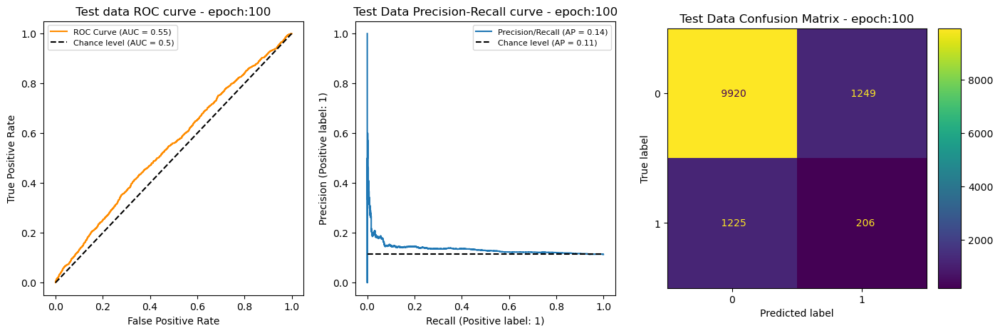

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_200
 Test  Acc : 82.04 % 	 roc_auc: 0.5510 	 Precision: 0.1438 	 Recall: 0.1174 	 F1: 0.1293

 Test Label counts:  True: [11169  1431] 	 Pred: [11432  1168] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.91      0.90     11169
           1       0.14      0.12      0.13      1431

    accuracy                           0.82     12600
   macro avg       0.52      0.51      0.51     12600
weighted avg       0.80      0.82      0.81     12600



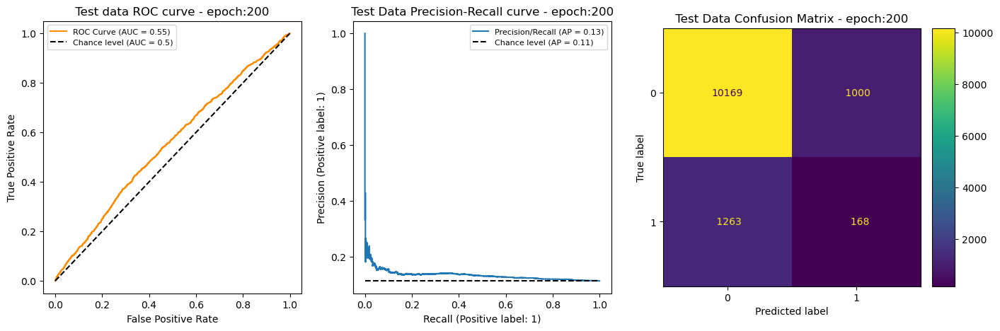

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_300
 Test  Acc : 82.11 % 	 roc_auc: 0.5528 	 Precision: 0.1437 	 Recall: 0.1160 	 F1: 0.1284

 Test Label counts:  True: [11169  1431] 	 Pred: [11445  1155] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.91      0.90     11169
           1       0.14      0.12      0.13      1431

    accuracy                           0.82     12600
   macro avg       0.52      0.51      0.51     12600
weighted avg       0.80      0.82      0.81     12600



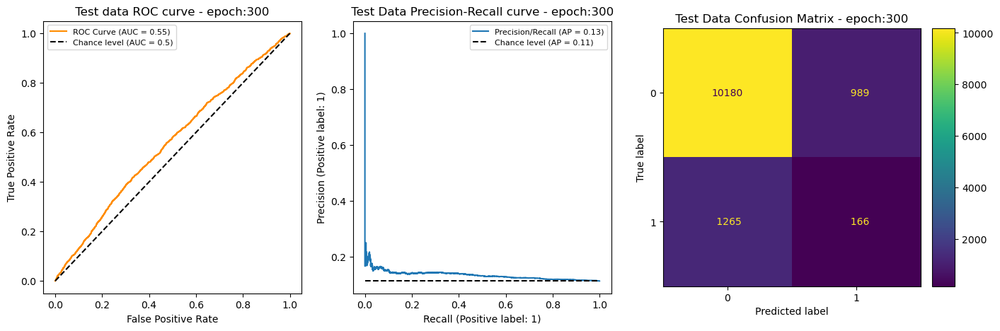

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_400
 Test  Acc : 82.86 % 	 roc_auc: 0.5518 	 Precision: 0.1512 	 Recall: 0.1104 	 F1: 0.1276

 Test Label counts:  True: [11169  1431] 	 Pred: [11555  1045] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.92      0.90     11169
           1       0.15      0.11      0.13      1431

    accuracy                           0.83     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.81      0.83      0.82     12600



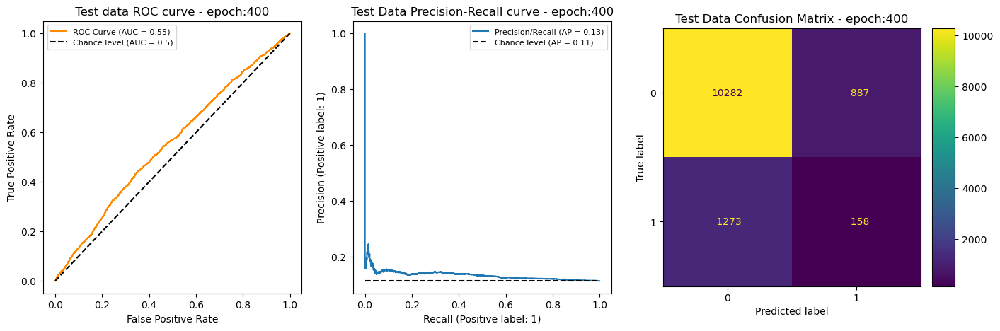

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_500
 Test  Acc : 82.71 % 	 roc_auc: 0.5509 	 Precision: 0.1524 	 Recall: 0.1146 	 F1: 0.1308

 Test Label counts:  True: [11169  1431] 	 Pred: [11524  1076] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.92      0.90     11169
           1       0.15      0.11      0.13      1431

    accuracy                           0.83     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.81      0.83      0.82     12600



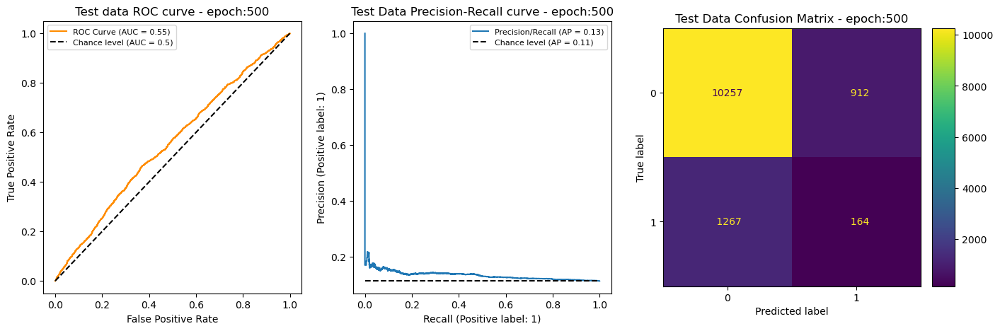

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_600
 Test  Acc : 82.56 % 	 roc_auc: 0.5503 	 Precision: 0.1498 	 Recall: 0.1146 	 F1: 0.1298

 Test Label counts:  True: [11169  1431] 	 Pred: [11505  1095] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.92      0.90     11169
           1       0.15      0.11      0.13      1431

    accuracy                           0.83     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.81      0.83      0.82     12600



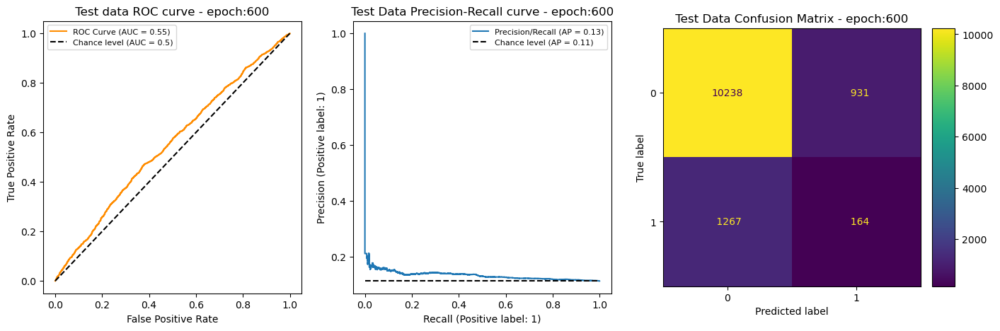

In [35]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_300
 Test  Acc : 82.11 % 	 roc_auc: 0.5528 	 Precision: 0.1437 	 Recall: 0.1160 	 F1: 0.1284

 Test Label counts:  True: [11169  1431] 	 Pred: [11445  1155] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.91      0.90     11169
           1       0.14      0.12      0.13      1431

    accuracy                           0.82     12600
   macro avg       0.52      0.51      0.51     12600
weighted avg       0.80      0.82      0.81     12600



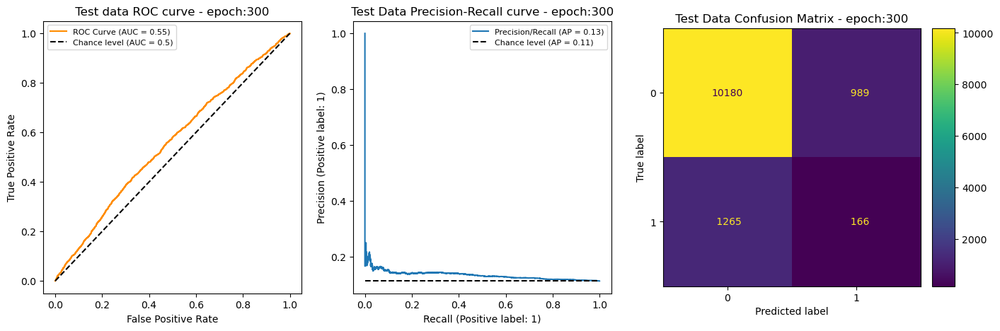

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_300
 Val   Acc : 82.32 % 	 roc_auc: 0.5574 	 Precision: 0.1608 	 Recall: 0.1343 	 F1: 0.1464

 Val Label counts:  True: [11178  1422] 	 Pred: [11412  1188] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.91      0.90     11178
           1       0.16      0.13      0.15      1422

    accuracy                           0.82     12600
   macro avg       0.53      0.52      0.52     12600
weighted avg       0.81      0.82      0.82     12600



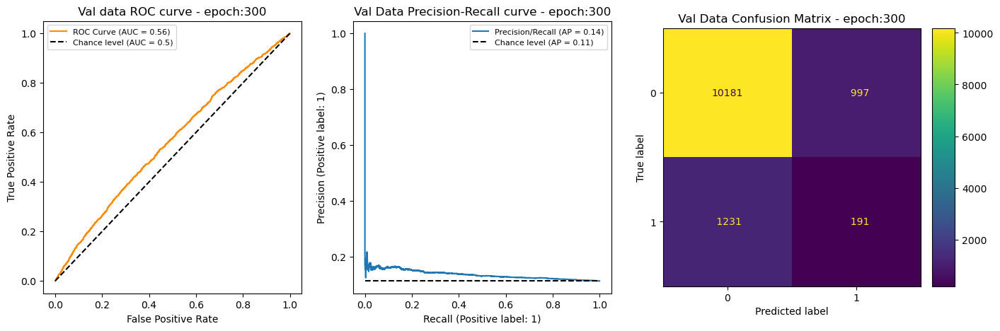

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_1900_ep_300
 Train Acc : 99.06 % 	 roc_auc: 0.9989 	 Precision: 0.9690 	 Recall: 0.9500 	 F1: 0.9594

 Train Label counts:  True: [11121  1479] 	 Pred: [11150  1450] 

 Train Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.99      1.00      0.99     11121
           1       0.97      0.95      0.96      1479

    accuracy                           0.99     12600
   macro avg       0.98      0.97      0.98     12600
weighted avg       0.99      0.99      0.99     12600



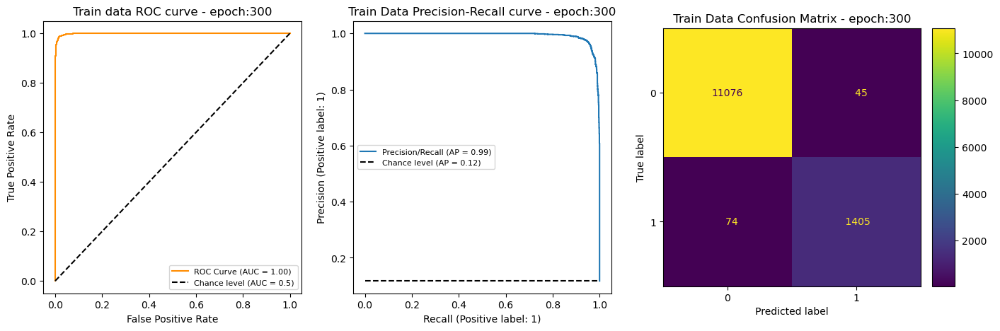

In [36]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

## SNNL (cpb 600, Latent 250, SNN Factor 3) ---->  (4 Layer BatchNorm 512/512/128)

 - Training dataset: **20240917_2004** (SNNL, CPB: 600, Latent: 250, SNNL FACTR 3.0), 
 
 - Classification Model: **20240930_1930** : Run on 4 FC layers model (includes final layer), with Batch Norm layers and Tanh non linearities

In [24]:
AE_RUNMODE = 'snnl'
AE_DATETIME = "20240917_2004"    # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20240930_1930'
AE_LATENT_DIM = 250
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
 
MODEL_TYPE = 'batch_norm'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-03 22:36:08,086 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-03 22:36:08,087 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train.csv
2024-10-03 22:36:08,088 - utils.dataloader - INFO: -  type    :  train
2024-10-03 22:36:08,088 - utils.dataloader - INFO: -  start   :  21600
2024-10-03 22:36:08,089 - utils.dataloader - INFO: -  end     :  34200
2024-10-03 22:36:08,089 - utils.dataloader - INFO: -  numrows :  12600
2024-10-03 22:36:08,090 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-03 22:36:08,091 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-03 22:36:08,091 - utils.dataloader - INFO: -  sample_size :  3
2024-10-03 22:36:08,092 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-03 22:36:08,092 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_{ep}
./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_snnl_20240917_2004_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 100
Layer (type:depth-idx)                   Input Shape               Output 

### t0

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_100
 Test  Acc : 87.90 % 	 roc_auc: 0.5715 	 Precision: 0.2500 	 Recall: 0.0328 	 F1: 0.0581

 Test Label counts:  True: [11169  1431] 	 Pred: [12412   188] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.25      0.03      0.06      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.50     12600
weighted avg       0.82      0.88      0.84     12600



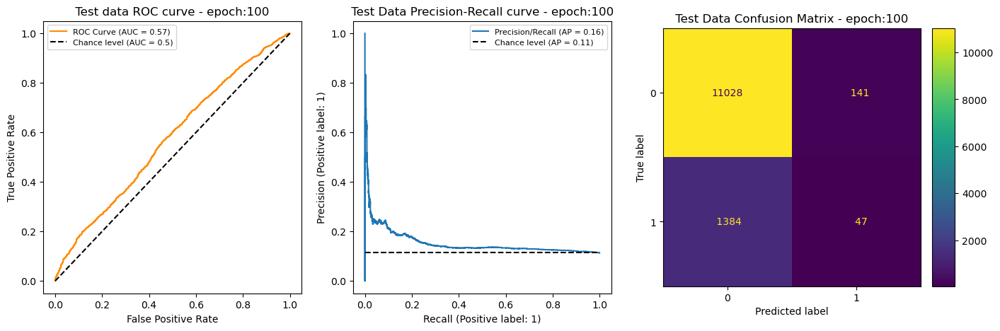

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_200
 Test  Acc : 88.11 % 	 roc_auc: 0.5804 	 Precision: 0.2781 	 Recall: 0.0294 	 F1: 0.0531

 Test Label counts:  True: [11169  1431] 	 Pred: [12449   151] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.28      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.58      0.51      0.49     12600
weighted avg       0.82      0.88      0.84     12600



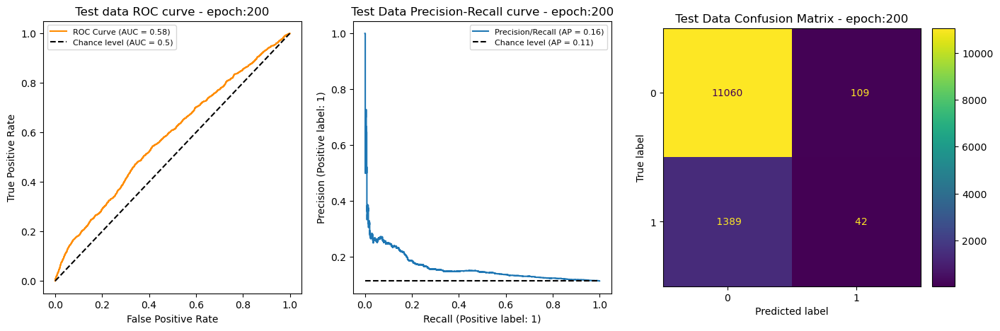

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_300
 Test  Acc : 88.01 % 	 roc_auc: 0.5736 	 Precision: 0.2403 	 Recall: 0.0259 	 F1: 0.0467

 Test Label counts:  True: [11169  1431] 	 Pred: [12446   154] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.24      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.56      0.51      0.49     12600
weighted avg       0.81      0.88      0.84     12600



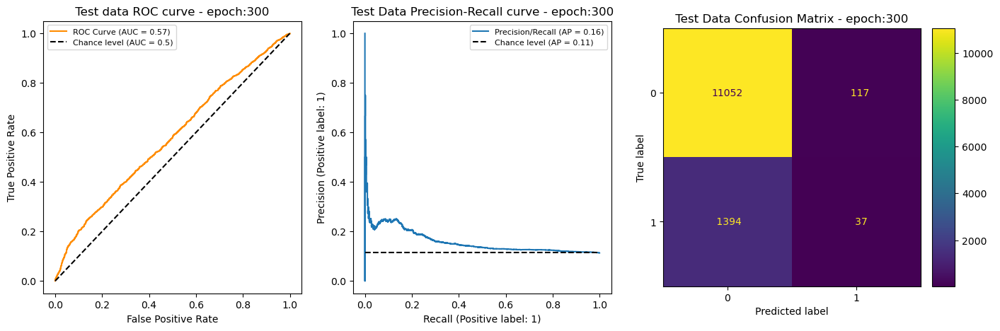

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_400
 Test  Acc : 87.43 % 	 roc_auc: 0.5825 	 Precision: 0.2198 	 Recall: 0.0419 	 F1: 0.0704

 Test Label counts:  True: [11169  1431] 	 Pred: [12327   273] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.22      0.04      0.07      1431

    accuracy                           0.87     12600
   macro avg       0.55      0.51      0.50     12600
weighted avg       0.81      0.87      0.83     12600



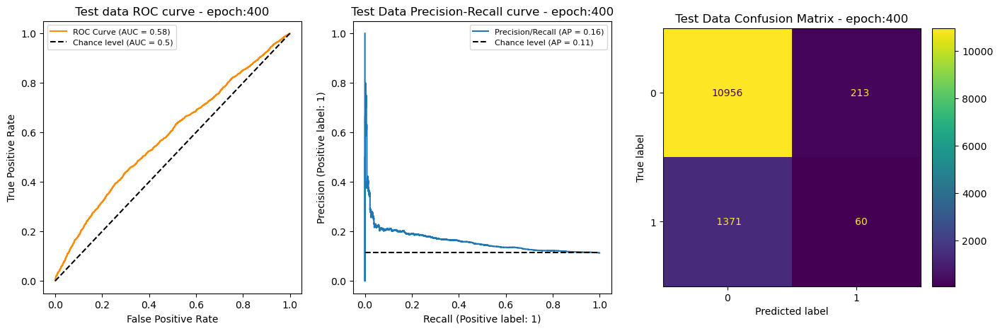

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_500
 Test  Acc : 87.61 % 	 roc_auc: 0.5857 	 Precision: 0.2481 	 Recall: 0.0447 	 F1: 0.0758

 Test Label counts:  True: [11169  1431] 	 Pred: [12342   258] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.25      0.04      0.08      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.50     12600
weighted avg       0.82      0.88      0.84     12600



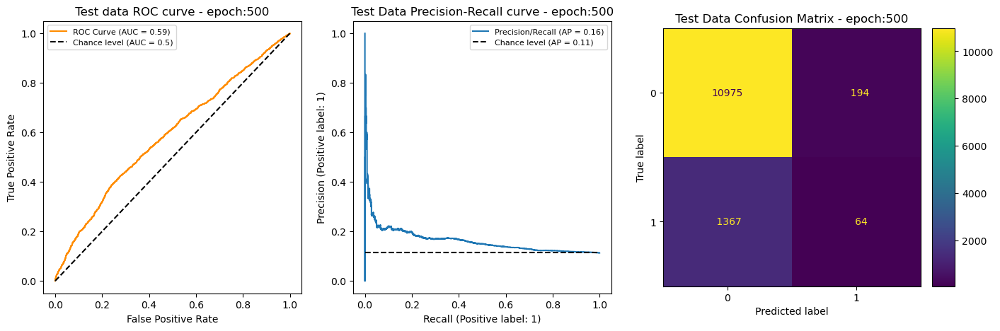

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_600
 Test  Acc : 87.62 % 	 roc_auc: 0.5823 	 Precision: 0.2471 	 Recall: 0.0440 	 F1: 0.0747

 Test Label counts:  True: [11169  1431] 	 Pred: [12345   255] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     11169
           1       0.25      0.04      0.07      1431

    accuracy                           0.88     12600
   macro avg       0.57      0.51      0.50     12600
weighted avg       0.82      0.88      0.84     12600



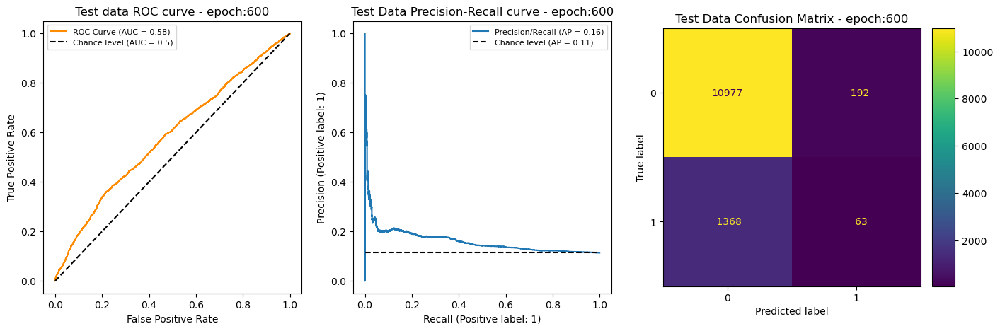

In [25]:
data_type = 'test'
for epoch in [100,200,300,400,500,600,]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_300
 Test  Acc : 88.01 % 	 roc_auc: 0.5736 	 Precision: 0.2403 	 Recall: 0.0259 	 F1: 0.0467

 Test Label counts:  True: [11169  1431] 	 Pred: [12446   154] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11169
           1       0.24      0.03      0.05      1431

    accuracy                           0.88     12600
   macro avg       0.56      0.51      0.49     12600
weighted avg       0.81      0.88      0.84     12600



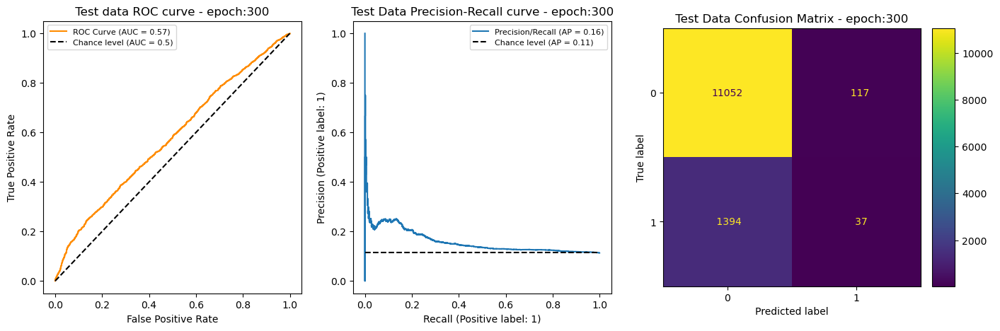

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_300
 Val   Acc : 88.22 % 	 roc_auc: 0.5896 	 Precision: 0.3063 	 Recall: 0.0345 	 F1: 0.0619

 Val Label counts:  True: [11178  1422] 	 Pred: [12440   160] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      0.99      0.94     11178
           1       0.31      0.03      0.06      1422

    accuracy                           0.88     12600
   macro avg       0.60      0.51      0.50     12600
weighted avg       0.82      0.88      0.84     12600



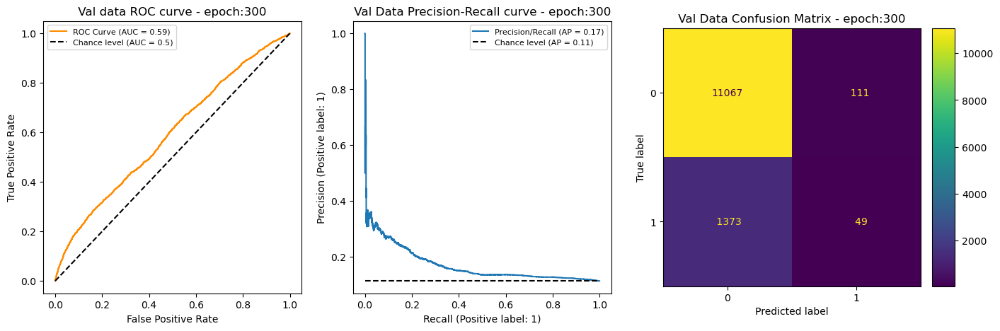

./saved_models/embedding_models/NN_snnl_embd600_250Ltnt_512_20240917_2004_LAST_20240930_1930_ep_300
 Train Acc : 88.88 % 	 roc_auc: 0.6585 	 Precision: 0.7349 	 Recall: 0.0825 	 F1: 0.1483

 Train Label counts:  True: [11121  1479] 	 Pred: [12434   166] 

 Train Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.89      1.00      0.94     11121
           1       0.73      0.08      0.15      1479

    accuracy                           0.89     12600
   macro avg       0.81      0.54      0.54     12600
weighted avg       0.87      0.89      0.85     12600



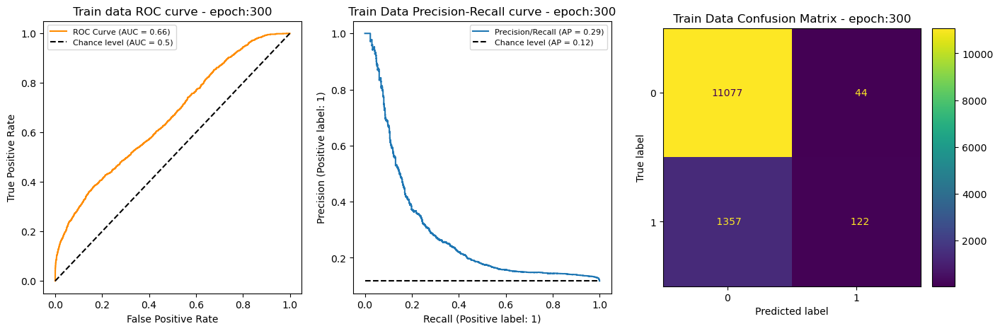

In [27]:
for epoch in [200,300]:
    plot = False
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE, plot = plot)
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE, plot = plot)
    print()

# Balanced Data 

## Baseline (cpb 600, Latent 250) ---->  (Single 512 layer NN) -- Balanced Data

 - Training dataset: **20240917_2017** (BASELINE CPB: 600, Latent: 150) 
 
 - Model checkpoint: **20241003_2330** : Run on single layer model 256

In [25]:
AE_LATENT_DIM = 250
AE_RUNMODE = 'base'
AE_DATETIME = "20240917_2017"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20241003_2330'
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
TPSA_THRESHOLD = 70

MODEL_TYPE = 'single_layer'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH, tpsa_threshold = TPSA_THRESHOLD )
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-04 16:03:16,508 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-04 16:03:16,509 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
2024-10-04 16:03:16,510 - utils.dataloader - INFO: -  type    :  train
2024-10-04 16:03:16,511 - utils.dataloader - INFO: -  start   :  21600
2024-10-04 16:03:16,511 - utils.dataloader - INFO: -  end     :  34200
2024-10-04 16:03:16,512 - utils.dataloader - INFO: -  numrows :  12600
2024-10-04 16:03:16,513 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-04 16:03:16,513 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-04 16:03:16,514 - utils.dataloader - INFO: -  sample_size :  3
2024-10-04 16:03:16,515 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-04 16:03:16,515 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
Layer (type:depth-idx)                   Input Shape               Output Sha

### t0

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_100
 Val   Acc : 51.56 % 	 roc_auc: 0.5361 	 Precision: 0.5587 	 Recall: 0.4514 	 F1: 0.4993

 Val Label counts:  True: [5856 6744] 	 Pred: [7152 5448] 

 Val Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.48      0.59      0.53      5856
           1       0.56      0.45      0.50      6744

    accuracy                           0.52     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.52      0.51     12600



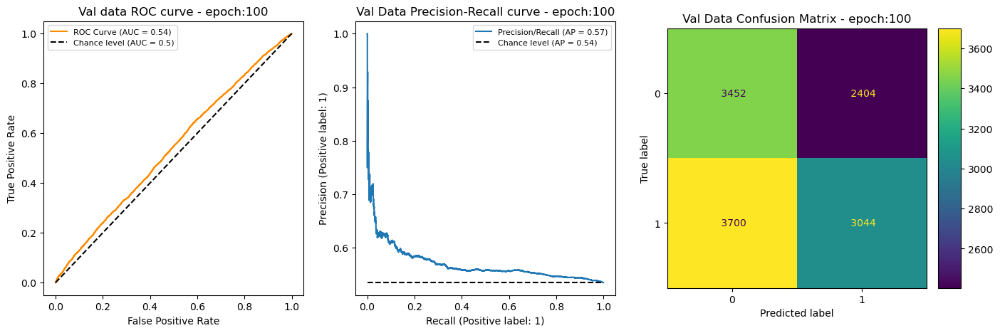

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_200
 Val   Acc : 52.92 % 	 roc_auc: 0.5368 	 Precision: 0.5557 	 Recall: 0.6008 	 F1: 0.5774

 Val Label counts:  True: [5856 6744] 	 Pred: [5308 7292] 

 Val Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.49      0.45      0.47      5856
           1       0.56      0.60      0.58      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



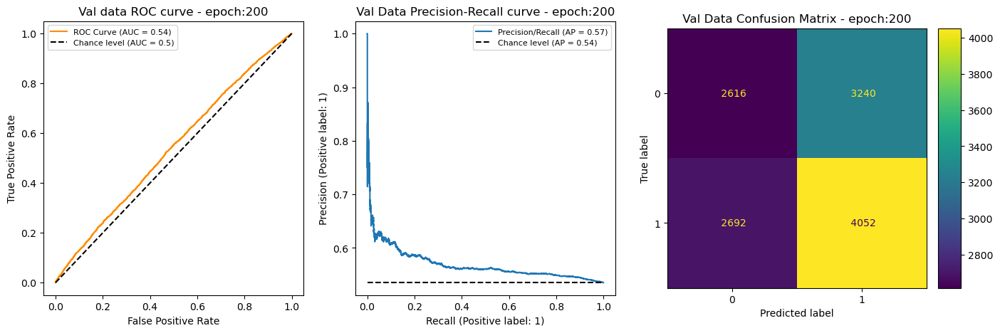

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_300
 Val   Acc : 52.74 % 	 roc_auc: 0.5367 	 Precision: 0.5594 	 Recall: 0.5512 	 F1: 0.5552

 Val Label counts:  True: [5856 6744] 	 Pred: [5955 6645] 

 Val Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.49      0.50      0.50      5856
           1       0.56      0.55      0.56      6744

    accuracy                           0.53     12600
   macro avg       0.53      0.53      0.53     12600
weighted avg       0.53      0.53      0.53     12600



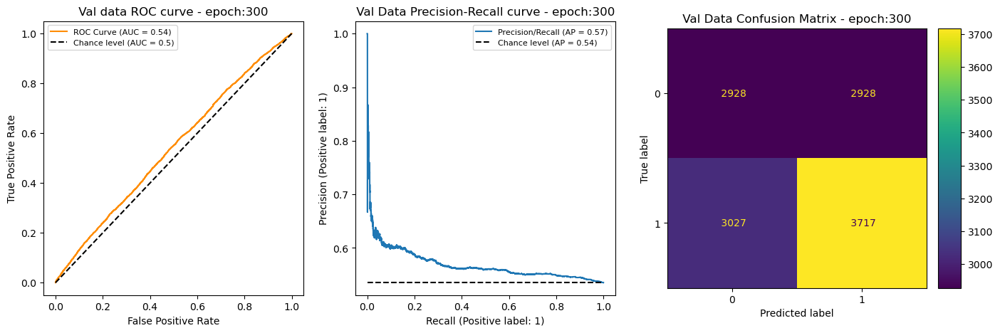

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_400
 Val   Acc : 52.83 % 	 roc_auc: 0.5364 	 Precision: 0.5571 	 Recall: 0.5795 	 F1: 0.5681

 Val Label counts:  True: [5856 6744] 	 Pred: [5585 7015] 

 Val Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



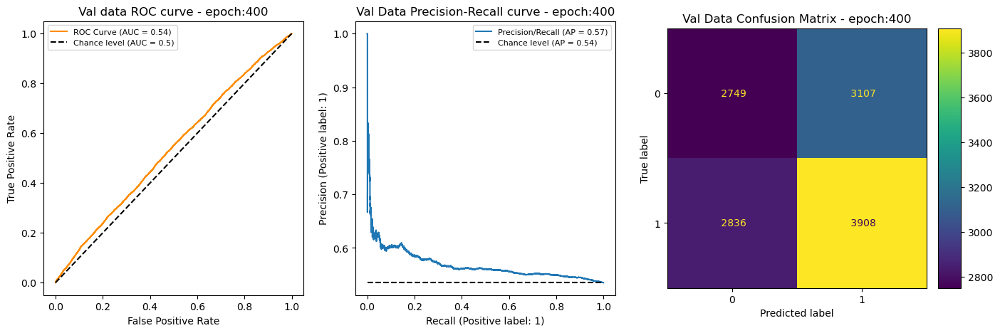

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_500
 Val   Acc : 52.87 % 	 roc_auc: 0.5362 	 Precision: 0.5574 	 Recall: 0.5805 	 F1: 0.5687

 Val Label counts:  True: [5856 6744] 	 Pred: [5576 7024] 

 Val Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.53      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



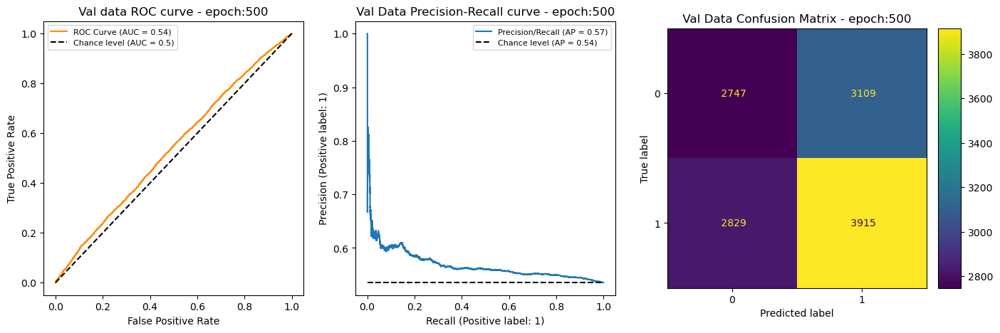

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_600
 Val   Acc : 52.90 % 	 roc_auc: 0.5362 	 Precision: 0.5575 	 Recall: 0.5816 	 F1: 0.5693

 Val Label counts:  True: [5856 6744] 	 Pred: [5565 7035] 

 Val Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.53      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



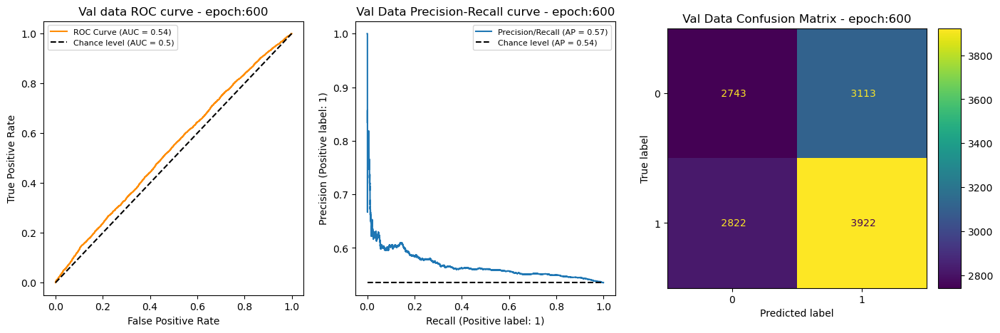

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_700
 Val   Acc : 52.90 % 	 roc_auc: 0.5362 	 Precision: 0.5575 	 Recall: 0.5823 	 F1: 0.5696

 Val Label counts:  True: [5856 6744] 	 Pred: [5556 7044] 

 Val Data Classification Report: - epoch:700 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.53      0.53      0.52     12600
weighted avg       0.53      0.53      0.53     12600



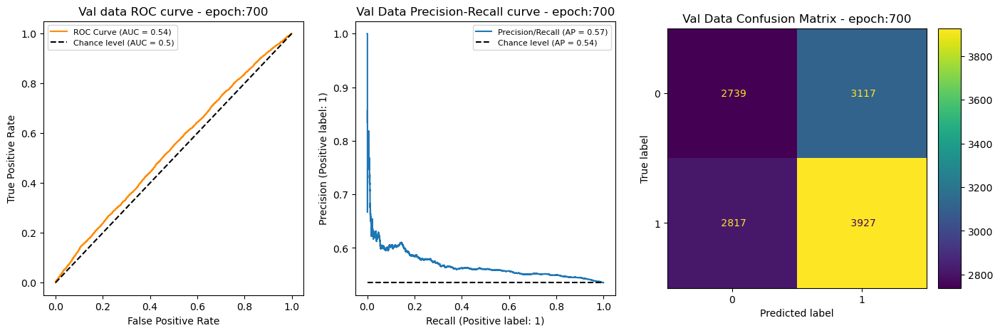

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_800
 Val   Acc : 52.90 % 	 roc_auc: 0.5362 	 Precision: 0.5575 	 Recall: 0.5824 	 F1: 0.5697

 Val Label counts:  True: [5856 6744] 	 Pred: [5554 7046] 

 Val Data Classification Report: - epoch:800 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.53      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



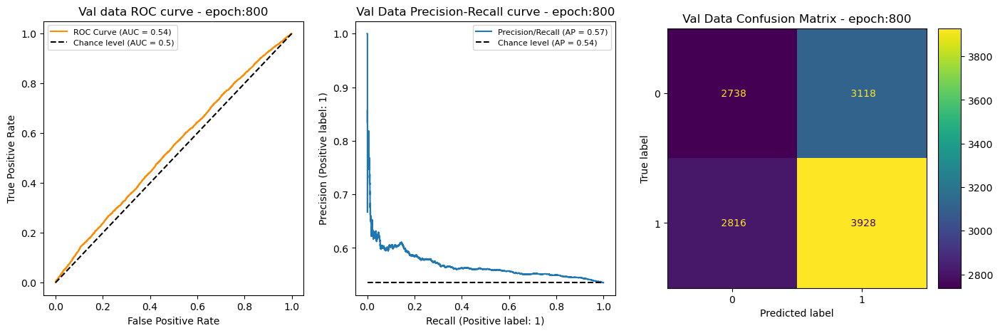

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_900
 Val   Acc : 52.90 % 	 roc_auc: 0.5362 	 Precision: 0.5575 	 Recall: 0.5824 	 F1: 0.5697

 Val Label counts:  True: [5856 6744] 	 Pred: [5554 7046] 

 Val Data Classification Report: - epoch:900 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.53      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



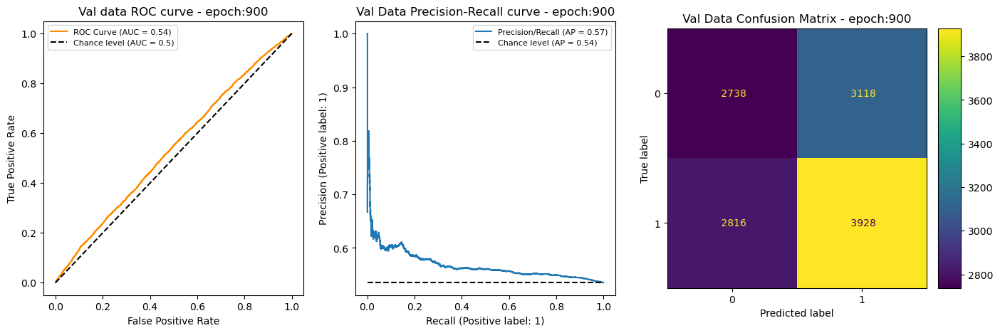

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_1000
 Val   Acc : 52.90 % 	 roc_auc: 0.5362 	 Precision: 0.5575 	 Recall: 0.5824 	 F1: 0.5697

 Val Label counts:  True: [5856 6744] 	 Pred: [5554 7046] 

 Val Data Classification Report: - epoch:1000 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.53      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



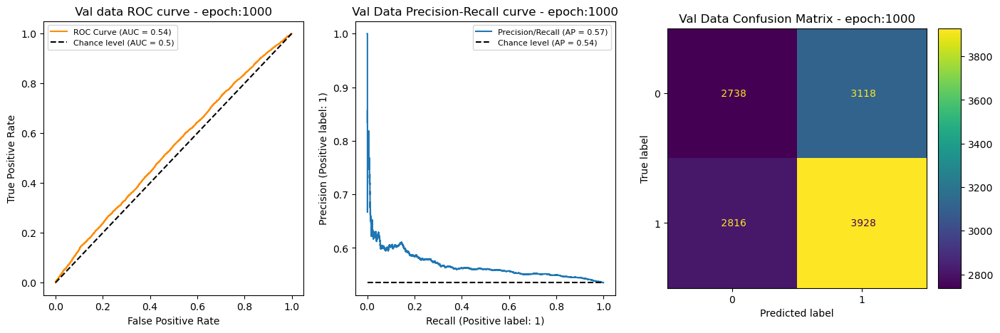

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_1100
 Val   Acc : 52.87 % 	 roc_auc: 0.5362 	 Precision: 0.5572 	 Recall: 0.5819 	 F1: 0.5693

 Val Label counts:  True: [5856 6744] 	 Pred: [5558 7042] 

 Val Data Classification Report: - epoch:1100 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



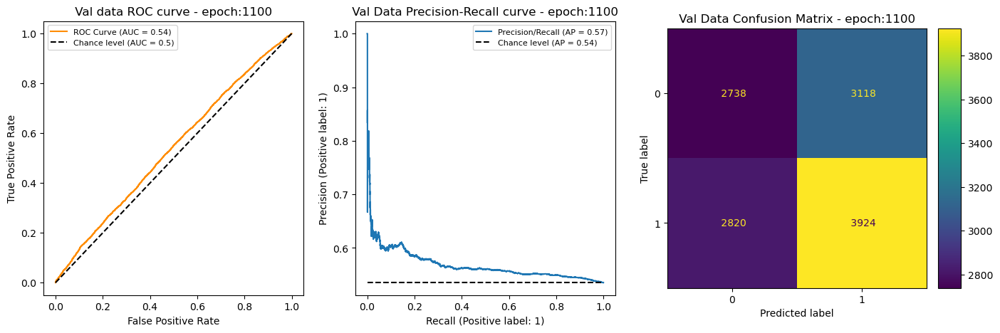

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_1200
 Val   Acc : 52.87 % 	 roc_auc: 0.5362 	 Precision: 0.5572 	 Recall: 0.5817 	 F1: 0.5692

 Val Label counts:  True: [5856 6744] 	 Pred: [5560 7040] 

 Val Data Classification Report: - epoch:1200 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



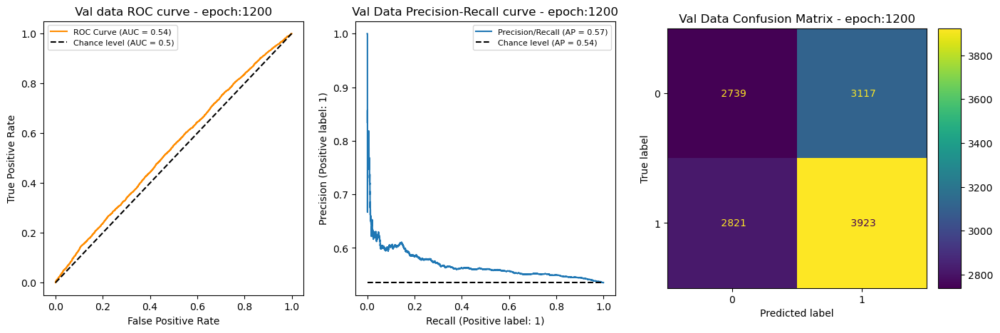

In [16]:
data_type = 'val'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,700, 800,900,1000,1100,1200]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_600
 Test  Acc : 52.13 % 	 roc_auc: 0.5344 	 Precision: 0.5231 	 Recall: 0.5798 	 F1: 0.5500

 Test Label counts:  True: [6243 6357] 	 Pred: [5554 7046] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.52      0.46      0.49      6243
           1       0.52      0.58      0.55      6357

    accuracy                           0.52     12600
   macro avg       0.52      0.52      0.52     12600
weighted avg       0.52      0.52      0.52     12600



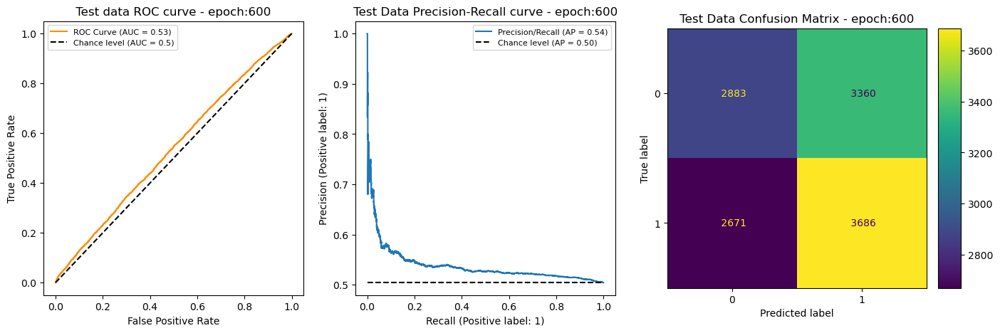

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_600
 Val   Acc : 52.90 % 	 roc_auc: 0.5362 	 Precision: 0.5575 	 Recall: 0.5816 	 F1: 0.5693

 Val Label counts:  True: [5856 6744] 	 Pred: [5565 7035] 

 Val Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.49      0.47      0.48      5856
           1       0.56      0.58      0.57      6744

    accuracy                           0.53     12600
   macro avg       0.53      0.52      0.52     12600
weighted avg       0.53      0.53      0.53     12600



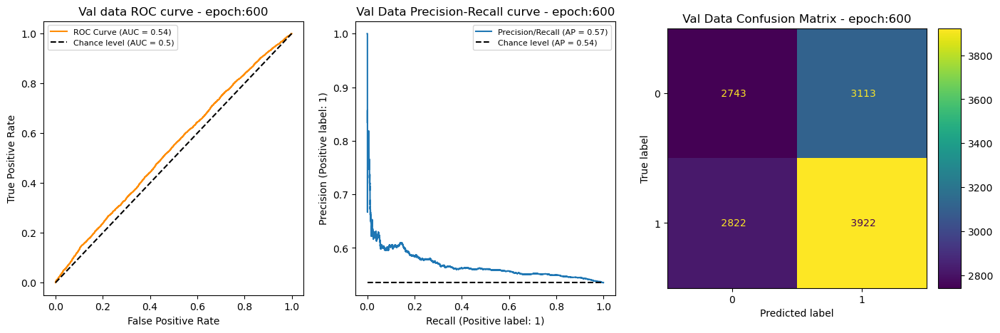

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241003_2330_ep_600
 Train Acc : 64.72 % 	 roc_auc: 0.7043 	 Precision: 0.6548 	 Recall: 0.6861 	 F1: 0.6701

 Train Label counts:  True: [6021 6579] 	 Pred: [5706 6894] 

 Train Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.64      0.60      0.62      6021
           1       0.65      0.69      0.67      6579

    accuracy                           0.65     12600
   macro avg       0.65      0.65      0.65     12600
weighted avg       0.65      0.65      0.65     12600



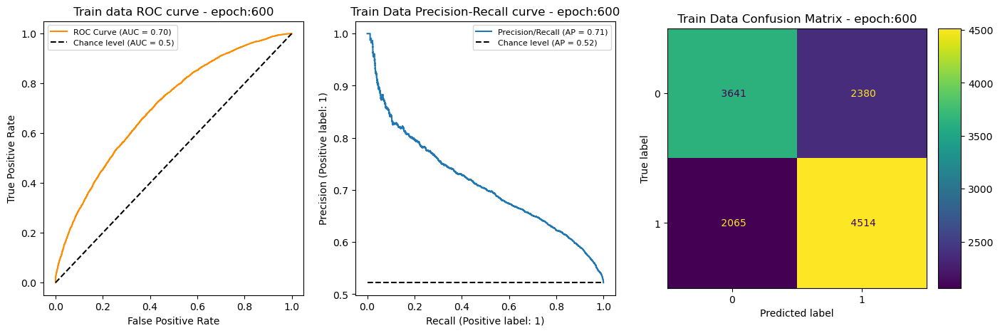

In [26]:
epoch = 600
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE)
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE)
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE)

## Baseline (cpb 600, Latent 250) ---->  (4 Layer BatchNorm 256/256/128) -- Balanced data

 - Training dataset: **20240917_2017** (BASELINE CPB: 600, Latent: 250) 
 
 - Model: **20240930_2100** : Run on 4 FC layers model (includes final layer), with Batch Norm layers and Tanh non linearities

In [28]:

AE_LATENT_DIM = 250
AE_RUNMODE = 'base'
AE_DATETIME = "20240917_2017"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20240930_2100'
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
TPSA_THRESHOLD = 70


MODEL_TYPE = 'batch_norm'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 256  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH, tpsa_threshold=TPSA_THRESHOLD)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-04 16:04:29,672 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-04 16:04:29,673 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
2024-10-04 16:04:29,673 - utils.dataloader - INFO: -  type    :  train
2024-10-04 16:04:29,674 - utils.dataloader - INFO: -  start   :  21600
2024-10-04 16:04:29,675 - utils.dataloader - INFO: -  end     :  34200
2024-10-04 16:04:29,675 - utils.dataloader - INFO: -  numrows :  12600
2024-10-04 16:04:29,676 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-04 16:04:29,677 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-04 16:04:29,677 - utils.dataloader - INFO: -  sample_size :  3
2024-10-04 16:04:29,678 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-04 16:04:29,679 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
Layer (type:depth-idx)                   Input Shape               Output Sha

### t0

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_100
 Train Acc : 72.17 % 	 roc_auc: 0.7978 	 Precision: 0.7309 	 Recall: 0.7390 	 F1: 0.7349

 Train Label counts:  True: [6021 6579] 	 Pred: [5948 6652] 

 Train Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.71      0.70      0.71      6021
           1       0.73      0.74      0.73      6579

    accuracy                           0.72     12600
   macro avg       0.72      0.72      0.72     12600
weighted avg       0.72      0.72      0.72     12600



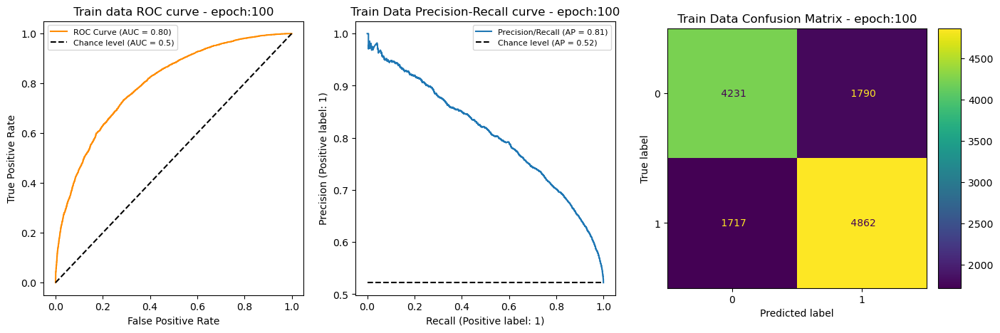

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_200
 Train Acc : 77.21 % 	 roc_auc: 0.8603 	 Precision: 0.7801 	 Recall: 0.7848 	 F1: 0.7825

 Train Label counts:  True: [6021 6579] 	 Pred: [5982 6618] 

 Train Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.76      0.76      0.76      6021
           1       0.78      0.78      0.78      6579

    accuracy                           0.77     12600
   macro avg       0.77      0.77      0.77     12600
weighted avg       0.77      0.77      0.77     12600



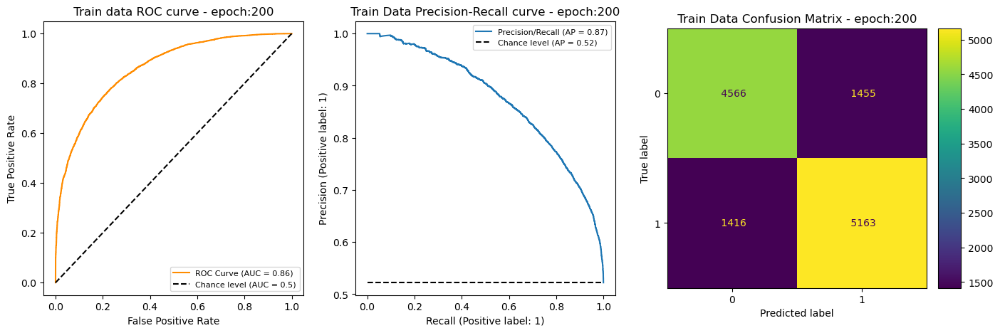

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_300
 Train Acc : 80.22 % 	 roc_auc: 0.8857 	 Precision: 0.8137 	 Recall: 0.8057 	 F1: 0.8097

 Train Label counts:  True: [6021 6579] 	 Pred: [6085 6515] 

 Train Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.79      0.80      0.79      6021
           1       0.81      0.81      0.81      6579

    accuracy                           0.80     12600
   macro avg       0.80      0.80      0.80     12600
weighted avg       0.80      0.80      0.80     12600



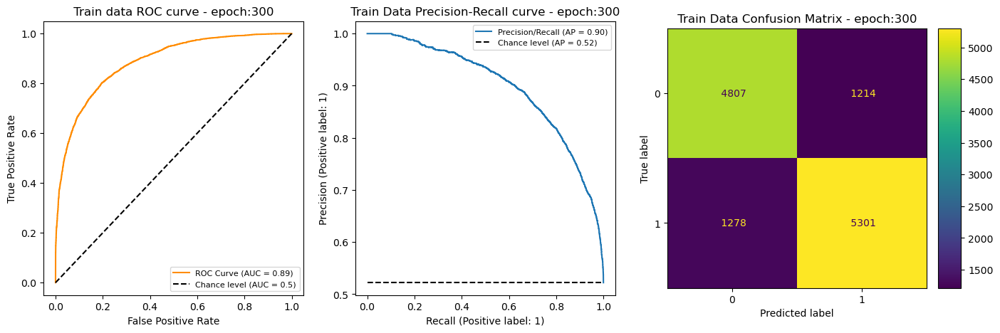

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_400
 Train Acc : 82.00 % 	 roc_auc: 0.9012 	 Precision: 0.8276 	 Recall: 0.8276 	 F1: 0.8276

 Train Label counts:  True: [6021 6579] 	 Pred: [6021 6579] 

 Train Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.81      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



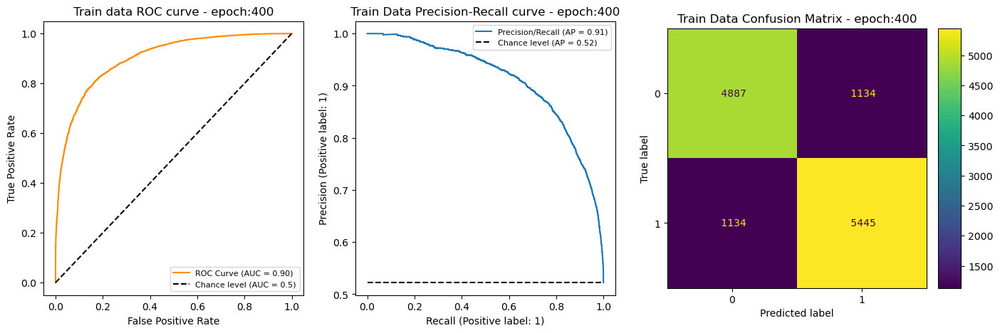

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_500
 Train Acc : 82.25 % 	 roc_auc: 0.9051 	 Precision: 0.8288 	 Recall: 0.8317 	 F1: 0.8303

 Train Label counts:  True: [6021 6579] 	 Pred: [5998 6602] 

 Train Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



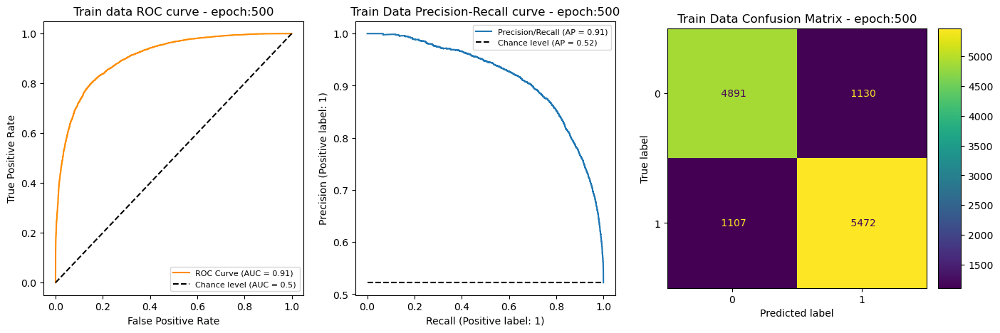

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_600
 Train Acc : 82.25 % 	 roc_auc: 0.9058 	 Precision: 0.8288 	 Recall: 0.8320 	 F1: 0.8304

 Train Label counts:  True: [6021 6579] 	 Pred: [5995 6605] 

 Train Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



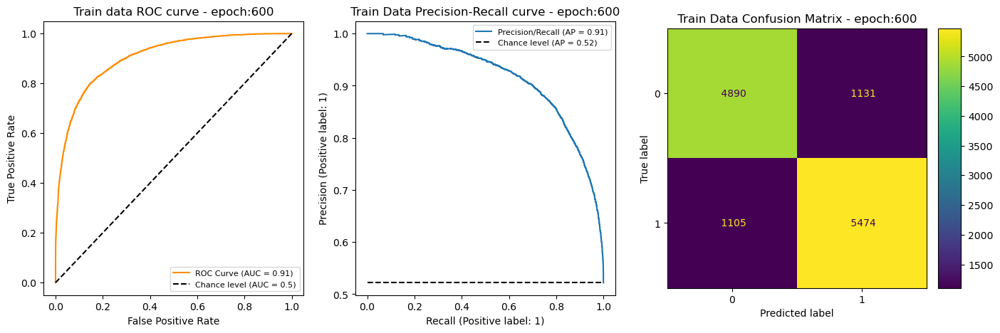

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_700
 Train Acc : 82.24 % 	 roc_auc: 0.9062 	 Precision: 0.8283 	 Recall: 0.8323 	 F1: 0.8303

 Train Label counts:  True: [6021 6579] 	 Pred: [5989 6611] 

 Train Data Classification Report: - epoch:700 

              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



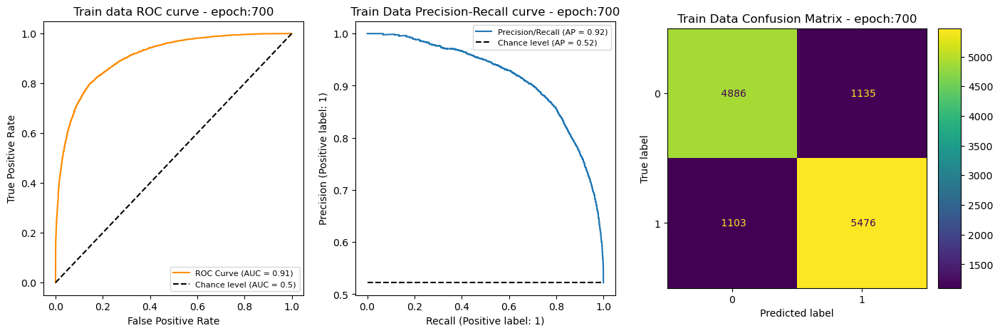

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_800
 Train Acc : 82.28 % 	 roc_auc: 0.9063 	 Precision: 0.8287 	 Recall: 0.8326 	 F1: 0.8307

 Train Label counts:  True: [6021 6579] 	 Pred: [5990 6610] 

 Train Data Classification Report: - epoch:800 

              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



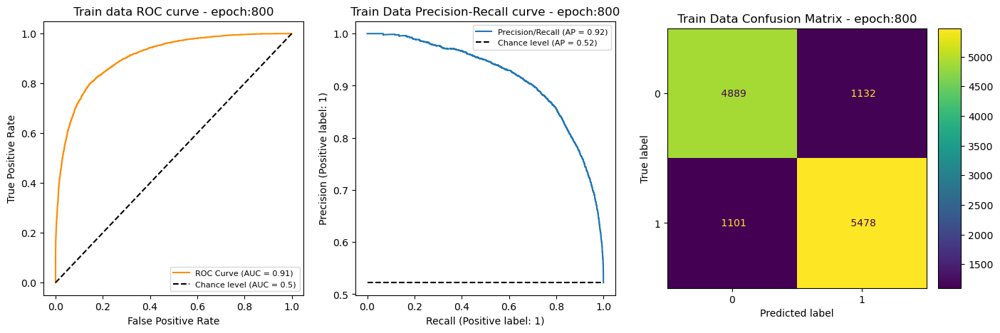

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_900
 Train Acc : 82.29 % 	 roc_auc: 0.9063 	 Precision: 0.8288 	 Recall: 0.8330 	 F1: 0.8309

 Train Label counts:  True: [6021 6579] 	 Pred: [5988 6612] 

 Train Data Classification Report: - epoch:900 

              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



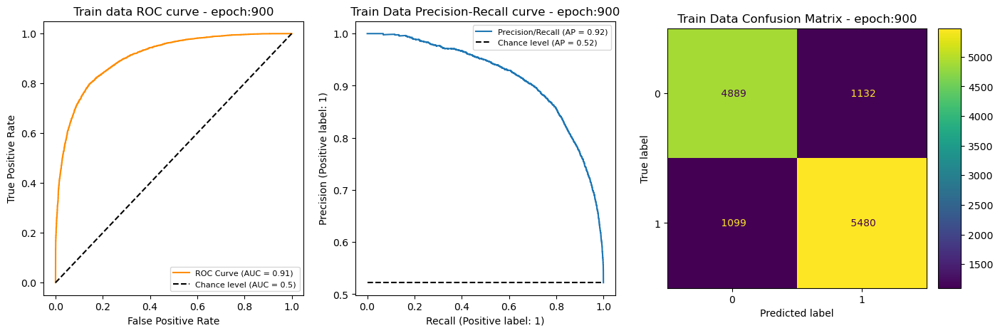

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_1000
 Train Acc : 82.29 % 	 roc_auc: 0.9063 	 Precision: 0.8289 	 Recall: 0.8328 	 F1: 0.8308

 Train Label counts:  True: [6021 6579] 	 Pred: [5990 6610] 

 Train Data Classification Report: - epoch:1000 

              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



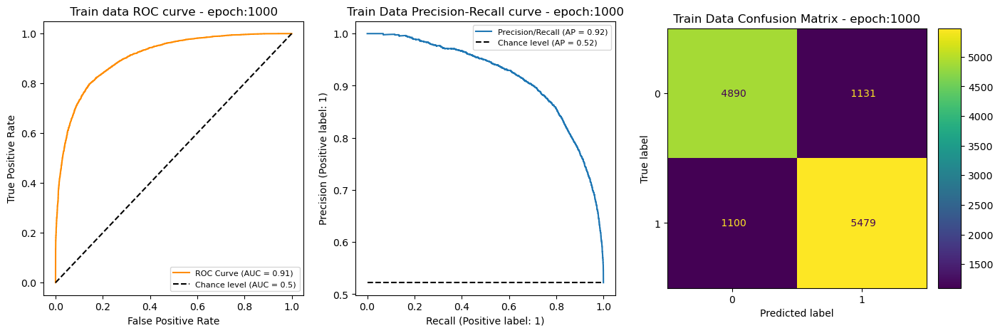

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_1100
 Train Acc : 82.31 % 	 roc_auc: 0.9063 	 Precision: 0.8289 	 Recall: 0.8331 	 F1: 0.8310

 Train Label counts:  True: [6021 6579] 	 Pred: [5988 6612] 

 Train Data Classification Report: - epoch:1100 

              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



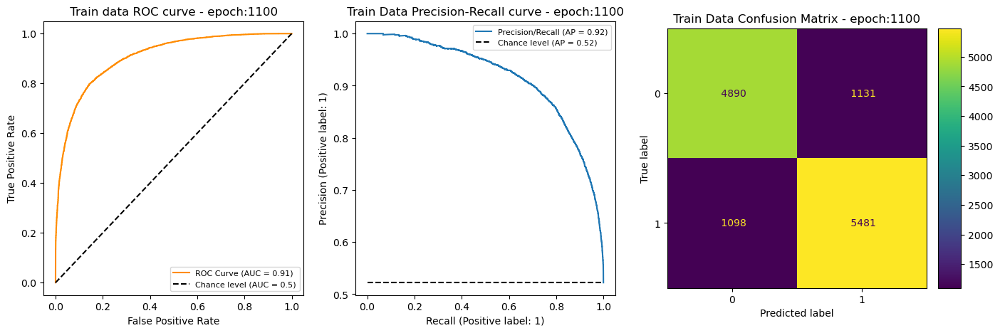

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_1200
 Train Acc : 82.34 % 	 roc_auc: 0.9063 	 Precision: 0.8294 	 Recall: 0.8331 	 F1: 0.8313

 Train Label counts:  True: [6021 6579] 	 Pred: [5992 6608] 

 Train Data Classification Report: - epoch:1200 

              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



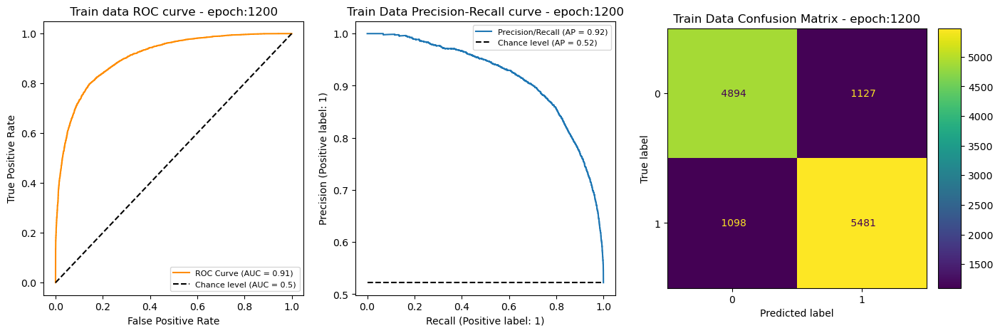

In [61]:
data_type = 'train'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600,700,800,900,1000,1100,1200]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_600
 Test  Acc : 51.26 % 	 roc_auc: 0.5192 	 Precision: 0.5163 	 Recall: 0.5370 	 F1: 0.5265

 Test Label counts:  True: [6243 6357] 	 Pred: [5988 6612] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.51      0.49      0.50      6243
           1       0.52      0.54      0.53      6357

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



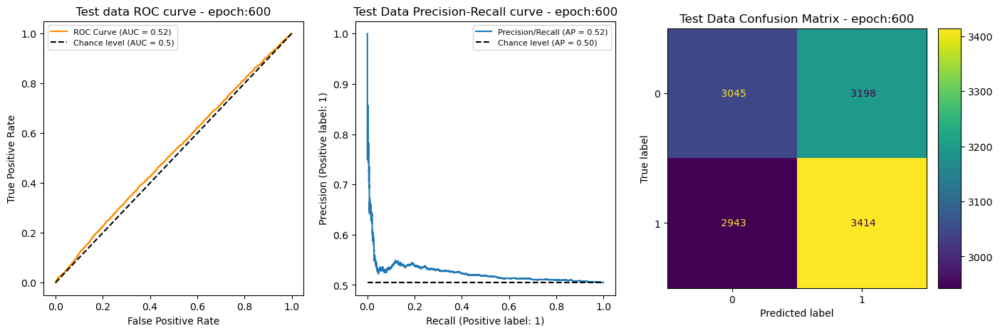

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_600
 Val   Acc : 51.02 % 	 roc_auc: 0.5130 	 Precision: 0.5426 	 Recall: 0.5399 	 F1: 0.5413

 Val Label counts:  True: [5856 6744] 	 Pred: [5890 6710] 

 Val Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.47      0.48      0.47      5856
           1       0.54      0.54      0.54      6744

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



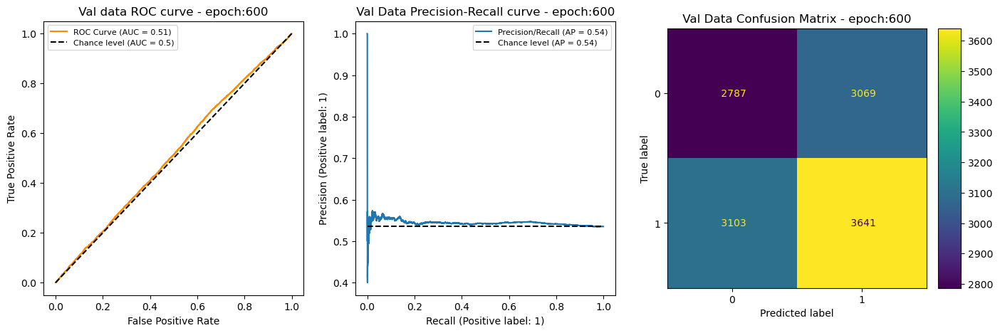

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20240930_2100_ep_600
 Train Acc : 82.25 % 	 roc_auc: 0.9058 	 Precision: 0.8288 	 Recall: 0.8320 	 F1: 0.8304

 Train Label counts:  True: [6021 6579] 	 Pred: [5995 6605] 

 Train Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.82      0.81      0.81      6021
           1       0.83      0.83      0.83      6579

    accuracy                           0.82     12600
   macro avg       0.82      0.82      0.82     12600
weighted avg       0.82      0.82      0.82     12600



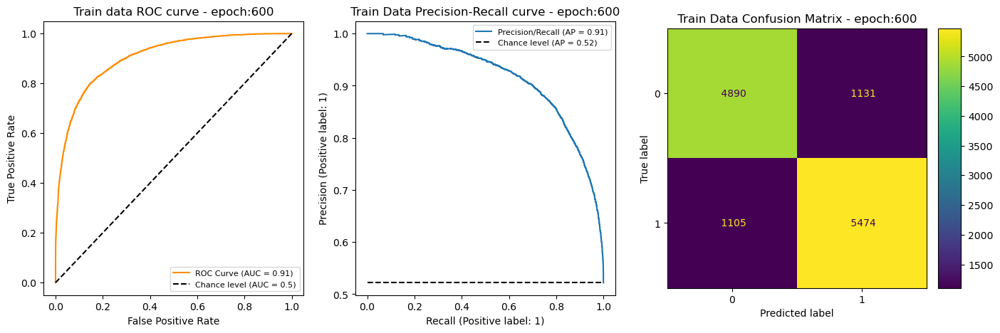

In [29]:
epoch = 600
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE)
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE)
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE)


## Baseline (cpb 600, Latent 250) ---->  (4 Layer BatchNorm 512/512/128) -- Balanced data

 - Training dataset: **20240917_2017** (BASELINE CPB: 600, Latent: 250) 
 
 - Model: **20241001_2100** : Run on 4 FC layers model (includes final layer), with Batch Norm layers and Tanh non linearities

In [30]:
AE_LATENT_DIM = 250
AE_RUNMODE = 'base'
AE_DATETIME = "20240917_2017"     # Autoencoder training - Baseline, CPB = 600, Latent 250, WD = 0.001 (SNN Factor 0)
AE_CKPTTYPE = "LAST"
RUN_DATETIME = '20241001_2100'
input_num_cols = AE_LATENT_DIM + METADATA_COLUMNS
TPSA_THRESHOLD = 70


MODEL_TYPE = 'batch_norm'
n_input    = AE_LATENT_DIM  # the embedding dimensionality 
n_hidden_1 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_2 = 512  # the number of neurons in the hidden layer of the MLP
n_hidden_3 = 128

CKPT_FILE_BASE  = f"NN_{AE_RUNMODE.lower()}_embd{COMPOUNDS_PER_BATCH}_{AE_LATENT_DIM}Ltnt_{AE_HIDDEN}_{AE_DATETIME}_{AE_CKPTTYPE}_"
CKPT_FILE = os.path.join(CKPT_PATH, CKPT_FILE_BASE +f"{RUN_DATETIME}_ep_{{ep}}")
print(CKPT_FILE)
print(CKPT_FILE.format(ep=999))

data_loader = define_inference_datasets(cellpainting_args, AE_RUNMODE, AE_DATETIME, input_num_cols, AE_CKPTTYPE, INPUT_PATH, tpsa_threshold=TPSA_THRESHOLD)
model = build_model(MODEL_TYPE, input = n_input, hidden_1 = n_hidden_1, hidden_2 = n_hidden_2, hidden_3=n_hidden_3, device =DEVICE)


2024-10-04 16:05:53,687 - utils.dataloader - INFO: -  Building CellPantingDataset for train
2024-10-04 16:05:53,688 - utils.dataloader - INFO: -  filename:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
2024-10-04 16:05:53,689 - utils.dataloader - INFO: -  type    :  train
2024-10-04 16:05:53,689 - utils.dataloader - INFO: -  start   :  21600
2024-10-04 16:05:53,690 - utils.dataloader - INFO: -  end     :  34200
2024-10-04 16:05:53,690 - utils.dataloader - INFO: -  numrows :  12600
2024-10-04 16:05:53,691 - utils.dataloader - INFO: -  names   :  None     usecols :  None
2024-10-04 16:05:53,692 - utils.dataloader - INFO: -  batch_size  :  1
2024-10-04 16:05:53,692 - utils.dataloader - INFO: -  sample_size :  3
2024-10-04 16:05:53,693 - utils.dataloader - INFO: -  compounds_per_batch :  600
2024-10-04 16:05:53,694 - utils.dataloader - INFO: -  rows per batch (chunksize) :  1800
2024

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_{ep}
./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_999
 TRAIN_INPUT:  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train.csv
 TEST_INPUT :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_test.csv
 ALL_INPUT  :  /home/kevin/WSL-shared/cellpainting/cj-datasets/output_11102023/3_sample_embeddings/3smpl_prfl_embedding_261_HashOrder_base_20240917_2017_LAST_train_sub_val.csv
 load {}
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
 Dataset size: 12600   rows per batch: 1800  tpsa_threshold: 70
Layer (type:depth-idx)                   Input Shape               Output Sha

### t0

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_100
 Test  Acc : 50.69 % 	 roc_auc: 0.5111 	 Precision: 0.5107 	 Recall: 0.5413 	 F1: 0.5255

 Test Label counts:  True: [6243 6357] 	 Pred: [5862 6738] 

 Test Data Classification Report: - epoch:100 

              precision    recall  f1-score   support

           0       0.50      0.47      0.49      6243
           1       0.51      0.54      0.53      6357

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



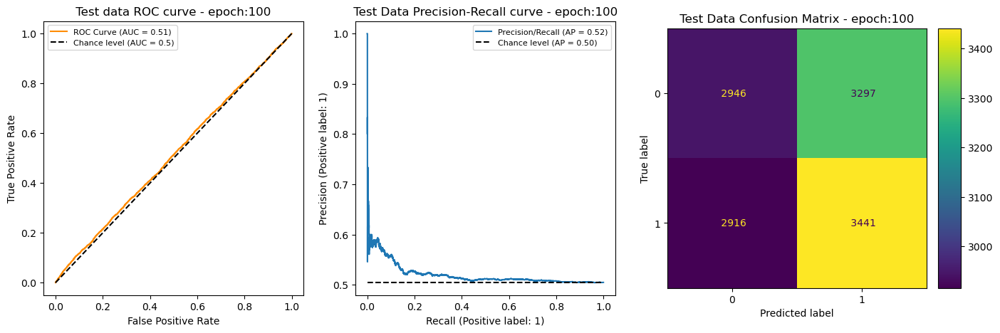

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_200
 Test  Acc : 51.24 % 	 roc_auc: 0.5089 	 Precision: 0.5164 	 Recall: 0.5271 	 F1: 0.5217

 Test Label counts:  True: [6243 6357] 	 Pred: [6111 6489] 

 Test Data Classification Report: - epoch:200 

              precision    recall  f1-score   support

           0       0.51      0.50      0.50      6243
           1       0.52      0.53      0.52      6357

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



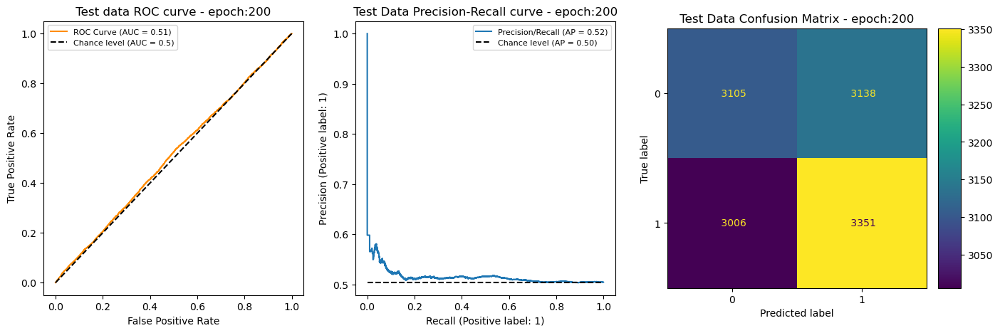

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_300
 Test  Acc : 50.95 % 	 roc_auc: 0.5117 	 Precision: 0.5131 	 Recall: 0.5440 	 F1: 0.5281

 Test Label counts:  True: [6243 6357] 	 Pred: [5861 6739] 

 Test Data Classification Report: - epoch:300 

              precision    recall  f1-score   support

           0       0.51      0.47      0.49      6243
           1       0.51      0.54      0.53      6357

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



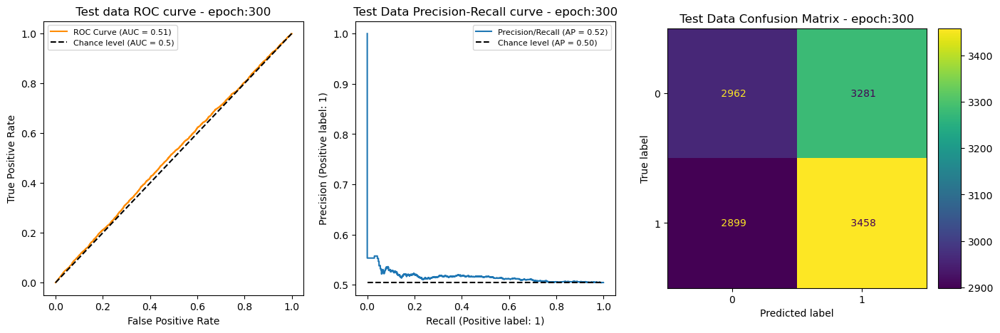

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_400
 Test  Acc : 51.29 % 	 roc_auc: 0.5131 	 Precision: 0.5168 	 Recall: 0.5319 	 F1: 0.5242

 Test Label counts:  True: [6243 6357] 	 Pred: [6058 6542] 

 Test Data Classification Report: - epoch:400 

              precision    recall  f1-score   support

           0       0.51      0.49      0.50      6243
           1       0.52      0.53      0.52      6357

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



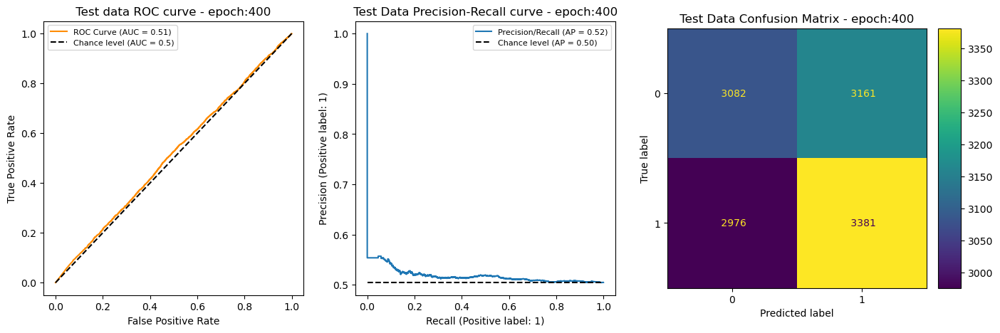

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_500
 Test  Acc : 51.20 % 	 roc_auc: 0.5139 	 Precision: 0.5158 	 Recall: 0.5348 	 F1: 0.5251

 Test Label counts:  True: [6243 6357] 	 Pred: [6008 6592] 

 Test Data Classification Report: - epoch:500 

              precision    recall  f1-score   support

           0       0.51      0.49      0.50      6243
           1       0.52      0.53      0.53      6357

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



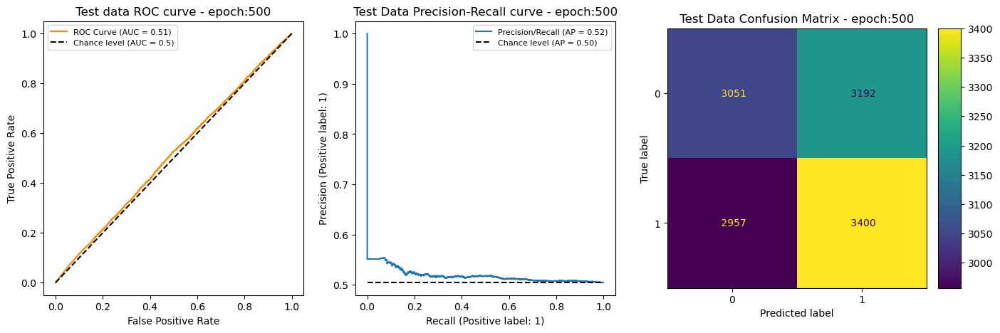

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_600
 Test  Acc : 51.32 % 	 roc_auc: 0.5140 	 Precision: 0.5168 	 Recall: 0.5381 	 F1: 0.5273

 Test Label counts:  True: [6243 6357] 	 Pred: [5981 6619] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.51      0.49      0.50      6243
           1       0.52      0.54      0.53      6357

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



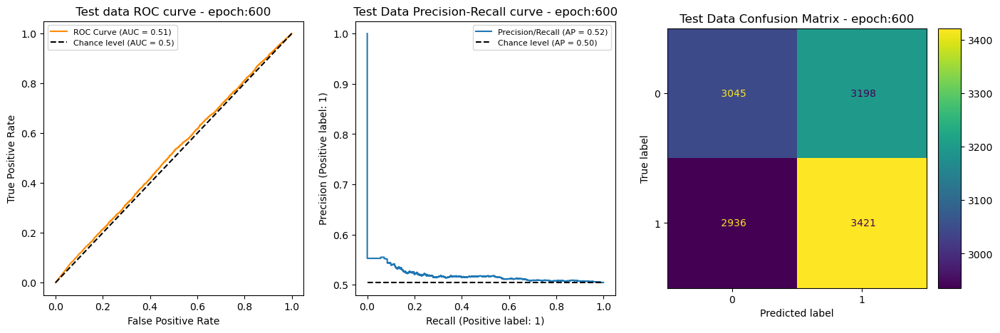

In [67]:
data_type = 'test'
# run_classification_inference(model, checkpoint_file, epoch, data_type, report = True, plot = True):
for epoch in [100,200,300,400,500,600, ]:
    run_classification_inference(model, CKPT_FILE, epoch, data_loader, data_type, DEVICE)

### t2

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_600
 Test  Acc : 51.32 % 	 roc_auc: 0.5140 	 Precision: 0.5168 	 Recall: 0.5381 	 F1: 0.5273

 Test Label counts:  True: [6243 6357] 	 Pred: [5981 6619] 

 Test Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.51      0.49      0.50      6243
           1       0.52      0.54      0.53      6357

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



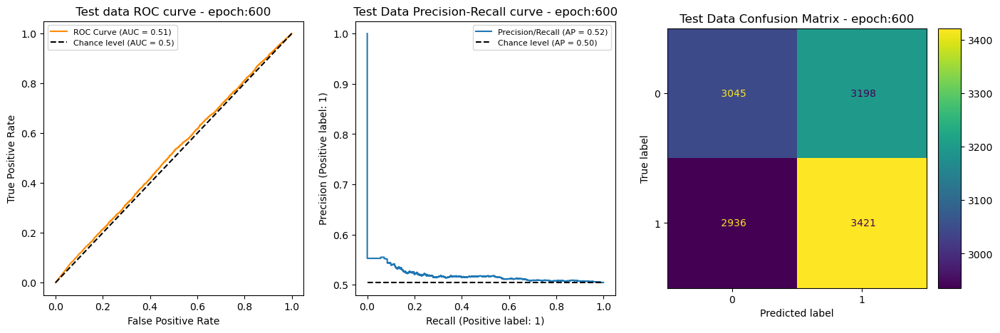

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_600
 Val   Acc : 51.09 % 	 roc_auc: 0.5114 	 Precision: 0.5438 	 Recall: 0.5344 	 F1: 0.5391

 Val Label counts:  True: [5856 6744] 	 Pred: [5973 6627] 

 Val Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.47      0.48      0.48      5856
           1       0.54      0.53      0.54      6744

    accuracy                           0.51     12600
   macro avg       0.51      0.51      0.51     12600
weighted avg       0.51      0.51      0.51     12600



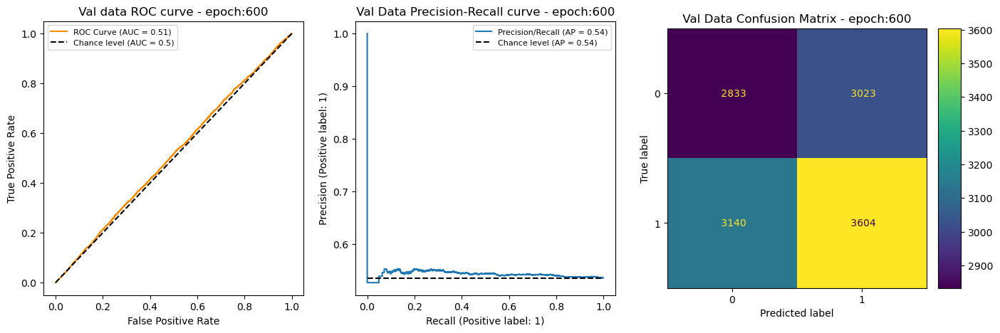

./saved_models/embedding_models/NN_base_embd600_250Ltnt_512_20240917_2017_LAST_20241001_2100_ep_600
 Train Acc : 96.48 % 	 roc_auc: 0.9943 	 Precision: 0.9664 	 Recall: 0.9661 	 F1: 0.9663

 Train Label counts:  True: [6021 6579] 	 Pred: [6023 6577] 

 Train Data Classification Report: - epoch:600 

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      6021
           1       0.97      0.97      0.97      6579

    accuracy                           0.96     12600
   macro avg       0.96      0.96      0.96     12600
weighted avg       0.96      0.96      0.96     12600



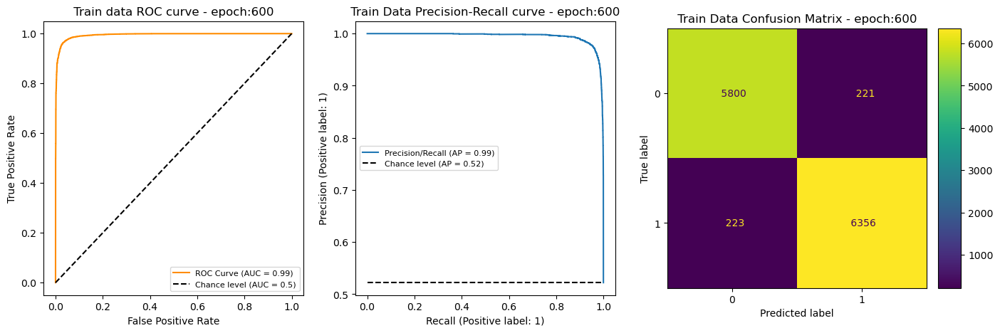

In [31]:
epoch = 600
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'test', DEVICE)
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'val', DEVICE)
run_classification_inference(model, CKPT_FILE, epoch, data_loader, 'train', DEVICE)
